In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from twython import Twython
import json
import time
from twitter import *
import seaborn as sns
import string
import nltk

In [2]:
df_1=pd.read_csv('us_leader.csv')
df_1

,date,tweet,created,fav,number of retweets,location,follower,verified,language,hashtags,tidy_tweet
0,14,Trump says think Michigan Dem vote 'Sleepy Joe...,8,0,0,USA,3353,False,en,[],Trump says think Michigan Dem vote Sleepy Joe...
1,14,@WhiteHouse Lie. Deflect. Attack. Standard tru...,6,0,0,USA,40,False,en,[],WhiteHouse Lie Deflect Attack Standard tru...
2,14,@schraubd I big fan Cuomo's sake beating Trump...,20,0,0,USA,64,False,en,[],schraubd I big fan Cuomo s sake beating Trump...
3,14,"Here go again, Trumps blame game. Now W.H.O., ...",18,0,0,USA,35,False,en,[],Here go again Trumps blame game Now W H O ...
4,14,@MysterySolvent Casting blame. Trump loves ide...,12,0,0,USA,1984,False,en,[],MysterySolvent Casting blame Trump loves ide...
...,...,...,...,...,...,...,...,...,...,...,...
58690,20,@DonaldJTrumpJr Trump kids committing crimes a...,17,0,0,USA,274,False,en,[],DonaldJTrumpJr Trump kids committing crimes a...
58691,20,People retweeting Biden / Trump polling number...,30,2,0,USA,465,False,en,[],People retweeting Biden Trump polling number...
58692,20,@wickedwitchkck @jennyrachelpal @Canupstra @re...,8,0,0,USA,136,False,en,[],wickedwitchkck jennyrachelpal Canupstra re...
58693,20,"@scaryfoxx He made decision me, blocked coming...",30,6,1,USA,15570,False,en,[],scaryfoxx He made decision me blocked coming...


In [3]:
df_1=df_1[df_1['language']=='en']
df_1

,date,tweet,created,fav,number of retweets,location,follower,verified,language,hashtags,tidy_tweet
0,14,Trump says think Michigan Dem vote 'Sleepy Joe...,8,0,0,USA,3353,False,en,[],Trump says think Michigan Dem vote Sleepy Joe...
1,14,@WhiteHouse Lie. Deflect. Attack. Standard tru...,6,0,0,USA,40,False,en,[],WhiteHouse Lie Deflect Attack Standard tru...
2,14,@schraubd I big fan Cuomo's sake beating Trump...,20,0,0,USA,64,False,en,[],schraubd I big fan Cuomo s sake beating Trump...
3,14,"Here go again, Trumps blame game. Now W.H.O., ...",18,0,0,USA,35,False,en,[],Here go again Trumps blame game Now W H O ...
4,14,@MysterySolvent Casting blame. Trump loves ide...,12,0,0,USA,1984,False,en,[],MysterySolvent Casting blame Trump loves ide...
...,...,...,...,...,...,...,...,...,...,...,...
58690,20,@DonaldJTrumpJr Trump kids committing crimes a...,17,0,0,USA,274,False,en,[],DonaldJTrumpJr Trump kids committing crimes a...
58691,20,People retweeting Biden / Trump polling number...,30,2,0,USA,465,False,en,[],People retweeting Biden Trump polling number...
58692,20,@wickedwitchkck @jennyrachelpal @Canupstra @re...,8,0,0,USA,136,False,en,[],wickedwitchkck jennyrachelpal Canupstra re...
58693,20,"@scaryfoxx He made decision me, blocked coming...",30,6,1,USA,15570,False,en,[],scaryfoxx He made decision me blocked coming...


In [4]:
df_1=df_1.dropna()
df_1

,date,tweet,created,fav,number of retweets,location,follower,verified,language,hashtags,tidy_tweet
0,14,Trump says think Michigan Dem vote 'Sleepy Joe...,8,0,0,USA,3353,False,en,[],Trump says think Michigan Dem vote Sleepy Joe...
1,14,@WhiteHouse Lie. Deflect. Attack. Standard tru...,6,0,0,USA,40,False,en,[],WhiteHouse Lie Deflect Attack Standard tru...
2,14,@schraubd I big fan Cuomo's sake beating Trump...,20,0,0,USA,64,False,en,[],schraubd I big fan Cuomo s sake beating Trump...
3,14,"Here go again, Trumps blame game. Now W.H.O., ...",18,0,0,USA,35,False,en,[],Here go again Trumps blame game Now W H O ...
4,14,@MysterySolvent Casting blame. Trump loves ide...,12,0,0,USA,1984,False,en,[],MysterySolvent Casting blame Trump loves ide...
...,...,...,...,...,...,...,...,...,...,...,...
58690,20,@DonaldJTrumpJr Trump kids committing crimes a...,17,0,0,USA,274,False,en,[],DonaldJTrumpJr Trump kids committing crimes a...
58691,20,People retweeting Biden / Trump polling number...,30,2,0,USA,465,False,en,[],People retweeting Biden Trump polling number...
58692,20,@wickedwitchkck @jennyrachelpal @Canupstra @re...,8,0,0,USA,136,False,en,[],wickedwitchkck jennyrachelpal Canupstra re...
58693,20,"@scaryfoxx He made decision me, blocked coming...",30,6,1,USA,15570,False,en,[],scaryfoxx He made decision me blocked coming...


In [5]:
# sns.distplot(df_1['date']);
# # plt.savefig('count_freq_ny.pdf')

# Set date

In [6]:
df_1.date.unique()

array([14, 15, 16, 17, 18, 19, 20], dtype=int64)

In [7]:
# df_1=df_1[df_1['date']==16]
# df_1

# Set Location

In [8]:
df_1.location.unique()

array(['USA'], dtype=object)

In [9]:
# df_1=df_1[df_1['location']=='NY']
# df_1

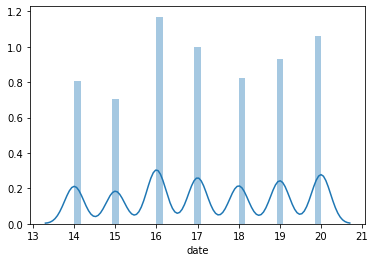

In [10]:
sns.distplot(df_1['date']);
# plt.savefig('count_freq_ny.pdf')

In [11]:
df_1.corr()

,date,created,fav,number of retweets,follower,verified
date,1.000000,-0.002894,-0.004034,-0.003119,-0.012246,-0.034659
created,-0.002894,1.000000,-0.010131,-0.011060,0.000429,-0.018172
fav,-0.004034,-0.010131,1.000000,0.877958,0.147991,0.103539
number of retweets,-0.003119,-0.011060,0.877958,1.000000,0.168630,0.117569
follower,-0.012246,0.000429,0.147991,0.168630,1.000000,0.322758
verified,-0.034659,-0.018172,0.103539,0.117569,0.322758,1.000000


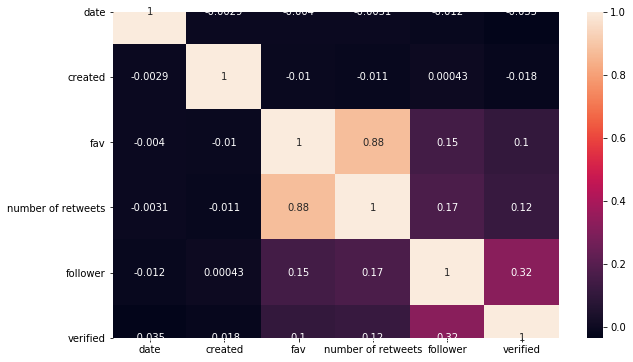

In [12]:
plt.figure(figsize=(10,6))
sns.heatmap(df_1.corr(), annot=True)
# plt.savefig('corr.pdf')

In [13]:
df_1=df_1.drop(columns=['tidy_tweet'])

In [14]:
df_1['date']

0        14
1        14
2        14
3        14
4        14
         ..
58690    20
58691    20
58692    20
58693    20
58694    20
Name: date, Length: 57080, dtype: int64

In [15]:
df_1.drop_duplicates(subset ="tweet",keep = False, inplace = True)
df_1

,date,tweet,created,fav,number of retweets,location,follower,verified,language,hashtags
0,14,Trump says think Michigan Dem vote 'Sleepy Joe...,8,0,0,USA,3353,False,en,[]
1,14,@WhiteHouse Lie. Deflect. Attack. Standard tru...,6,0,0,USA,40,False,en,[]
2,14,@schraubd I big fan Cuomo's sake beating Trump...,20,0,0,USA,64,False,en,[]
3,14,"Here go again, Trumps blame game. Now W.H.O., ...",18,0,0,USA,35,False,en,[]
4,14,@MysterySolvent Casting blame. Trump loves ide...,12,0,0,USA,1984,False,en,[]
...,...,...,...,...,...,...,...,...,...,...
58690,20,@DonaldJTrumpJr Trump kids committing crimes a...,17,0,0,USA,274,False,en,[]
58691,20,People retweeting Biden / Trump polling number...,30,2,0,USA,465,False,en,[]
58692,20,@wickedwitchkck @jennyrachelpal @Canupstra @re...,8,0,0,USA,136,False,en,[]
58693,20,"@scaryfoxx He made decision me, blocked coming...",30,6,1,USA,15570,False,en,[]


In [16]:
list1=df_1.values.tolist()
# list1

In [17]:
i=0
while i < len(list1):
    list1[i].append(len(list1[i][1])) 
    i=i+1

In [18]:
df_1=pd.DataFrame(list1,columns=['date', 'tweet', 'created', 'fav', 'number of retweets', 'location',
       'follower', 'verified', 'language', 'hashtags','length'])
df_1

,date,tweet,created,fav,number of retweets,location,follower,verified,language,hashtags,length
0,14,Trump says think Michigan Dem vote 'Sleepy Joe...,8,0,0,USA,3353,False,en,[],120
1,14,@WhiteHouse Lie. Deflect. Attack. Standard tru...,6,0,0,USA,40,False,en,[],69
2,14,@schraubd I big fan Cuomo's sake beating Trump...,20,0,0,USA,64,False,en,[],57
3,14,"Here go again, Trumps blame game. Now W.H.O., ...",18,0,0,USA,35,False,en,[],246
4,14,@MysterySolvent Casting blame. Trump loves ide...,12,0,0,USA,1984,False,en,[],95
...,...,...,...,...,...,...,...,...,...,...,...
57075,20,@DonaldJTrumpJr Trump kids committing crimes a...,17,0,0,USA,274,False,en,[],108
57076,20,People retweeting Biden / Trump polling number...,30,2,0,USA,465,False,en,[],90
57077,20,@wickedwitchkck @jennyrachelpal @Canupstra @re...,8,0,0,USA,136,False,en,[],180
57078,20,"@scaryfoxx He made decision me, blocked coming...",30,6,1,USA,15570,False,en,[],115


In [19]:
df_1=df_1[df_1['language']=='en']
df_1

,date,tweet,created,fav,number of retweets,location,follower,verified,language,hashtags,length
0,14,Trump says think Michigan Dem vote 'Sleepy Joe...,8,0,0,USA,3353,False,en,[],120
1,14,@WhiteHouse Lie. Deflect. Attack. Standard tru...,6,0,0,USA,40,False,en,[],69
2,14,@schraubd I big fan Cuomo's sake beating Trump...,20,0,0,USA,64,False,en,[],57
3,14,"Here go again, Trumps blame game. Now W.H.O., ...",18,0,0,USA,35,False,en,[],246
4,14,@MysterySolvent Casting blame. Trump loves ide...,12,0,0,USA,1984,False,en,[],95
...,...,...,...,...,...,...,...,...,...,...,...
57075,20,@DonaldJTrumpJr Trump kids committing crimes a...,17,0,0,USA,274,False,en,[],108
57076,20,People retweeting Biden / Trump polling number...,30,2,0,USA,465,False,en,[],90
57077,20,@wickedwitchkck @jennyrachelpal @Canupstra @re...,8,0,0,USA,136,False,en,[],180
57078,20,"@scaryfoxx He made decision me, blocked coming...",30,6,1,USA,15570,False,en,[],115


In [20]:
df_1=df_1[df_1['length']<400]
df_1
# df_1[df_1['length']>300]

,date,tweet,created,fav,number of retweets,location,follower,verified,language,hashtags,length
0,14,Trump says think Michigan Dem vote 'Sleepy Joe...,8,0,0,USA,3353,False,en,[],120
1,14,@WhiteHouse Lie. Deflect. Attack. Standard tru...,6,0,0,USA,40,False,en,[],69
2,14,@schraubd I big fan Cuomo's sake beating Trump...,20,0,0,USA,64,False,en,[],57
3,14,"Here go again, Trumps blame game. Now W.H.O., ...",18,0,0,USA,35,False,en,[],246
4,14,@MysterySolvent Casting blame. Trump loves ide...,12,0,0,USA,1984,False,en,[],95
...,...,...,...,...,...,...,...,...,...,...,...
57075,20,@DonaldJTrumpJr Trump kids committing crimes a...,17,0,0,USA,274,False,en,[],108
57076,20,People retweeting Biden / Trump polling number...,30,2,0,USA,465,False,en,[],90
57077,20,@wickedwitchkck @jennyrachelpal @Canupstra @re...,8,0,0,USA,136,False,en,[],180
57078,20,"@scaryfoxx He made decision me, blocked coming...",30,6,1,USA,15570,False,en,[],115


In [21]:
df_1=df_1[df_1['length']>60]
# df_1

In [22]:
import spacy
nlp = spacy.load('en_core_web_sm')

# Cleaning the data

In [23]:
import re, string 
import pandas as pd   
from collections import defaultdict
import spacy
from sklearn.manifold import TSNE
from nltk.corpus import stopwords
STOPWORDS = set(stopwords.words('english'))
from gensim.models import Word2Vec
%matplotlib inline

# df = pd.read_csv('bbc-text.csv')

def clean_text(text):
    '''Make text lowercase, remove text in square brackets, remove punctuation and remove words containing numbers.'''
    text = text.lower()
    text = re.sub(r'\[.*?\]', '', text)
    text = re.sub(r'[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub(r'\w*\d\w*', '', text)
    
    # Remove a sentence if it is only one word long
    if len(text) > 2:
        return ' '.join(word for word in text.split() if word not in STOPWORDS)

df_1['tidy_tweet'] = pd.DataFrame(df_1.tweet.apply(lambda x: clean_text(x)))


unable to import 'smart_open.gcs', disabling that module
C:\Users\Che10\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [24]:
df_1[df_1['tidy_tweet']==2]

,date,tweet,created,fav,number of retweets,location,follower,verified,language,hashtags,length,tidy_tweet


# Lemmatizing the data

In [25]:
def lemmatizer(text):        
    sent = []
#     print(type(text))
    if(type(text) == str):
        doc = nlp(text)
        for word in doc:
            sent.append(word.lemma_)
#         print(sent)    
        return " ".join(sent)

    else:
        sent='none'
        return sent
    

In [26]:
# df_1["text_lemmatize"] = df_1['tidy_tweet'].apply(lambda title: ' '.join([word for word in title.split() if word not in stop_words1]))
df_1["text_lemmatize"] =pd.DataFrame(df_1.tidy_tweet.apply(lemmatizer))
df_1['text_lemmatize_clean'] = pd.DataFrame(df_1['text_lemmatize'].str.replace('-PRON-',''))

C:\Users\Che10\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\Che10\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [27]:
# df_1

In [28]:
df_1=df_1[df_1['text_lemmatize']!='none']
df_1

,date,tweet,created,fav,number of retweets,location,follower,verified,language,hashtags,length,tidy_tweet,text_lemmatize,text_lemmatize_clean
0,14,Trump says think Michigan Dem vote 'Sleepy Joe...,8,0,0,USA,3353,False,en,[],120,trump says think michigan dem vote sleepy joe ...,trump say think michigan dem vote sleepy joe s...,trump say think michigan dem vote sleepy joe s...
1,14,@WhiteHouse Lie. Deflect. Attack. Standard tru...,6,0,0,USA,40,False,en,[],69,whitehouse lie deflect attack standard trump o...,whitehouse lie deflect attack standard trump o...,whitehouse lie deflect attack standard trump o...
3,14,"Here go again, Trumps blame game. Now W.H.O., ...",18,0,0,USA,35,False,en,[],246,go trumps blame game sided much china unlike r...,go trumps blame game side much china unlike re...,go trumps blame game side much china unlike re...
4,14,@MysterySolvent Casting blame. Trump loves ide...,12,0,0,USA,1984,False,en,[],95,mysterysolvent casting blame trump loves idea ...,mysterysolvent casting blame trump love idea a...,mysterysolvent casting blame trump love idea a...
6,14,@DeanObeidallah Most Republicans lost minds. I...,6,0,0,USA,40,False,en,[],82,deanobeidallah republicans lost minds happens ...,deanobeidallah republicans lose mind happen tr...,deanobeidallah republicans lose mind happen tr...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57075,20,@DonaldJTrumpJr Trump kids committing crimes a...,17,0,0,USA,274,False,en,[],108,donaldjtrumpjr trump kids committing crimes ab...,donaldjtrumpjr trump kid commit crime abuse ex...,donaldjtrumpjr trump kid commit crime abuse ex...
57076,20,People retweeting Biden / Trump polling number...,30,2,0,USA,465,False,en,[],90,people retweeting biden trump polling numbers ...,people retweete biden trump polling number lik...,people retweete biden trump polling number lik...
57077,20,@wickedwitchkck @jennyrachelpal @Canupstra @re...,8,0,0,USA,136,False,en,[],180,wickedwitchkck jennyrachelpal canupstra realdo...,wickedwitchkck jennyrachelpal canupstra realdo...,wickedwitchkck jennyrachelpal canupstra realdo...
57078,20,"@scaryfoxx He made decision me, blocked coming...",30,6,1,USA,15570,False,en,[],115,scaryfoxx made decision blocked coming facts b...,scaryfoxx make decision block coming fact bide...,scaryfoxx make decision block coming fact bide...


# date

In [29]:
# df_1.location.unique()

In [30]:
# df_11=df_1[df_1['location']=='chicago']
# df_11

In [31]:
# df_11.date.unique()

In [32]:
# df_11=df_1[df_1['date']==11]
# df_11

# Most frequent words

In [33]:
from sklearn.feature_extraction.text import CountVectorizer
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_words(df_1['text_lemmatize_clean'], 40)
for word, freq in common_words:
    print(word, freq)
df1 = pd.DataFrame(common_words, columns = ['word' , 'count'])

trump 50027
say 6372
realdonaldtrump 5749
people 5259
president 4658
like 4552
amp 3936
coronavirus 3595
know 3462
think 3226
make 3125
want 3044
state 2816
biden 2781
donald 2702
time 2532
vote 2511
lie 2362
need 2278
china 2136
right 2100
country 2025
trumps 2020
governor 1966
good 1936
pandemic 1878
blame 1832
thing 1761
tell 1751
supporter 1749
test 1709
virus 1691
try 1686
work 1676
america 1664
world 1653
come 1624
day 1623
americans 1570
bad 1553


In [34]:
import plotly.express as px
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_bigram(df_1['text_lemmatize_clean'], 80)
for word, freq in common_words:
    print(word, freq)
df2 = pd.DataFrame(common_words, columns = ['word' , 'count'])
fig = px.bar(df2, x='word', y='count')
fig.update_layout(title_text='Comment bigram count top 20', template="plotly_white")
fig.show()

donald trump 2388
president trump 2081
trump say 1684
trump supporter 1321
trump administration 909
realdonaldtrump trump 682
white house 673
world health 637
like trump 632
vote trump 625
health organization 621
trump want 570
say trump 556
task force 446
trump make 416
think trump 399
trump know 396
trump lie 366
joe biden 359
trump amp 352
presssec realdonaldtrump 352
support trump 343
stimulus check 343
press conference 338
people die 338
know trump 325
trump tell 317
trump coronavirus 315
united states 312
look like 305
stay home 305
trump try 302
trump think 297
trump win 295
blame trump 291
american people 290
halt funding 283
trump rally 283
trump campaign 269
fox news 266
coronavirus task 259
president donald 258
reopen economy 257
trump president 256
new york 250
watch trump 244
hate trump 240
coronavirus response 236
vote biden 234
trump announce 233
trump tweet 233
trump like 232
trump blame 229
social distancing 228
small business 225
trump use 221
year trump 220
biden tru

In [35]:
# def get_top_n_trigram(corpus, n=None):
#     vec = CountVectorizer(ngram_range=(3, 3), stop_words='english').fit(corpus)
#     bag_of_words = vec.transform(corpus)
#     sum_words = bag_of_words.sum(axis=0) 
#     words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
#     words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
#     return words_freq[:n]
# common_words = get_top_n_trigram(df_1['text_lemmatize_clean'], 40)
# for word, freq in common_words:
#     print(word, freq)
# df3 = pd.DataFrame(common_words, columns = ['word' , 'count'])

In [36]:
# def get_top_n_4gram(corpus, n=None):
#     vec = CountVectorizer(ngram_range=(4, 4), stop_words='english').fit(corpus)
#     bag_of_words = vec.transform(corpus)
#     sum_words = bag_of_words.sum(axis=0) 
#     words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
#     words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
#     return words_freq[:n]
# common_words = get_top_n_4gram(df_1['text_lemmatize_clean'], 20)
# for word, freq in common_words:
#     print(word, freq)
# df3 = pd.DataFrame(common_words, columns = ['word' , 'count'])

In [37]:
sentences = [row.split() for row in df_1['text_lemmatize_clean']]
word_freq = defaultdict(int)
for sent in sentences:
    for i in sent:
        word_freq[i] += 1
        
sorted(word_freq, key=word_freq.get, reverse=True)[:20]

['trump',
 'not',
 '"',
 'say',
 'get',
 'realdonaldtrump',
 'people',
 'go',
 'be',
 '’',
 'president',
 'do',
 'like',
 '’s',
 'amp',
 'coronavirus',
 'know',
 'think',
 's',
 'make']

# word count map

In [38]:
all_words = ' '.join([text for text in df_1['text_lemmatize_clean']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
# plt.savefig('trump_wordmap.pdf')
plt.show()

#  Word2vec

In [39]:
w2v_model = Word2Vec(min_count=25,
                     window=5,
                     size=100,
                     workers=4)
                     
w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_model.iter)
w2v_model.init_sims(replace=True)

C:\Users\Che10\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning:

Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).



In [40]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()

In [41]:
def sentiment_analyzer_scores(sentence):
    score = analyser.polarity_scores(sentence)
#     print("{:-<40} {}".format(sentence, str(score)))
#     print(type(score))
    return score

In [42]:
k=sentiment_analyzer_scores("The phone is super cool.")

In [43]:
k9=df_1.values.tolist()
# k9

In [44]:
i=0
while i < len(k9):
    k=sentiment_analyzer_scores(k9[i][1])
    k9[i].append(k['neg'])
    k9[i].append(k['neu'])
    k9[i].append(k['pos'])
    k9[i].append(k['compound'])
    print(k9[i][14], '  ', k9[i][15],'  ',k9[i][16],'   ',k9[i][17])
    print(k9[i][1])
    print("     -------------   ")
    i=i+1       

0.0    0.872    0.128     0.296
Trump says think Michigan Dem vote 'Sleepy Joe' surviving coronavirus - Fox News https://t.co/500rxNrjTN via @GoogleNews
     -------------   
0.307    0.693    0.0     -0.4767
@WhiteHouse Lie. Deflect. Attack. Standard trump operating procedure.
     -------------   
0.062    0.828    0.11     0.4278
Here go again, Trumps blame game. Now W.H.O., sided much China. Unlike republicans , use little video clips Democrats. Democrats give long videos Trump context. So here's hypocrite Trump PRAISING CHINA'S handling COVID-19. https://t.co/PNk525WUKB
     -------------   
0.126    0.421    0.453     0.7351
@MysterySolvent Casting blame. Trump loves idea absolute power accept mantle power responsible.
     -------------   
0.19    0.81    0.0     -0.3774
@DeanObeidallah Most Republicans lost minds. It happens try make sense Trump says.
     -------------   
0.365    0.635    0.0     -0.8481
@KarenFDuncan1 They concerned pushing agenda expense majority Americans 

0.105    0.895    0.0     -0.6249
@baconator_fts @RealKyleKeefer @mets69738615 @jr_magneto @cambo_ranch @darrenrovell Hahaa .. u cant snap ur fingers open Francis. Even Trump realizes isnt possible. Everyone wants sports back.. costing money shut wanting back knowing reality crisis two different things dude
     -------------   
0.0    0.756    0.244     0.4404
AP Interview: Sanders says opposing Biden 'irresponsible’ supporting Trump https://t.co/RG550enfk9
     -------------   
0.0    1.0    0.0     0.0
Trump announces US halt funding World Health Organization coronavirus response https://t.co/lHa611nTI7
     -------------   
0.297    0.645    0.058     -0.8673
@RepChrisStewart @DrTedros @WHO This DUMB cost MORE American lives Chris. Neither Trump smart enough initially comprehend data, let alone keep new data changes models. So, blame WHO exclude data future use, even still clear picture.
     -------------   
0.152    0.66    0.188     0.2732
@PhillyComptonMW Michael I'm edge trump

0.14    0.608    0.252     0.5719
YESTERDAY: Trump interrupted daily coronavirus task force briefing play heavily-edited, campaign-style highlight reel video clips soundbites praising steps administration taken combat virus last four months.
     -------------   
0.0    0.791    0.209     0.4404
President Trump said Tuesday “very, good relationship” California Gov. Gavin Newsom. https://t.co/EmjDZzxkgZ
     -------------   
0.283    0.386    0.331     0.4753
@maddow Trump supporters either Ignorant evil Rich, love wrestling, one spectators, one owners! And ignorant spectators fuel fires commerce rich. Circle Life (I mean Death).
     -------------   
0.223    0.777    0.0     -0.3182
@ThePlumLineGS @HendricksDanny7 They lost 163,000 votes. Donald Trump 22k.
     -------------   
0.494    0.439    0.067     -0.9612
trump could stand middle fifth ave brutally murder someone people still vote him. bother. hate us want us dead they’re getting want. always do.
     -------------   
0.0    1

0.324    0.676    0.0     -0.8625
Trump’s outbreak response criminal awful, COVID-19 came Obama administration downright scary see right wing reaction (of elected officials chuds) massive government mandated shutdowns.
     -------------   
0.097    0.747    0.156     0.2023
@Debra4KAG @RobertPhilbri12 US Medicine worked even better politicized medical establishment resistant using hydroxychloroquine. A doc Dennis Prager today revealed stupidly unscientific politicized hospital (and doubtless others).https://t.co/6yHgVK6Cvz
     -------------   
0.0    1.0    0.0     0.0
@mcsuggafree @woundedbear He’s tho... he’s image. Says wants, gets messsge (that message TRUMP), doesn’t really answer questions, spews.
     -------------   
0.298    0.702    0.0     -0.6249
Deceive. Deny. Deflect. #GOP #Trump #WHO Trump suspends U.S. funding World Health Organization https://t.co/fPMOZs37ZO
     -------------   
0.0    1.0    0.0     0.0
Dude least say going revise domestic response "Trump announces

0.245    0.441    0.314     0.34
Notice trends Trump's approval rating hits low points? &gt;When strong, appear weak. https://t.co/HEHfu4vtPq
     -------------   
0.312    0.688    0.0     -0.7777
It’s War! Andrew Cuomo Threatens To Sue Trump Admin If White House Orders State To Open https://t.co/hfexTvK6Gc
     -------------   
0.188    0.647    0.165     -0.1779
Trump defunded World Health Organization afternoon dreaded daily #TrumpPressConf. It clearly low point today’s idiocy, highlight, Trump succinctly summing job administration done #COVID19. https://t.co/ZkaSuL8mWN
     -------------   
0.084    0.719    0.198     0.4404
Of course Trump ceasing funding WHO. He needs free cash pay Putin 😉
     -------------   
0.228    0.772    0.0     -0.7506
I suppose Trump: blaming WHO lack action. And let's forget, Trump turned WHO's offer testing kits. Trump announces 'halt' US funding World Health Organization amid coronavirus pandemic https://t.co/Kv8iDiZzJ1
     -------------   
0.0    

0.117    0.519    0.364     0.6908
@IBiegen @politico @SenatorCollins She dare gainsay Supreme Leader god? Probably permission Trump Party likely lose Maine.
     -------------   
0.179    0.821    0.0     -0.5423
We need reign GOP &amp; Trump monster in. Vote Biden 2020 he's political enemy I'd rather have.
     -------------   
0.317    0.618    0.065     -0.8221
Trump neocon neolib. He's nationalist/populist, upsetting ideological wings political establishment. Republicans enabling chaos magician, creating monster can't control. They playing fire &amp; sacrificing human lives process.
     -------------   
0.15    0.538    0.311     0.69
@donnabrazile Here problem Donna; Anything Trump says does, even though clearly effective helpful (just ask Devin Nunes Mario Cuomo) disdained, scorned lied MSM. And well!
     -------------   
0.157    0.737    0.106     -0.2732
@aolbites @krystalball Who people name names. Which groups hurt Biden policies versus trump second term. Be specific plea

0.368    0.54    0.092     -0.9299
@RepAdamSchiff Trump holds live conferences corrupt CIA media cant spin narrative &amp; create lies. Like fake bullshit u leaked media failed Russian collusion. Lies! You always channels saying saw evidence... still waiting. WHERE IS IT?
     -------------   
0.117    0.518    0.366     0.7712
@RadioFreeTom God help - I find LOOKING FORWARD Trump’s daily shit show enjoy @RadioFreeTom ‘s commentary!😁
     -------------   
0.0    0.74    0.26     0.874
Silly reporter tries use logic Trump. Trump understands lot States people never get 20 yards other. A natural spreading occurs. Like goldfish IMPORTANT: EVERY SINGLE STATE SAW AT LEAST 100% GROWTH IN CASES LAST WEEK (See pinned tweet) https://t.co/VcpDZPCoIV
     -------------   
0.42    0.58    0.0     -0.891
Opinion: King Trump thinks scare us submission — New York power along #coronavirus @realDonaldTrump grossly incompetent #Loser #NotALeader #WorstPresidentInHistory https://t.co/t7DOwQFMx4
     -----

0.195    0.805    0.0     -0.561
@mkraju CHINA LIED AND THE W.H.O SWORE TO IT! #WHO #Trump #DemocratsAreDestroyingAmerica #DemocratsLiedPeopleDied #FakeNews #DefundTheWHO https://t.co/nBWe1PoZI1
     -------------   
0.0    0.805    0.195     0.4404
@DailyCaller @BrianKarem Karem gets skin every single time hilariously funny see Trump squirm.
     -------------   
0.324    0.511    0.165     -0.6808
@Acosta The WHO aided China's cover-up COVID, amplified fake, dangerous claim "human human transmission," stupidly ordered countries close borders well profile. Excellent decision Trump.
     -------------   
0.287    0.588    0.125     -0.6908
Trump, explaining believes states, presumably rural ones, ok ‘reopen’ soon: “They lots room.” #MAGA, I swear, fuckers apologize inflicting imbecile upon us.
     -------------   
0.0    1.0    0.0     0.0
Trump ends press conference without usual address health officials.
     -------------   
0.403    0.597    0.0     -0.6597
Unhinged Donald Trump t

0.13    0.794    0.076     -0.4019
#ThanksObama deporting undocumented immigrants U.S president including Trump, giving banks bailouts paid taxpayers, letting banks kick taxpayers homes financial crisis, bombing 8 countries, NSA domestic spying etc.
     -------------   
0.416    0.584    0.0     -0.8738
Know go war middle pandemic? The people fight diseases. Has Trump ever done right thing even accident?
     -------------   
0.0    1.0    0.0     0.0
@WhiteHouse @POTUS @realDonaldTrump And be@reviewing Trump’s mishandling?
     -------------   
0.118    0.724    0.158     -0.0258
Trump let states closing country lives involved. Yet, ok making mandatory open states cause 1% losing money.....do I right?
     -------------   
0.0    1.0    0.0     0.0
@cryborg Actually, mostly 0s 1s. We short 0s, lots 1s. tRUmp sh*tting 0s a**.
     -------------   
0.267    0.674    0.06     -0.7907
@brianstelter @Acosta @OutFrontCNN Hey Brian, CNN cut away started video flunky CNN medical reports said

     -------------   
0.13    0.87    0.0     -0.3382
ABOUT TIME! Trump Campaign Sues Wisconsin TV Station Airing False 'Coronavirus Hoax' Ad https://t.co/f6VyTqTRts #NewsandPolitics via @pjmedia_com
     -------------   
0.186    0.663    0.151     -0.1511
@kylegriffin1 Like freaking child stomping feet, ‘Trump’s’ I’m Going Go Home Tell Mommy!
     -------------   
0.0    0.839    0.161     0.3182
Trump's May 1 target optimistic U.S. coronavirus reopening, adviser Fauci says - https://t.co/52Bb41LsVH
     -------------   
0.305    0.647    0.047     -0.885
Why fuck ANY NETWORK allow daily shitshow hit airwaves? #Trump lying teeth. Arguing reporters legitimate questions? Come @MSNBC &amp; @CNN. Let @FoxNews carry propaganda. Air segments medial experts edit rest. #COVID19
     -------------   
0.209    0.541    0.25     0.1531
@akattorney @FoxNews You understanding Trump probably cry November wins again.
     -------------   
0.469    0.531    0.0     -0.7951
Todays briefing fucking me

0.076    0.722    0.202     0.6706
Trump announces U.S. halt funding WHO coronavirus response!!! My church battling DECADES! So I KNOW ALL BE HAPPY! Such incredible move! HISTORIC!
     -------------   
0.113    0.685    0.202     0.2462
@Jenn3Chi @WGNNews “Left wing” “non trump sopporters” “Dummies”. - solid bullshit! Please go listen Trump bit “just flu” &amp; “all wash away”. Obviously full truth guy is!
     -------------   
0.0    1.0    0.0     0.0
Gonna start sending people ask I wanna vote Biden https://t.co/HANroisMJu
     -------------   
0.28    0.636    0.084     -0.7003
@Phukaduc777 @AntonArmsberg Trump said coronavirus hoax national tv even I show clip simply deny it. That's problem trump supporters guys exert willful ignorance. Dude we're done. https://t.co/dtYSX01kxO
     -------------   
0.0    1.0    0.0     0.0
Whenever I watch Trump speak arms moving back forth I see https://t.co/bm5V7g7ESp
     -------------   
0.216    0.784    0.0     -0.296
Another task force: T

0.0    1.0    0.0     0.0
@trumpwatche @Mike_Pence ok, bud....maybe will....but without Trump Nov.-thank CHRIST
     -------------   
0.308    0.514    0.178     -0.4184
Trump fucking crybaby😂, worst reality show EVER!! #TrumpMeltdown #TrumpPressConference
     -------------   
0.296    0.704    0.0     -0.296
We're Trump Q&amp;A period now. Calls reporter "loudmouth" threatens leave podium. But leave.
     -------------   
0.416    0.584    0.0     -0.6908
@cautiousotter @Sammy_Roth #NPR seeks spread misinformation sabotage Trump #DefundNPR https://t.co/o1QQ0tn7qa
     -------------   
0.119    0.881    0.0     -0.126
Trump reporter: keep talking I'm going leave COME ON, REPORTER, KEEP TALKING!
     -------------   
0.0    0.791    0.209     0.533
Trump said countries calling testing it’s good (paraphrasing now)- don’t (Americans) ANY tests testing???
     -------------   
0.286    0.714    0.0     -0.5574
@DirtbagAdam @joncoopertweets @fred_guttenberg Whatever Info Wars. We’ll beat T

0.2    0.8    0.0     -0.5411
I guess reason Trump disband pandemic response unit one ever thought huh? The man imbecile!
     -------------   
0.342    0.466    0.192     -0.5411
If Trump list names lost battle #COVID19 least offer condolences who’ve lost family, friends, loved ones. And stop advertising corporations! ugh #TrumpPressConf #DictatorTrump #TrumpPressBriefing
     -------------   
0.161    0.839    0.0     -0.5267
@SethAckerman @EricLevitz @yeselson 2/ downballot races one point spectrum trade-off - maximally scrupulously anti-Trump one, throw everything behind Biden (though avoid signal Eric worried about).
     -------------   
0.331    0.669    0.0     -0.7861
@lt4agreements For first time trump pandemic, I feel blood pressure rising. I fucking HATE words describe.
     -------------   
0.148    0.327    0.525     0.8892
WTF laundry list companies? It sounds likes he's giving free commercials reward praising Trump. Why covered?
     -------------   
0.0    1.0    0.0  

0.0    0.606    0.394     0.6369
@JillMartin0 Fauci smart guy...he knows handle malignant weasel like tRump.
     -------------   
0.0    1.0    0.0     0.0
A LOT things discussed Thursday - President Donald Trump. #TrumpPressConf
     -------------   
0.0    0.64    0.36     0.6841
@TIME President Trump, mean increased money contributed World health Organizations, right? LOL
     -------------   
0.0    1.0    0.0     0.0
@Acosta Actually - I listened sound bite BBC radio - replaced “WHO” “Trump administration,” comments remarkably point...
     -------------   
0.392    0.437    0.171     -0.6778
@donnabrazile So want us forget propaganda machine media blame president Trump You clearly idiot bought paid China
     -------------   
0.212    0.567    0.221     -0.1708
@Hammer4USA @X22Report @YouTube funny states want 10th amendement. Then also plan quit asking trump more. Whine cry doesn’t sure want money though fed. governors can’t ways sorry
     -------------   
0.036    0.641    0.

0.0    0.896    0.104     0.4404
@Road_to_2020_ @SandraGuelOrta @pmiscove @samesmail Bernie busters always tryna get people "sell" Biden them, already know answer. Biden may first fifth choice, he's better 4 years Trump.
     -------------   
0.264    0.736    0.0     -0.886
Live updates: Trump halts funding World Health Organization pending review response coronavirus pandemic https://t.co/scNvyZS2Ni BREAKING: DESPERATE TRUMP TRIES TO FIND A SCAPEGOAT FOR HIS FAILINGS: Trump halts funding World Health Organization. https://t.co/SYrwbeH394
     -------------   
0.0    1.0    0.0     0.0
Trump attempting shore corporate campaign donations naming one Stephen Miller could think of. 🤷‍♂️
     -------------   
0.3    0.572    0.128     -0.6486
Let's really acknowledge happening here. Trump refused face seriousness growing pandemic. He refused dial-back business-as-normal. He called response politically motivated "hoax." His administration failed dismally generate tests work
     -----------

0.0    0.9    0.1     0.4404
@DeanObeidallah The moment GOP governors open states cases skyrocket along deaths, they'll realize moved quickly. In normal world I'd say that's good way look things, Trump world.
     -------------   
0.0    0.748    0.252     0.4019
@mehdirhasan @JoelDTD @J_ManPrime21 @dpakman Voting Green Party trump mehdi
     -------------   
0.459    0.541    0.0     -0.8588
@CNN Let Trump open country! Only middle America listen destroy (kill) base.
     -------------   
0.0    0.678    0.322     0.4215
This Trump presser briefly devolved impression @TommyToeHold impression Nate Diaz.
     -------------   
0.24    0.611    0.149     -0.34
@TrumpWarRoom @realDonaldTrump @JoeBiden vs. @realDonaldTrump = A proven Champion Race Horse (Biden) castrated lame ass (trump). #JoeBidenKamalaHarris2020 #WeAreExcited4JoeBiden https://t.co/NDXvBRUR9c
     -------------   
0.138    0.399    0.463     0.7457
@Acosta Thank "fake media" holding Trump accountable. Don't stop asking tou

0.135    0.615    0.25     0.4184
@davidaxelrod There non he’s idiot likes hear talk. Jesus! How happen. We go dignity Obama gutter trump !
     -------------   
0.099    0.69    0.211     0.5994
@Lostpassword7 @_ReaalAmerican_ @chilepeppermama @TheRickWilson Trump got huge tax cut, wins give another one. The Republicans refused allow Obama put judges circuit courts ,trump field day filling them. Conservative courts want 4 life. Money+ judgeships+ Trump= Corruption
     -------------   
0.218    0.664    0.118     -0.4767
The past 4 years Trump Regime felt like inescapable nightmare. I'm half-convinced I might actually hell.
     -------------   
0.173    0.667    0.16     -0.0498
@takedown888 @mac_verstandig Is Vegas line yet Trump completely loses 25 put play?
     -------------   
0.25    0.75    0.0     -0.7707
Classic Trump. Grandstanding blindly anti-internationalist domestic audiences, cynically cloaked veneer appropriateness (blaming China), accompanied review dangle possibilit

0.356    0.644    0.0     -0.9447
#COVID19 fiasco: First there’s problem. Didn’t fly. Next it’s #Obama’s fault. Didn’t fly. Next it’s media’s fault. Didn’t fly. Then it’s governors’ fault. Didn’t fly. Now it’s #WHO’s fault. Will fly? #Trump? “I don’t take responsibility all.”
     -------------   
0.347    0.578    0.075     -0.6908
@Acosta When Bullshit Trump gives us going stop. We want hear Medical Professionals
     -------------   
0.0    1.0    0.0     0.0
@alexnazaryan Congress gone, man. Not coming back May. They left Trump watching place.
     -------------   
0.136    0.864    0.0     -0.296
President Trump directs halt payments World Health Organization US reviews virus warnings regarding China. https://t.co/cwn9ykSqun
     -------------   
0.229    0.551    0.22     -0.3182
@business More nationalist fascism Trump. With racist anti-China fearmongering branching anti-WHO rhetoric. While China saved untold innocent lives, Trump's letting untold innocent people die.
     -----

0.242    0.618    0.14     -0.2023
@stuartpstevens The GOP wouldn’t stop Trump kicking balls thought meant tax cut wealthy patrons.
     -------------   
0.0    0.837    0.163     0.4767
@EvanMcMullin Same question I've asking days. I know matters China said. We take orders them. Trump lot people though, including I thought smarter.
     -------------   
0.148    0.852    0.0     -0.5106
Trump says order states reopen maybe even May 1 date. It’s gonna get ugly governors Fed. #COVID19 #TrumpMeltdown #TrumpPressBriefing #coronavirus
     -------------   
0.174    0.751    0.075     -0.4902
One reasons #WHO needlessly turned political, shared Washington Post. We need call WHO refrain politics, especially org attacked Taiwan based false info. Trump happens critical side. https://t.co/GgJ0nUNhY5
     -------------   
0.0    0.828    0.172     0.4019
@wyattgladden ComfortablySmug account say voted Green Party candidate, 100% donations Trump campaign monthly autopay.
     -------------   
0.0

0.0    1.0    0.0     0.0
Trump announces U.S. halt funding WHO coronavirus response https://t.co/uINEu3Cyac
     -------------   
0.151    0.378    0.47     0.7845
@atrupar Vince McMahon runs trump's super pac gotta pay play play pay
     -------------   
0.0    1.0    0.0     0.0
Live updates: Trump halts funding World Health Organization pending review response coronavirus pandemic. (Our A**hole-in-Chief, @realdonaldtrump, blunders again.) https://t.co/clbpnQfSw9
     -------------   
0.463    0.537    0.0     -0.7845
Trump cuts funding WHO. He's going kill us all. @realDonaldTrump
     -------------   
0.0    0.682    0.318     0.6808
dad said trump defunding WHO like nero fiddling rly impressed knows saying didnt expect
     -------------   
0.153    0.723    0.123     -0.1779
I hope trump knows basically watch shit observe mental health deteriorate minute. We listening real leaders aka governors luv
     -------------   
0.079    0.821    0.1     0.1531
“Trump said planned stop U

0.256    0.615    0.128     -0.3612
@RadioFreeTom I can't remember said - Trump criticizing WHO like 'F' student criticizing 'B+' student.
     -------------   
0.0    1.0    0.0     0.0
Trump announces US halt funding World Health Organization coronavirus response https://t.co/4K1UuGLe9L
     -------------   
0.092    0.774    0.135     0.3614
I can’t believe ABSOLUTE IDIOCY blaming WHO Trump little nothing claimed virus magically go away... THE UNITED STATES recorded cases MOST DEATHS BY FAR. Defunding WHO endangers people U.S.!!!!
     -------------   
0.28    0.72    0.0     -0.7906
@ChristyforCA25 @MikeGarcia2020 @realDonaldTrump Somebody told piece shit Trump roadmap 2016 2018 going work now...silly rabbit, lying sycophants 2 years ago.
     -------------   
0.194    0.721    0.086     -0.34
@reesetheone1 @kylegriffin1 Trump stepped podium speak, I cut MSNBC velocity channel. I refuse listen Trump. He's worth time headache.
     -------------   
0.089    0.911    0.0     -0.4466


0.385    0.476    0.139     -0.5719
@tjhend1 @RRalstonAgile Transactional trump wants make blue states pay temerity ignoring sorry ass taking care ourselves.
     -------------   
0.102    0.651    0.248     0.5562
I tried watching praise daily worship King Trump, I stomach long. Why feel need use many ridiculous adjectives omfg!
     -------------   
0.267    0.733    0.0     -0.6249
@Free_Media_Hub If everyone cut funding failures, Donald Trump wouldn’t got allowance past age three years old.
     -------------   
0.156    0.844    0.0     -0.4144
Trump completely removed ventilator argument MSM. I wonder many heads explode? Now see narrative shift MSM
     -------------   
0.0    1.0    0.0     0.0
Susan Collins chides 'very uneven' Trump performance coronavirus https://t.co/CvmoKdPHGE via @politico
     -------------   
0.159    0.841    0.0     -0.6705
Would rather watch My big fat American Gypsy wedding marathon tlc suffer another second trump propaganda parade (aka coronavirus b

0.293    0.568    0.14     -0.7184
trump halted funding WHO. He faults original response pandemic. He laying blame 4 lack concern World Health Organization. Hes lying great job he’s done. He refused tests offered WHO still can’t get tested
     -------------   
0.167    0.833    0.0     -0.4588
The Trump administration halt funding World Health Organization assesses agency’s “role severely mismanaging” coronavirus pandemic. https://t.co/5d3VLHhjCn
     -------------   
0.05    0.665    0.284     0.8807
@Kimereeann1 @TheRightMelissa Maybe I’m missing something I saw Trump extended amount time answer question. I mean ofcourse president I’m pretty sure “ultimate power” enough time answer clearly question. My love don’t make excuses him.
     -------------   
0.0    0.861    0.139     0.4404
@Glem3 @BernieOrElse @michieldeclercq @BarackObama @JoeBiden By logic, I supporting Biden voting Trump. 🤔 So I think I'll that.
     -------------   
0.0    1.0    0.0     0.0
Today's coronavirus updat

0.0    1.0    0.0     0.0
I can’t even keep whatever Trump saying. Who taught talk publicly? He’s using words correctly.
     -------------   
0.0    1.0    0.0     0.0
Y’all can’t tell man higher 5th grade reading level. LISTEN read! #Trump #COVID19 #coronavirus https://t.co/anzkfviy7O
     -------------   
0.0    1.0    0.0     0.0
@RepMattGaetz @DonaldJTrumpJr @realDonaldTrump Trump call MY PILLOW GUY ask ppl.
     -------------   
0.249    0.751    0.0     -0.5106
Trump lies again. They jerry rig ventilators use 2 people use PPV machines ventilators #TrumpResign
     -------------   
0.088    0.57    0.342     0.816
@grantstern DEAR GOD PLZ STOP TRUMP NOW!! I THINK HE HAS FINALLY GONE MADDD!!! SOMEONE GET THE HOOK! GET HIM OFF THE PODIUM PLZ!*
     -------------   
0.375    0.625    0.0     -0.6597
Trump says hospital America forced deny patient ventilator. Watch live: https://t.co/T7PMs5vHDq
     -------------   
0.353    0.647    0.0     -0.9356
WHAT IN THE HOLY MOTHER OF CRAP!?!

0.313    0.687    0.0     -0.6249
Editorial cartoon: Why Trump slow respond virus crisis. https://t.co/Y1dUJmoSh2 https://t.co/j8ZYgmKYTd
     -------------   
0.0    0.775    0.225     0.4404
Trump saying: “It easy truthful.” Nearly spat coffee there. #TrumpPressConference https://t.co/VfPGKje8ur
     -------------   
0.257    0.743    0.0     -0.5859
CNN using prophylactic chyrons...they prewritten address Trump's bullshit distortions real time... https://t.co/v09iIOWJM1
     -------------   
0.327    0.673    0.0     -0.5267
@Acosta Can show doll Trump hurt you? https://t.co/NKSodOXgW6
     -------------   
0.145    0.595    0.26     0.7339
@mitchellvii @JBoone51040987 How many Americans lose lives anti-Trump war hydroxychloroquine? Amazing success stories happening world! French Doctor treated 1000 coronavirus patients w/ 99.3% success rate! 5 million doses America little issues https://t.co/2uI9JOlebZ
     -------------   
0.164    0.836    0.0     -0.5423
@RepMattGaetz @realDonal

0.286    0.714    0.0     -0.4939
Trump, aka Capt. Bligh, blaming everyone mishandling COVID-19 virus.
     -------------   
0.283    0.58    0.138     -0.4588
@dukewindsor388 I surprised world declared war us Trump stays power.
     -------------   
0.0    0.777    0.223     0.3182
@GottaLaff @RepAdamSchiff He sure is. The total opposite trump.
     -------------   
0.34    0.66    0.0     -0.6887
Jesus fucking Christ fault The Who take responsibility Trump inadequacies screw-ups fact know
     -------------   
0.284    0.585    0.131     -0.781
Why Trump try compete others? Why thinks everyone trying compete other? His speech depressing. Who’s wrong right? Who great poor job? I can’t keep high spirit listening Trump. #StopAiringTrump #COVID19 He boring!!
     -------------   
0.146    0.854    0.0     -0.34
Ex-acting solicitor general pens fiery editorial saying Trump’s ‘total authority’ make ‘Nixon blush’ https://t.co/w4bgZig1N4 #SmartNews
     -------------   
0.253    0.651    0.0

     -------------   
0.0    0.896    0.104     0.4215
#Hydroxychloroquine small trials/studies halted #Sweden , #Brazil #France . The three phases trials are; Safety, Efficacy Effectiveness. These studies raising questions “Safety”. #COVID19 #coronavirus https://t.co/tqSjqL0RTy
     -------------   
0.474    0.441    0.085     -0.7933
@kurteichenwald Well, religiously crazy, really crazy. But considerably sane Trump. Perspective terrifying.
     -------------   
0.304    0.553    0.143     -0.5423
@SpeakerPelosi @TeamPelosi @SenSchumer @SenateDems @HouseDemocrats Here go again. Banks steal relief money 2008. #Disgusting https://t.co/0AXkLqE9A4
     -------------   
0.246    0.529    0.225     -0.4215
@Cedgehog If republican opponent catostrophic trump fine want fight system, crisis bigger desire people keep choosing vote get rid him, life definitely long enough fight system again.
     -------------   
0.209    0.791    0.0     -0.4404
Airing train wreck daily “news conferences” 2020 

0.0    0.805    0.195     0.4404
The fact trump thinks captain Mutiny Bounty good guy tells need know him.
     -------------   
0.435    0.408    0.156     -0.6249
@seanhannity He hates President Trump bad endorse stuffed bunny
     -------------   
0.149    0.851    0.0     -0.4939
@SRuhle No need broadcast live. This NOT "Breaking News" issue needs immediately put air. MSNBC, ALL Networks, RECORD "event" broadcast later time Trump campaign propaganda REDACTED.
     -------------   
0.101    0.899    0.0     -0.6199
@AnaKasparian President Carter Trump? Nothing President Bush Sr. On Trump? Nada President Clinton Trump? Nothing President W. Bush Trump? Nothing You say Obama layed back reason terrible 3 years Trump? Trump current president. Trump owns it. Period.
     -------------   
0.0    1.0    0.0     0.0
@donnchaoh You’ve got order. Trump pulled knew breaking deal called it.
     -------------   
0.0    0.824    0.176     0.3736
@inspiteoffires @OfficialJLD So voting Trump then? 

@earth_pupil @VincentCrypt46 I hope @POTUS @realDonaldTrump drains CDC IDSA swamps well. #lyme Close 100k signatures!! https://t.co/2PCHuPXRCm
     -------------   
0.0    1.0    0.0     0.0
@ZuckersEunuch @ART_1966_AF @anneapplebaum @StevenLHall1 Rated False. https://t.co/elAyHR8SOy
     -------------   
0.183    0.562    0.255     0.3975
@iluvrsmith @missmichkah @Marysocontrary2 @alliemarie777 @acnewsitics true, thats whats hypocritical trump friends, hypercritical others dont want barest scrutiny
     -------------   
0.406    0.594    0.0     -0.755
Trump Parades TOTAL INSANITY During Briefing https://t.co/5fTlRkRBzx via @YouTube
     -------------   
0.476    0.524    0.0     -0.755
Trump Parades TOTAL INSANITY During Briefing https://t.co/Yi2vrth3Fs
     -------------   
0.205    0.795    0.0     -0.5574
@ddiamond I'm concerned Trump doing. Thousands Americans died watch. That's concern I become next one
     -------------   
0.189    0.592    0.219     -0.2905
@Jflo918 Congrats!

0.112    0.363    0.524     0.9094
@CNNPolitics They definitely helped like helped trump win giving free media rallies calling press conferences ratings. Disgusting!!!!
     -------------   
0.189    0.606    0.205     -0.1027
@kmele You're deflecting fact many MANY Trump supporters, associate, unpatriotic racists. They support supports racist immigration policies dog whistle politics. It's obvious anyone gets news outside Fox News bubble.
     -------------   
0.129    0.742    0.129     -0.25
@sujeeeen I read article said drug trafficker escaped prison 20 years ago. If Trump got chance, I want guy get one too.
     -------------   
0.134    0.866    0.0     -0.4215
Trump screws every way. In 2018 tax year, following Trump tax “cut” (that raised taxes) I pay filing first time EVER. They won’t direct deposit stimulus pay. I wait autographed check mail. #stimuluspayment #TheIRS
     -------------   
0.281    0.585    0.134     -0.8306
@irvgotsoul @goosedeals @KeepLookingUp6 @YoffeLeah @

0.406    0.512    0.082     -0.8591
@CNN It wasn’t media, age poor health. Trump taken massive beating media. Bernies media criticism child play compared Trumps criticism.
     -------------   
0.116    0.596    0.288     0.6369
@thedailybeast Pretty sure anyone watches @CNN &amp; @MSNBC care @GeraldoRivera thinks....about anything. That man's head far Trump's ass, he's nose nose Hannity.
     -------------   
0.0    0.746    0.254     0.6249
Recall heads asses, Russian bots Trump supporters. The hashtag #NewsomForPresident since he’s actually leader who’s helping Americans.
     -------------   
0.213    0.622    0.165     -0.4588
@GOP @realDonaldTrump Proof Trump's KNEEJERK ELIMINATION program inherited Obama reason NOW Covid-19 killing many folks. This set Bush administration. It great program saved lives 12 years. Trump killed it. https://t.co/2oqmZqLt96
     -------------   
0.236    0.764    0.0     -0.4019
@BrandonBeckham_ @WhiteHouse @realDonaldTrump @OANN Trump stalling demand

0.0    1.0    0.0     0.0
Me checking bank account 10th time today seeing daddy trump payed yet https://t.co/rgyCZG6ROe
     -------------   
0.061    0.838    0.101     0.2617
@JoAnneBreau @KamalaHarris @Msb00mbastick Prophetic warnings Trump’s (in)capabilities, possible pandemic, abundance long announced candidacy. But, spent time bantering “what joke” even running Prez. Well, are.
     -------------   
0.0    0.758    0.242     0.4939
@j_dub1986 @RachelBitecofer No. Hand Trump WH day EW named running mate.
     -------------   
0.161    0.671    0.168     0.0258
@CNN Talks like Trump. Blame everyone else. And makes Bernie Sanders.... https://t.co/eGjE4qLDjt
     -------------   
0.29    0.624    0.086     -0.6416
@TaikeinCooper If Treasury Department allows collection agencies confiscate stimulus check, think Donald Trump face criminal charges???
     -------------   
0.128    0.749    0.123     -0.0258
@sloyoroll01973 I think Trump &amp; GOP riding train town. They'll blame truth i

0.393    0.607    0.0     -0.6354
We’ve never backed Democrat president. But Trump must defeated. https://t.co/ENwAv5ASMD
     -------------   
0.111    0.813    0.075     -0.3049
@RamiroL85330975 @LindseyGrahamSC Who President? The one title Commander In Chief? That supposed defend protect us, lie go political rallies taxpayer expense cost us 135+ million golf property? Trump failed country
     -------------   
0.148    0.794    0.057     -0.4703
@Ricka168 @politicususa So previously trump blamed China, Obama, impeachment, Democrats. Now it’s WHO. Tune tomorrow next episode “As excuse turns”
     -------------   
0.0    1.0    0.0     0.0
@sam_vinograd @RepAdamSchiff #TrumpImpeachedForever thinks he's King Trump.
     -------------   
0.583    0.417    0.0     -0.9118
Let’s forget Trump dumbass didn’t start locking shit should’ve, it’s still fuck trump
     -------------   
0.076    0.85    0.074     -0.0258
@thehill The POTUS eventually take credit Governors hardwork. Even tho, WE P

0.172    0.757    0.071     -0.5267
@adamcbest Trump’s going use words propaganda campaign. I don’t think Biden one calling. AOC isn’t royalty &amp; frankly sounds arrogant. It’s team effort get Trump out. Biden majority delegates &amp; works w ppl. I’ve lost respect AOC
     -------------   
0.132    0.599    0.269     0.3182
@CharlesMBlow The push reopen coming Trump thinks help chances re-elected. No analysis required.
     -------------   
0.565    0.435    0.0     -0.8442
Here come ignorant assholes telling Trump haters "tear stimulus check"
     -------------   
0.0    0.8    0.2     0.25
Trump poised unveil new federal coronavirus guidelines Thursday https://t.co/gmh5NgacyP
     -------------   
0.328    0.672    0.0     -0.5994
@Flipout @herbertholler I think you’re understanding disastrous Trump been.
     -------------   
0.247    0.753    0.0     -0.5574
Nancy Pelosi Vows To Begin Another Witch Hunt After Trump Cut WHO Funding https://t.co/HbwxOlzcrO via @YouTube
     ------

@Gman1630 @SenSchumer Trump trolls medical experts. They used Constitutional experts they've studying.😂
     -------------   
0.338    0.507    0.155     -0.7506
@CNN Just tell us truth Mr Trump. You keep lying people die say fault. Please let someone knows take over.
     -------------   
0.47    0.53    0.0     -0.7269
While turning losing Forged In Fire blade, Trump likely cut someone.
     -------------   
0.089    0.814    0.097     0.0516
@KatyTurNBC As diddly-shit it, delay delivery. The guy knows self promotion. It’s like putting big gold TRUMP someone else’s building. That ain’t leadership.
     -------------   
0.318    0.682    0.0     -0.5046
@AmbJohnBolton @WHO So Trump coronavirus failures? #COVID19 #TrumpIsACompleteFailure
     -------------   
0.186    0.732    0.082     -0.5719
@aaronjmate @mtracey How exactly Biden better Trump? I think worse add he'd media side hidden horrible things. With Trump, everything open. It's wolf, Trump, wolf sheep's clothing, Biden. #LetTh

0.0    1.0    0.0     0.0
@_RichyRozay_ put headband on, go sauna let soak ur sweat i’ll give u whole trump check
     -------------   
0.183    0.71    0.107     -0.3182
@CRICAMCUEV @cbevill_ @artobsessed4 @SpeakerPelosi And Trump doesn’t re-open country tomorrow going admit wrong been?
     -------------   
0.143    0.659    0.198     -0.0
@dr_jhbowers @CNBC @POTUS That point this; glass houses...not sure fight Republicans want; trump way allegations
     -------------   
0.17    0.83    0.0     -0.5994
@Hydraman40Black @misstozak @_futureghost_ Obama Office Pandemic responses Trump broke up. Trump cut CDC budget $400M. In turn, county budgets get hit &amp; eliminate public health pgms.
     -------------   
0.094    0.602    0.305     0.6808
#TRUMP:"They want borders close..they're criticizing closing border..I early #NancyPelosi trying #SanFrancisco parties Chinatown, thought great. She wanted show thing exist."
     -------------   
0.104    0.707    0.189     0.3612
During Tuesda

0.129    0.554    0.317     0.4648
@mdnij34 Since said going pay, YES, should. https://t.co/SgCCnCQ3QL
     -------------   
0.0    1.0    0.0     0.0
Fast forward way watch Trump Briefing I actually hear someone Coronavirus information instead blarney! @MSNBC @realDonaldTrump
     -------------   
0.0    0.625    0.375     0.8555
@RadioFreeTom And love Roberts lovingly set next question Trump discussed Xi. Will endless loop tonight Fox.
     -------------   
0.0    0.818    0.182     0.5994
@mtracey @Slate @mtracey 2016: "Another way I depart prevailing view Trump: I think there’s decent chance foreign policy tendencies could result better outcomes Hillary’s."
     -------------   
0.134    0.624    0.242     0.6696
@jjz1600 @krystalball Bernie always said he’ll support nominee defeat trump. Can’t hold him. Only Corp media love dance tune power money, used puppets think anyone manipulated. Bernie supporters follow policies politicians!
     -------------   
0.165    0.5    0.335     0

     -------------   
0.0    0.785    0.215     0.6249
One Colorado's best-known CEOs appointed President Donald Trump's Great American Economic Revival advisory groups Tuesday. https://t.co/vjCiaTUXCt
     -------------   
0.0    0.857    0.143     0.5423
@CNN @BBCWorld @ABC @CBSNews @NBCNews @PBS @Reuters @AP @FRANCE24 @derspiegel @debkafile @CBC Most News Agencies Whitehouse Journalists. When Courage Ask POTUS Dictator Trump... Where "US Constitution" authority Adjourn Congress?
     -------------   
0.484    0.516    0.0     -0.8173
Trump threatens adjourn Congress get nominees through. WTF this?? https://t.co/Ex4lhYqXRx
     -------------   
0.167    0.833    0.0     -0.5574
Y’all talkin shit years cause I work trump, y’all fw bc gave y’all lil check 🙄
     -------------   
0.077    0.923    0.0     -0.2732
@realDonaldTrump. @RShemroo @amirbaradaran @Afsheenn congratulates @IranianForum @VOAIran @AlinejadMasih President Trump daily briefing indicated trying change managing member 

0.205    0.732    0.063     -0.594
@JonathanTurley “A pandemic invitation pandemonium”. Seriously? The entire country shut down, people commanded stay homes, civil liberties violated every day. But Trump using power cause pandemonium? You, sir, crazy.
     -------------   
0.181    0.667    0.152     -0.0516
@moonrize1 @jwvisser15 @pablo_honey1 @PressSec Because Constitution doesn’t allows US government arbitrary detain citizen? Government ask self quarantine 14 days. However country dictatorship (Which surprisingly liberal seems blame Trump it) simply deny freedom citizen
     -------------   
0.0    1.0    0.0     0.0
@RobGeorge Another enemy...another distraction....Trump’s playbook predictable #TrumpVirus #TrumpPlague
     -------------   
0.0    1.0    0.0     0.0
@ebonybowden @auntlellie @realDonaldTrump That Trump's dog, Bowser.
     -------------   
0.291    0.709    0.0     -0.7784
@DonaldJTrumpJr @mercedesschlapp @MarshaBlackburn @PamBondi Can discuss whether demand Trump rei

0.383    0.617    0.0     -0.9168
#TrumpIsAnIdiot wrong! Just think de done #Trump since beginning, tried use deep state bring down, Obama spied Trump campaign, Russia collusion hoax, muller hoax, Ukrain hoax, impeachment hoax attack #COVID19
     -------------   
0.0    1.0    0.0     0.0
I think press conferences replaced Trump’s rallies. It’s two hours day riling base.
     -------------   
0.244    0.682    0.075     -0.6369
We can't let Trump personally take working American's hard-earned money. I'm frustrated beyond tears upon reading Trump's corruption. Please stop Trump. @ewarren @SpeakerPelosi @SenSchumer https://t.co/e1x1QNX86B
     -------------   
0.0    1.0    0.0     0.0
@mikebrown258012 You know Trump president 3 years right? The IRS issues long time! Plus, millions received deposits.
     -------------   
0.036    0.727    0.236     0.8271
@DavidAgStone @BernieSanders You spend way much time Twitter 10k followers. You trying become next Krassenstein bro rose twitter? Lm

0.32    0.68    0.0     -0.5106
Trump's incompetence blatantly transparent #MAGA's moral bankruptcy too.
     -------------   
0.068    0.665    0.267     0.7163
#Trump [on WHO]: I loved I'm sad happened China-centric! And want close borders! But I closed borders Nancy Pelosi parties Chinatown! What. #Covid19 #Briefing
     -------------   
0.176    0.651    0.174     -0.0258
Hey u #MAGA #Trump #B&amp;tches &amp; #B&amp;stards Serve massa well wearing face mask gloves u go 2 protest #CoronaVirus All stupid ass idiots Be true 2 beliefs Oh take kids along 4 ride Show #Trump loved #Democrats #MSNBC #CNN
     -------------   
0.399    0.559    0.042     -0.9083
Don't take Trump's empty threats seriously. He con-man pathological liar. When believe him, give power. He literally grasping straws dying presidency. Stop taking idiot saying seriously vote November.
     -------------   
0.313    0.59    0.097     -0.8122
@JoeNBC Because ratins bring money. The Left wants portrait Right wants cont

0.0    0.843    0.157     0.6369
@SurfingBlue2020 I hope Biden announces choice soon. He key endorsements it’s time go out. Dems must blanket media outlets truth factual ads show America Trump is. Use Bloomberg style ads.
     -------------   
0.183    0.592    0.225     -0.0772
@RadioFreeTom How many people think still hold noses vote Trump matter disappointed party?
     -------------   
0.301    0.613    0.086     -0.7184
@Davidlaz Trump needs stop whining judicial nominations Democrats approved, Mitch McConnell henchmen blocked hundred Obama's nominees. One nominee kept waiting died. And course: Merrick Garland.
     -------------   
0.228    0.655    0.117     -0.3365
@NewsHour Thank You, California Governor Newsom looking migrant workers. These U.I. forgotten, amid crazy Trump Administration's rhetoric!!
     -------------   
0.14    0.76    0.099     -0.34
Trump guys chase circles committing crimes, they're accusing fake crimes. At point expert hunter traps game. Then, well know

0.276    0.559    0.165     -0.5848
@Acyn I authorize Trump meltdown, blame everyone failures, drown self-pity watch adorable kittens snooze &amp; play. Kittens streaming live now! #MoreKittensLessTrump #TrumpBriefing #QuarantineCats https://t.co/vyGwekuJy2
     -------------   
0.064    0.751    0.185     0.4939
@TPM It matter Trump says. He can't anything 2020 funding - already approved Congress. If withholds it, like Ukraine funding, impeached again. He try stop 2021 funding IF he's reelected.
     -------------   
0.331    0.402    0.268     -0.5673
Prepare get pissed. Hidden tax break loophole stimulus package makes richer richer. Gasp. Not shocked, I poor &amp; hungry! Tired Trump &amp; greedy bastards! https://t.co/hpUXgKzcR7
     -------------   
0.0    0.88    0.12     0.4574
Trump may think he’s king, Congress still immense power keep funding flowing @WHO. Act NOW give scientists public health experts support need! https://t.co/3CRmyH3y4Q
     -------------   
0.273    0.485 

0.003    0.561    0.436     0.9998
@RealJamesWoods @VP 🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣😁🤣😁😁😁😁😁😁🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣🤣 His lips stuck Trump’s butt long NEVER come off.
     -------------   
0.211    0.575    0.214     0.0258
@KenGardner11 @Cling2Reality Complaining staying home scared get cars contagion home. Yep good protestin right there. Literally Trump anything lord help us gov keep planting basil garden. Congregate
     -------------   
0.245    0.755    0.0     -0.6369
@patsyrass There's actually lot going around Trump. He often contradicts prior comments statements. Then denies ever said it.
     -------------   
0.0    0.845    0.155     0.7506
Pense &amp; Trump working medical lines &amp; see much medical supplies, need take care person infectious disease? Have change mask &amp; gown soiled &amp; take care another pt. Rarely get away one gown &amp; mask 12 hrs.
     -------------   
0.0    0.769    0.231     0.6597
#Trump: We're going work 

0.0    0.688    0.312     0.7777
How many 3.3 million Covid 19 tests Trump &amp; family? We need everyone tested, rich &amp; influential!
     -------------   
0.0    0.701    0.299     0.7501
@davidmweissman They pick 2nd amendment. Starting wonder conservatives (as Trump supporters call conservative) really care rest it.
     -------------   
0.113    0.887    0.0     -0.1027
@dcpetterson 2/5/2020: "I believe President learned case" Trump "will much cautious future."
     -------------   
0.096    0.785    0.119     -0.0526
@dakotawiya The Trump Administration can't even comprehend LAWS Our Country. 8billion nothing compared airlines Bailout amount. The Sovereign Nations United States stands you. Trump's negligence enhanced aspects failed PRESIDENCY tenure.
     -------------   
0.0    0.66    0.34     0.7345
Government releases Smoke Mirrors, Donald Trump stars rerun old favorite, supporting cast dems republicans!
     -------------   
0.157    0.644    0.199     0.3446
Good afterno

0.231    0.769    0.0     -0.34
@cathymcmorris If Trump messed response Coronavirus epidemic waiting. https://t.co/OxRmMjKVtA
     -------------   
0.0    0.833    0.167     0.25
@scribunda @rhondataylorga @dailykos Rhonda Democrat running "democrat" Vernon Jones, endorsed trump.
     -------------   
0.383    0.617    0.0     -0.7798
@IngrahamAngle These people waving Confederate flags alone side Trump 2020 flags ! WTF
     -------------   
0.271    0.582    0.147     -0.5994
@AmbJohnBolton @WHO Stop tweeting dribble. You Trump fired pandemic response team. You refused testify. You enabled Trump. You're despicable. Hope book never sees light day I hope tanks boycotted.
     -------------   
0.0    0.512    0.488     0.8213
Got check Thank Mr. Trump!!! 🥳🥳@realDonaldTrump #MAGA #KeepAmericaGreat #Trump2020
     -------------   
0.222    0.778    0.0     -0.8553
@MalcolmNance @KamalaHarris a) community, constituency, region. They're either you. VP make diff. b) VP pick must respond weakn

We’ve never backed Democrat president. But Trump must defeated. https://t.co/LWRxAYCmQd
     -------------   
0.219    0.781    0.0     -0.7533
@CA_EuroSteppin @VanessaABC30 @ABC30 Really, Trump ordered California release prisoners set $0 bail..?? Get TDS BS get real. You probably called xenophobic stopped travel China too..!!!
     -------------   
0.203    0.57    0.227     0.6848
MAJOR MOOD Every time Trump mic. 😂😂😂 Is mess scripted? Or wing lies &amp; self praise? Ppl actually dying &amp; fool talking Dems Senate holding judges? 🤦🏽‍♀️ #TrumpPressConference https://t.co/9qkjXxMXp2
     -------------   
0.052    0.574    0.374     0.9167
@checkmatestate Lmao! Good one! Im saying personal liberties important, public health supercedes time. Whatever flare ups people havent isolating. Trump helped every week acting like restless kid opening economy.
     -------------   
0.0    0.522    0.478     0.6705
Trump taking credit stimulus checks good politics https://t.co/TivRMhWEN9
     -----

0.327    0.561    0.112     -0.7352
FINALLY!!! Trumps sheep going Commit SUICIDE TO PROVE THEY ALLIEGENCE TO HERR HITLE...TRUMP!
     -------------   
0.272    0.728    0.0     -0.8481
As President Trump persists treating pandemic PR political crisis health crisis, announced Tuesday he's establishing "council" around 200 business leaders "advise" "reopen" everything. https://t.co/kJsSmXdNBw
     -------------   
0.0    0.749    0.251     0.8544
@davelanger2k @HollandStanton @American4Love @kylegriffin1 @BarackObama @JoeBiden This fun watch I came across earlier I felt good juxtaposition original, flawed list terms Trump Biden compare. Now get back regularly scheduled bickering! https://t.co/BiVqHyE27V
     -------------   
0.151    0.643    0.206     0.1796
It's briefing. It excuse session Trump use propaganda PERSONAL agenda. The order importance highly contagious pandemic #1, according Trump. He focused MORE POWER, himself. #8645ASAP2SAVEUSANOW
     -------------   
0.0    0.829    0

0.454    0.368    0.178     -0.5423
trump whining Democrats supporting appointments. WTHF virus? Cut stupid assball
     -------------   
0.0    1.0    0.0     0.0
Breaking News: Trump adjourn houses Congress complete recess appointment Federal judges.
     -------------   
0.206    0.794    0.0     -0.5983
There 1000 opening White House. Trump either fired quit ! Obama maybe 200 open positions. Hummmmmmmm
     -------------   
0.0    1.0    0.0     0.0
#Trump obviously saw poll numbers today vs. #Biden. #TrumpMeltdown #TrumpPressConf #WhiteHouseBriefing
     -------------   
0.258    0.742    0.0     -0.7096
@GeraldoRivera @LadyofFe @realDonaldTrump CNN MSNBC refuse carry president Trump everyday speaking coronavirus treasonous people asking taken networks Enough enough
     -------------   
0.139    0.796    0.065     -0.4588
@Tyler06036810 @TimRunsHisMouth @HillaryClinton @WHO How examples Obama lies? I give list Trump lies ABOUT Obama. I also give list Obama policies Trump trying t

0.431    0.495    0.073     -0.9578
@sgraffwriter @MSNBC Uh huh, motto is: "We together." But Trump keeps pushing open States, therefore making Cult fight war. When crisis like happens usually unite, lousy s.o.b
     -------------   
0.108    0.892    0.0     -0.1779
@joesonka Case Point Faux/Fox News indoctrinating Red states believe trump &amp; BS Science Doctors https://t.co/EmmUc7VSuR
     -------------   
0.0    1.0    0.0     0.0
@TomiLahren @GavinNewsom Trump reduce stimulus California corresponding amount
     -------------   
0.5    0.5    0.0     -0.875
'Catastrophic Democracy': Experts Warn Trump Assault Postal Service Threatens November Elections - https://t.co/0MNNfzjcpD via @commondreams
     -------------   
0.305    0.579    0.116     -0.7096
I shake head sadly number Covid-19 cases idiots protesting re-open businesses stop stay-at-home orders cause. Hmmm curious see ton Trump hats confederate flags crowds.
     -------------   
0.302    0.439    0.259     -0.2484
@sjde

0.0    0.782    0.218     0.5994
@ArthurSchwartz @brianstelter @KristenhCNN @DanaBashCNN There’s aide super close Trump named Anonymous Source leaks CNN time.
     -------------   
0.0    0.87    0.13     0.2732
@ShannonFreshour What surprise, confederate flag Trump flag together. Flying Michigan, nucleus South. Roaches traveled land.
     -------------   
0.173    0.827    0.0     -0.5574
@thekiloniner @boomslang_green @TheEdMix @mizmowz @NewBlueRising @DonnaMgraduates @_waleedshahid Did Trump change Campaign platform GOP excluded LGBT members convention? No didn’t, show two platforms aren’t interchangeable.
     -------------   
0.3    0.542    0.158     -0.4404
@BBCWorld Can Trump Idiot. These lies . He care much blood hands. Crimes Humanity.
     -------------   
0.332    0.592    0.076     -0.8316
@Mike_Pence Donald Trump insane get podium talk I feel calm. I hate personal religious convictions I hate stance trying control women’s bodies
     -------------   
0.171    0.774    0.0

0.205    0.667    0.129     -0.4939
@maddow Talk joke. One problems w/Adm never think process put infrastructure needed function. Remember olden times stuff done week. "Infrastructure week" "Health Care week". Trump stupid, lazy, lacks emotion IQ. 2 b Potus
     -------------   
0.42    0.504    0.076     -0.8481
Top story: Trump’s ugly new blame-shifting scam spotlights failures - The Washington Post https://t.co/l66Z8KhJWZ, see https://t.co/p8Xl1T1zAz
     -------------   
0.0    1.0    0.0     0.0
@realDonaldTrump You're late again, Mister Trump. Waiting Prime Time again?
     -------------   
0.279    0.721    0.0     -0.4767
The dangerous man America right Trump. It's McConnell https://t.co/jYJgjkSTBC
     -------------   
0.0    1.0    0.0     0.0
@Pebblee_Lee Just got cos got trump check 🙄 https://t.co/WPsq5ibBeq
     -------------   
0.105    0.561    0.334     0.8475
@AdrianCalamel @mdubowitz @JohnKerry Yeah funny screw 80 milion suffocate economical sanctions even pandemic. I

0.0    0.634    0.366     0.7579
My answer My friend voted Trump 2016, sure vote 2020. How I convince vote Biden? https://t.co/3BnsclU6WW
     -------------   
0.226    0.543    0.231     0.0258
Georgia Democrat Flips Party Endorses Trump 2020 – Cites Historically Low Black Unemployment https://t.co/0kfbmRECDJ via @WayneDupreeShow
     -------------   
0.128    0.785    0.086     -0.1531
Fun facts: Trump demanded HIS name stimulus checks, incl direct deposit. This held stimulus people dire need. He sociopathic narcissist. Every person "orders" return work must wear mask. He said never wear one.
     -------------   
0.132    0.814    0.054     -0.567
OMG...TRUMP Designing HIS SET &amp; PRODUCING “TRUMP SHOW”... Looks like 4th Of July... TRUMP CRIMINAL‼️😤 This TOO Much &amp; SERIOUS Matter—NOT APPRENTICE‼️Jesus Christ 25th AMENDMENT TIME‼️ https://t.co/VlVOdZT6Em
     -------------   
0.0    1.0    0.0     0.0
@cmclymer Biden NOT ally community. Nor Trump. Take pick I guess.
     ------

0.361    0.639    0.0     -0.9403
@samstein 1|2-Oh boy - u right wrong! IT IS A VERY SERIOUS MOVEMENT, fueled Trump-loyalists. They simply rising alarms&amp;joining - because, big chunk Trump's base LIVID (organically!) ENRAGED - ever!
     -------------   
0.184    0.472    0.345     0.6696
@KrisMat02988254 @mablesable Thank making lame joke people ilk (I know word hard. Look up!) always make. A play words. Well done variety original Trump supporter could fashion. Moron.
     -------------   
0.25    0.603    0.147     -0.754
President Trump, stupid, continuously-ignorant, incompetent, totally self-centered liar: You want big shot. There one way really &amp; IT IS EASY : GET THE TEST KITS NEEDED -- that's POWER DO have. That's easy part (&amp; THAT even moron do).
     -------------   
0.0    0.6    0.4     0.7184
@AlHanson1 @hope45208400 @MCSPres @JedediahBila True False? Trump praised China's transparency once.
     -------------   
0.0    0.798    0.202     0.4199
@rebleber @Mother

0.0    0.69    0.31     0.6597
@mmorten Small district races. Yes. Statewide, national races, no. That help remove trump it?
     -------------   
0.0    1.0    0.0     0.0
@DiogenesLamp0 @JoeySalads @JoyAnnReid If there’s one guy doesn’t need buy votes, it’s Donald Trump, POTUS.
     -------------   
0.218    0.782    0.0     -0.5983
@Margret88035201 @HitmanHitson @taradublinrocks @JoeBiden @BarackObama Trump talk Biden can’t remember ... going complete shit show!
     -------------   
0.0    0.767    0.233     0.4648
@GovSisolak PLEASE listen Carolyn Goodman's Trump-esque message opening state back up.
     -------------   
0.296    0.704    0.0     -0.2732
Donald Trump cornered https://t.co/OHaGrHX4r3 via @PalmerReport
     -------------   
0.045    0.85    0.106     0.3626
#Trump freezes #WHO funding #COVID19 #pandemic, move one public health expert says "leaves U.S. world less safe." I wrote today @TheScientistLLC #SARSCoV2 https://t.co/a8AHXvSuJ9
     -------------   
0.112    0.

0.105    0.794    0.101     -0.0258
@RadioFreeTom I mute tv Trump rambles briefings....but I watched shuffle away, shoulders stooped, head down...an old man, tired man, maybe coming terms true disabilities.
     -------------   
0.0    1.0    0.0     0.0
I assume Trump also leaving sun rising tomorrow star sky. https://t.co/ZwJf4NW2K4
     -------------   
0.0    0.791    0.209     0.5803
@ChristianWinn @realDonaldTrump I don’t know who’s headspace Trump owns of, Shapiro’s? What’s like allow another man much influence state mind?
     -------------   
0.0    1.0    0.0     0.0
Trump unveils phased approach reopening economy amid coronavirus outbreak https://t.co/uoHforj0ED via @abc7newsbayarea
     -------------   
0.117    0.705    0.178     0.3182
@LesSuggs @meaganmday @cspan All Trump's 27 accusers made accusations &amp; never wavered details stories. This important, If add wild new allegations year later, could seem like trying derail POTUS original story work.
     -------------  

0.071    0.739    0.19     0.5423
@WalshFreedom I haven’t always liked Joe I admit he’s right 99.9% time. If Trump let experts run country stock market wouldn’t crashed least 25,000 Americans still alive wouldn’t piss away $2.2 trillion
     -------------   
0.212    0.606    0.182     -0.1027
@FlounderBlue @realDonaldTrump Trump giving Joe freaking 20 year old Yugo.
     -------------   
0.0    1.0    0.0     0.0
@cmclymer @Only1JolieBokeh Trump really scraping bottom people shill him!
     -------------   
0.0    1.0    0.0     0.0
LifePetitions - Petitions Culture Life https://t.co/WJehov9o0j
     -------------   
0.0    0.707    0.293     0.4404
Trump's Job Rating Slides; U.S. Satisfaction Tumbles https://t.co/pp93VY8BBq
     -------------   
0.0    0.498    0.502     0.8779
It’s trump giving money, please don’t vote think randomly decided care humans dying, doesn’t care.
     -------------   
0.0    0.882    0.118     0.1531
Donald Trump: We Are Reopening America ‘One Careful Step

0.132    0.797    0.071     -0.4639
@pursuitofMAGA @fdawg2k3 @BustaBrown8 @BlUeDoGOctober @FBunnyface @jbrown6500 @janeolex1 @SpeakerPelosi DO NOT equate honest objective reporting “liberal leaning bias”. If trump lies it’s gets reported lie, it’s unbiased. NOT liberal, left, unbiased - FACT Saying Economist liberal leaning like saying PBS News Hour extreme left. It’s thing
     -------------   
0.0    0.872    0.128     0.3612
@dougducey @SandraWatsonAZ @DebJohnsonAz @drcarachrist Would like governor respond Trump 3 phase plan &amp; AZ start phase one now.
     -------------   
0.0    1.0    0.0     0.0
Trump unveils coronavirus guidelines rolling back social distancing phases: ‘Next front war’ https://t.co/sy6oGTXkLp
     -------------   
0.115    0.885    0.0     -0.296
@newyorker66 @mmmmmbeeer @MyWorkHeresDone @NorthTakes @washingtonpost The COURT ruled 2014 recess appts. No Trump can't dissolve Congress anything wants.
     -------------   
0.099    0.779    0.123     -0.0534
@pmc

0.0    1.0    0.0     0.0
@RaiderD1 @mincanada @domenicadelia22 @archam2nina Was going Trump's kids...💃
     -------------   
0.099    0.478    0.423     0.8316
honestly might save trump $ know need PC parts rn PC runs better ima wait start giving problems
     -------------   
0.305    0.695    0.0     -0.8777
@optimist_1974 @thehill I homework lookup big words understand i.e. Racist. Never mentioned anything trump! Also, bc people using term Covid-19 Asian/American communities suffering people physically hurting
     -------------   
0.0    1.0    0.0     0.0
Trump wants open Canada/US. Is guy mental? You're talking 600k cases pouring Canada....
     -------------   
0.0    0.667    0.333     0.7579
I hope pray Reopen America, Trump cohorts venture public. A lot. At huge gatherings. Without masks gloves. #ReopenAmerica
     -------------   
0.364    0.636    0.0     -0.743
@IngrahamAngle @FoxNews Ask people die allowed go back work, MSM blame him@or Trump?
     -------------   
0.187

0.534    0.466    0.0     -0.8834
@infinight888 @sfpelosi If closing border racist lunatic democrats attack Trump closing earlier?
     -------------   
0.0    1.0    0.0     0.0
Time step plate! Here guidelines. It’s ballpark #Govenors #ReopenAmerica Trump gives governors 3-phase plan reopen economy https://t.co/uX8Bj1CxrH
     -------------   
0.188    0.703    0.109     -0.6124
@allvolgbo @nerdsforyang @JoeBiden I'm Trump supporter too... need make light racism, we? You Bible thumper... I'm going attack that. Remember, see Andrew Yang supporter 'the left'... know open minded automatically partisan.
     -------------   
0.122    0.563    0.315     0.4767
Also feeling confident Utah’s readiness Trump’s #PhaseOne crap don’t enough tests even schedule appointment... #CantTestInUtah https://t.co/5rIBJrKPzd
     -------------   
0.141    0.859    0.0     -0.4215
It's telling Elon Musk, liberal socialist, substantiates earlier post @CNN lies time, even lie allies, take Trump. https://t.co

0.0    0.88    0.12     0.1531
Q: If follow guidelines many deaths projecting? #Trump: We'll far number minimum number projected model. Will we. Do tell. #Covid19 #Briefing
     -------------   
0.128    0.872    0.0     -0.4215
OINK 🐖 Breaking News: The Trump administration expected today weaken regulations mercury toxic metals released oil coal-fired power plants. https://t.co/pbRRzbLKen
     -------------   
0.079    0.822    0.099     0.1531
Trump: “we’re going bring economy back bigger better ever before.” While you’re that, since make miracles happen bringing back 34,552 lives lost. “What we’ve done incredible.”
     -------------   
0.123    0.717    0.161     0.323
@kilamdee @EdanClay Thanks. I think rocks. You got right competence. Look putz Florida. He went fart unless trump approves it. I really feel sorry Floridians governor give damn them.
     -------------   
0.268    0.53    0.203     -0.2124
@jrdnvns No I fight fascist! Sorry- welcome block free speech common sense rea

0.313    0.637    0.05     -0.9349
COMING FROM THEIR OWN TRUMP AND FEDS.THESE DESPERATE STUPID WHITE AMERICANS THINK THAT GOING BACK TO WORK WILL SOLVE THINGS IN THE MIDDLE OF A MOTHERFUCKING PANDEMIC.THEY GET SICK, THEY JUST GO TO THE HOSPITAL.OH..WAIT... https://t.co/xWgdeegJMp https://t.co/WOtgeVGp1s
     -------------   
0.0    0.724    0.276     0.6249
@RadioFreeTom Trump good performer doesn’t read well. I don’t think matters speech put front him, he’s going mangle it.
     -------------   
0.0    1.0    0.0     0.0
@ClaraJeffery They asked one he’s repeatedly mentioned briefings Tuesday, Stanley Chera, NY real estate mogul. https://t.co/0Vsew5kMKZ
     -------------   
0.0    0.505    0.495     0.5994
@mazivvs Now everyone’s trump supporter lol. https://t.co/fObHUmDKki
     -------------   
0.0    0.587    0.413     0.6841
@davidfrum @soledadobrien Well Jared family Trump bestest. What expect? LOL
     -------------   
0.381    0.619    0.0     -0.9169
"They Think All Mexicans R

0.0    0.725    0.275     0.5859
@Jeffrey1Brooks @davidfrum As April 15 professional oddsmakers still predict Trump win.
     -------------   
0.0    0.876    0.124     0.1027
An example know Trump buffoon, complete reversal States authority close, open, hybrid, matter 48 hours. He zero credibility. Always.
     -------------   
0.0    0.602    0.398     0.8056
Watch "THANK A TRUCKER: President Trump HONORS American Truckers White House" YouTube https://t.co/OOzxqUxnUu
     -------------   
0.0    1.0    0.0     0.0
@davidaxelrod Did Fauci work H1N1 Ebola? Trump keeps slamming program.
     -------------   
0.365    0.635    0.0     -0.8772
@PortiaABoulger @jimdiljes That’s worries me, @PortiaABoulger I worked hard Bernie- family did. We disappointed gave Biden. I don’t think government survive Trump Biden weak. This dilemma
     -------------   
0.144    0.622    0.234     0.5574
I think W.H.O. done shit help pandemic, I also think best time US stop funding them. If Trump admin thinks

0.205    0.702    0.093     -0.4599
@notweirdorbad @MSignorile @mehdirhasan No way worst. He gave $600 nothing. Trump gave money, I look compensation stuck house longer I need due poor management. Bush didn’t owe anything time
     -------------   
0.0    0.896    0.104     0.4404
@irah_chandler @AustinScotch101 @axios It's study, "study." Pew established, reputable, non-partisan organization. Their methodology sample information freely available study's webpage https://t.co/dHdfKzCpzZ The questions asked they're presented public.
     -------------   
0.213    0.484    0.304     0.0
@sav_says_ Exactly! Where free speech well?! Trump needs step deal cancer social media!
     -------------   
0.076    0.924    0.0     -0.2263
@TheView - Lyndsey Graham said show trump stopped travel China. This absolutely false . 40,000 people allowed travel China ‘ban’ . Most Americans .
     -------------   
0.0    0.738    0.262     0.4926
@mitchellreports Trump supporters go movie theater sports venu

0.378    0.622    0.0     -0.6662
@guypbenson Hey Guy, Did know Trump dumb petty? Were living box?
     -------------   
0.0    1.0    0.0     0.0
@mitchellreports @realDonaldTrump @MittRomney Romney still retaliated against. Based previous Trump actions, I expect ever end. The man hold grudge.
     -------------   
0.25    0.75    0.0     -0.653
@TeaPainUSA From #BillGates Instagram account: 200K comments ALL OVER THE WORLD saying NO vaccines. Not Trump supporters https://t.co/DNa9n8P5Vk
     -------------   
0.439    0.561    0.0     -0.7399
@blakesmustache Hey Uncle, r Trump’s arguments besides immunity prosecution office??
     -------------   
0.218    0.6    0.182     -0.4153
@FedUpCA67 @LibTees @itsJeffTiedrich @realDonaldTrump @SecretService MAAAN, values messed up! “86” commonly used way say “kick out” person, in, “He drunk, owner 86 club.” The tweet WAS NOT threat (ugh) hero’s life. It’s LOADS Americans want: 86 Trump WH!!
     -------------   
0.17    0.529    0.301     0.66

0.213    0.689    0.098     -0.5423
Trump destroys: Another 5 million people filed initial unemployment benefit claims week ending April 11, according Bureau Labor Statistics. “among highest levels U.S. history,”
     -------------   
0.412    0.588    0.0     -0.5994
@lacadri34 As anything worse Trump. What people complaining about?
     -------------   
0.139    0.389    0.472     0.7184
@maggieNYT This congratulations means Trump, thank god scientists argument behind scenes
     -------------   
0.0    0.775    0.225     0.2928
Trump Tuesday: I total authority. Trump Thursday: The governors total authority deaths them.
     -------------   
0.0    1.0    0.0     0.0
LIVE: President Donald Trump Briefing https://t.co/2HM66d6tbL via @YouTube
     -------------   
0.13    0.547    0.323     0.8126
@davidfrum This shit plan vague things go well state Trump says "People followed plan, I'm awesome" things go well state Trump says "People follow plan, I'm awesome."
     -------------   
0.

0.0    1.0    0.0     0.0
How COVID-19 accelerating Donald Trump GOP’s descent authoritarianism - https://t.co/ZHviXyRac7
     -------------   
0.178    0.822    0.0     -0.6369
@SenMcSallyAZ @POTUS You Trump Puppet (Arizonan's) look forward Mark Kelly taking place. You embarrassment. Trump's ego, actions inaction's resulted deaths immigrants allies,, loss American lives. @NoMoreTrump
     -------------   
0.216    0.522    0.261     0.1531
@Omahuson @PamelaT34912263 Lawrence criticism also flow Trump praising China?
     -------------   
0.083    0.774    0.143     0.2883
@conserv_chicky @theRealSeean @TheDaniel2003 @tedcruz Down played? Do know World Health Organization saying? They said evidence human human contraction nothing rest world worry about. They said things February. Trump banned flights slammed
     -------------   
0.0    1.0    0.0     0.0
@RickSmithShow The tests, masks &amp; ventilators trump's belfry bats
     -------------   
0.0    0.711    0.289     0.6908
@RobThe

0.0    1.0    0.0     0.0
All I hear mouths Trump Pence millions coming, millions made, millions arriving, million there. Usually tests. But I KNOW fact still can't get tested lots places.
     -------------   
0.159    0.724    0.117     -0.4215
Will. Someone. Please. Tell. donald. (@realDonaldTrump, @potus) Fucking. trump. To. Shut. The. Fuck. Up. There. Is. Already. Blood. On. His. Hands. And. It's. Impossible. To. Wash. Clean. Blood. Stains. Sick this. #COVID19 #TrumpPressConf #WhiteHouseBriefing #TrumpIsAnIdiot
     -------------   
0.101    0.899    0.0     -0.4215
@jimoxe @jrj1130 @reason @SharylAttkisson Gallagher joined rally within week happening - "political" part it. He proven guilty jury peers. How often Trump done that. Not often.
     -------------   
0.0    0.576    0.424     0.7964
‘Shameful’: With blessing Trump Treasury, big bank seizes coronavirus relief payments veterans - https://t.co/viJ3gxqKKY
     -------------   
0.0    0.8    0.2     0.3612
Why Trump always l

0.0    1.0    0.0     0.0
Why All Controversy Over Trump Hydroxychloroquine? | Larry Elder https://t.co/Qo08WlU6l4 via @YouTube
     -------------   
0.0    1.0    0.0     0.0
Many members Trump's Cabinet noticeably absent coronavirus response, despite supposed "all-hands-on-deck effort." https://t.co/6tFCV5nQP9 via @HuffPostPol
     -------------   
0.11    0.73    0.161     0.1747
@GavinNewsom You're NOT supporting @JoeBiden President? Do want 4 years Trump? Are NOT Democrat? I voted you, please make regret it. You've done good job far w/the #coronavirus but...
     -------------   
0.304    0.506    0.19     -0.5719
You prefer authoritarian like Trump. Suck it, Bernie Bros — socialist dream dead https://t.co/0pSyHu9bEq via @nypost
     -------------   
0.192    0.808    0.0     -0.2263
See catch sneaky language Trump know he's reading. https://t.co/MmIN69pXsH
     -------------   
0.0    0.807    0.193     0.555
@KeepLookingUp6 @Jjtruth__86 @USADanaK @SpeakerPelosi @313Sis Oh man, s

0.229    0.659    0.112     -0.782
@TheGrumby @dpakman No. I'm talking Trump's WH Press Secretary saying. Not "the Trump people" Are death tolls measured per-capita? No. Is fatality rate illness measured per-capita? Yes. And goal test every American, I'd say testing rate better measure.
     -------------   
0.0    1.0    0.0     0.0
US PRESIDENT TRUMP: WE ARE OPENING UP OUR COUNTRY, WE HAVE TO DO THAT #news #breaking #fintwit
     -------------   
0.0    1.0    0.0     0.0
U.S. PRESIDENT TRUMP SAYS US ECONOMY TO BOOM ONCE COUNTRY IS OPENED #news #breaking #fintwit
     -------------   
0.0    0.908    0.092     0.3885
US PRESIDENT TRUMP: NEW GUIDELINES ALLOW GOVERNORS TO TAKE A PHASED APPROACH TO OPENING THEIR STATES THE ECONOMY WILL COME BACK IN THREE PHASES #news #breaking #fintwit
     -------------   
0.22    0.514    0.266     0.7184
“Early, aggressive action ...”. 😂😂😂 Remember: Cases drop “close zero” - Donald Trump Feb. 26, 2020
     -------------   
0.0    0.732    0.268     0

0.0    1.0    0.0     0.0
USA TODAY: Romney GOP senator Trump's new coronavirus panel https://t.co/56pUJmHxXW
     -------------   
0.078    0.922    0.0     -0.3182
@keep_earn @Debbie30955591 @UncleWillie631 @JonathanTurley Fauci works Trump. What supposed say? Trump fires anyone disagrees him. The experts saying big deal. That revisionist history. Fox news saying big deal...
     -------------   
0.175    0.825    0.0     -0.5267
You tell coronavirus briefing started: The sound Trump lying patting back echoing throughout country. #TrumpIsACompleteFailure #TrumpIsANationalDisgrace #TrumpIsAMurderer
     -------------   
0.0    1.0    0.0     0.0
Did I hear right...Trump said "we've tested country world..."
     -------------   
0.161    0.839    0.0     -0.5622
@NYGovCuomo @MJNZME THE ONLY FOOL IVE SEEN COME OUT OF NEW YORK IS DONALD TRUMP,at least ya managed shove Florida......
     -------------   
0.0    0.78    0.22     0.5228
Coronavirus Task Force started. Trump speaking. This g

0.151    0.702    0.147     -0.281
Trump prolonging response climate crisis, actively using government money—meaning tax dollars mine—to prop oil producers. Capitalism cronyism? We shall never forget. https://t.co/3xjZ1xzrvA
     -------------   
0.314    0.686    0.0     -0.8979
@BobRae48 @IshatReza Blaming WHO seems right wing talking point. It deflects blame right wing leaders Trump Johnson completely mismanaged pandemic. It also distract outdated conservative ideas smaller govt crisis refuted.
     -------------   
0.123    0.64    0.236     0.3182
@mtracey @rentonMagaUK I trump fan either, wallet is, son’s future is, I might complain like many
     -------------   
0.129    0.871    0.0     -0.4767
@JimJheria @Buffett10 @Ilhan I see anything conversation we're having. This happening pandemic. This happening four years, getting increasingly worse longer Trump office.
     -------------   
0.0    1.0    0.0     0.0
@Devious_Dre @KyleClark Did see Trump did? https://t.co/YsfcV2fBaA
 

0.075    0.71    0.216     0.6103
**Please SIGN: Trump cut funding World Health Organization -- middle #Covid19 pandemic! Now massive public call save WHO going viral! Sign RT: https://t.co/FstS1BOEzb
     -------------   
0.338    0.547    0.114     -0.6705
@JetsMoosefan @DavidAgStone Fucking Trump literally gonna get us war China increase attacks Asians US.
     -------------   
0.31    0.429    0.261     -0.3612
@KoreyDevine This approach failed 2016. In order defeat Donald Trump, Democrats need excite inspire reach voters, alienate shame them.
     -------------   
0.0    0.812    0.188     0.7003
@BritishRaider69 This putting capitalism #1 priority. This crony capitalism, different animal. Republicans support crony capitalism capitalism itself, one reasons Trump standard bearer. He prime beneficiary crony capitalism.
     -------------   
0.135    0.558    0.307     0.5106
@daleethompson Rumour Scheer soon joining Trump’s inner circle......to clean golf clubs. He also good score k

@gtconway3d @sylvie_seven @realDonaldTrump Trump Supporters won’t watch understand won’t listen anyone China!
     -------------   
0.0    1.0    0.0     0.0
Governors sketch new “normal” Trump eyes reopening parts country - POLITICO - I get people wear masks 🎭 &amp; gloves?!?! https://t.co/rPHekIojM2
     -------------   
0.214    0.611    0.176     -0.128
@TomiLahren And Barron Trump? Your bitter act isn’t flattering “lady.”
     -------------   
0.0    0.901    0.099     0.5106
I can't wait November short hop January. Trump gone beloved country begin healing process. The Washington Post: Student asks Barack Obama deliver online national commencement address — Twitter goes wild https://t.co/MX44IOQ4gX
     -------------   
0.0    1.0    0.0     0.0
@KRAVCHICK @kdidd0925 @iyamtoo @QCommies @samanthacoast @Sarahlouvier @GovInslee We start work way up. https://t.co/4Bd8nzEOui
     -------------   
0.0    0.806    0.194     0.34
Trump put Jared Kushner aide charge national security commu

0.0    0.818    0.182     0.4404
@real_defender @realDonaldTrump Nancy supporting Trump’s tweet. 🖕🏽. Same day. https://t.co/DuXIDMG8kX
     -------------   
0.097    0.787    0.116     -0.0936
@DigitalHylian @primal081 @briantylercohen @realDonaldTrump She blaming trump saying things February, wanted ppl go minute Nancy ppl fine dandy. I get it. Hypocrites day. You can't deny folks. Get grip.
     -------------   
0.253    0.747    0.0     -0.8176
@g_kraig @IIVexxedII @PlatypusApoc @WalshFreedom There travel “ban”. It travel “restriction”. It restricted Chinese people flying US Trump thought COVID19 affected Chinese people. After restriction put place 40,000 potentially infected Americans traveled US
     -------------   
0.172    0.828    0.0     -0.4019
Trump's 'Opening Our Country Council' Runs Into Its Own Opening Problems https://t.co/52z99s5B68 via @YahooNews
     -------------   
0.307    0.547    0.146     -0.743
@moreben_thanben Listen I hate Trump Dr Oz anything listening cle

0.394    0.391    0.215     -0.659
@bigt2e_tom @EugJHawk @realDonaldTrump Ass holes. He stuttered life. Trump LIED life. Which dangerous impediment? Huh? Lmao 😂
     -------------   
0.0    1.0    0.0     0.0
🔴 LIVE: President Trump Coronavirus Press Briefing announce Plan ... https://t.co/MPPlRbchBT via @YouTube @goldstatetimes
     -------------   
0.233    0.61    0.157     -0.6981
@peabianjay @kirstinosgood @DevinCow @ProjectLincoln I don’t think Biden Obama couldn’t. Trump VERY bad, worst country had. This seriously may closest get free fair election.. The guy trying go full authoritarian, GOP nothing allowing Russian hacking well.
     -------------   
0.197    0.803    0.0     -0.4019
Trump's 'Opening Our Country Council' Runs Into Its Own Opening Problems https://t.co/5Tax9n9iRF
     -------------   
0.0    1.0    0.0     0.0
Obama administration asked funding prepare future virus outbreaks. Republicans said https://t.co/vC3pHOxktg
     -------------   
0.22    0.78    0.0     

0.172    0.828    0.0     -0.4019
Trump's 'Opening Our Country Council' Runs Into Its Own Opening Problems https://t.co/Z3nRo9qWNw via @YahooNews
     -------------   
0.309    0.691    0.0     -0.9013
@strychninelove Very Very Suspect: King Donald Vladimir Adolph Trump May really showing attempt sequester control us coronation complete new hairdo. He gone dial every area ask bat shit crazy totally insane!
     -------------   
0.194    0.572    0.234     -0.453
Please Share Livin’ Daylights Out This Tweet!!!! President Trump sent folk’s I $1,000 doesn’t sound like Trump bad President take idiot left wingers Haaa!!!! https://t.co/Qdv9kifvMe
     -------------   
0.0    0.427    0.573     0.7717
@maladamus @SenatorLoeffler @realDonaldTrump trump appreciates grift kind.
     -------------   
0.151    0.769    0.08     -0.4019
@Sludgeycourt @raininblack @meenaharris @NotTheSydneyA Totally expect next Dem obsession „he should‘ve picked young/black/trans/heartland woman“ Trump burns country

0.215    0.667    0.117     -0.6866
@PressSec @realDonaldTrump Obviously subscribe old Trump "If I say words live universe create false truth" tactic. WE KNOW BETTER&lt; AND YOU"RE PROVING YOUR IGNORANCE BY REPEATING THAT BULLSHIT! https://t.co/Ur8g0XwEd1
     -------------   
0.231    0.769    0.0     -0.4019
U.S. job losses mount Trump presses plan reopen business https://t.co/ICpfIUPlzr
     -------------   
0.0    1.0    0.0     0.0
@judemgreen Trump's Republican fifth column brazen cadre corrupt politicians US history.
     -------------   
0.251    0.583    0.167     -0.6166
@realDonaldTrump President Trump, makes look WEAK exclude Senator Romney coronavirus task force. You giving ammunition Libs want make look bad. Please put Senator Romney task force. #MAGA2020
     -------------   
0.205    0.795    0.0     -0.5574
The Trump administration paid bankrupt company zero employees $55 million N95 masks, never manufactured. https://t.co/Wi1a7Ca4Bv
     -------------   
0.231    0.76

0.079    0.63    0.291     0.7269
@cheddar @GOPLeader oKay, great, world gets apology, USA Ass-backwards come organizing addressing unfortunate challenge -- The Trump Adm knew coming first case hit Jan 21. What protect USA Feb 2020?
     -------------   
0.202    0.687    0.111     -0.34
@senatemajldr Trump blew $400 billion years. With oversight. No way knowing money went. The guy declared five bankruptcies. Good job dipshit.
     -------------   
0.0    0.707    0.293     0.4404
Good write up. Bet @brianschatz soooooo jelly. https://t.co/1hPA6NaJBd
     -------------   
0.173    0.827    0.0     -0.5826
@DiminieDallas @rumlem @TheGameCherry @Social_bil Jimin: give facts mindless trump follower! Me: Gives facts Jimin: proved nothing! You proved point!
     -------------   
0.115    0.518    0.367     0.8808
@LadyReverbs @JoyAnnReid @JoeBiden No tantrums. Just astonishment inability learn past. It’s vote. Do want. But actively vote interests, don’t complain comes that. It’s pretty easy

0.232    0.604    0.164     -0.6249
@POTUS Trump made canditate I since impeachment, trump went nuts. frightening country CV19 WHEN TWICE DIE FROM THE FLU, SOMETHING IS WRONG IF YOUR SUPER RICH, YOU LIKE THIS VACATION MORE ⬇️⬇️⬇️⬇️⬇️⬇️⬇️⬇️⬇️⬇️⬇️
     -------------   
0.0    1.0    0.0     0.0
Does Ivanka Trump Hold Trademark Coffins China? https://t.co/acgwv8eJmS via @snopes
     -------------   
0.0    1.0    0.0     0.0
@SRuhle @SBAgov This cannot right. . How?? Trump Congress need get back session get another bill passed- specifically small businesses..Outrage..
     -------------   
0.0    1.0    0.0     0.0
Trump governors: 'call shots' reopen https://t.co/1jIoQDYRxn https://t.co/oE0uZeLSyk
     -------------   
0.0    1.0    0.0     0.0
@Barkiologist John Boehner's tanning supplies left basement run Trump's child-slave sprays every day got moved task running Twitter account.
     -------------   
0.463    0.491    0.046     -0.9117
This happens ignore repeated warnings pandemic &

0.0    1.0    0.0     0.0
@CAJinSB @NuttyTrump @GOP I’m willing bet Trump family getting kickback...
     -------------   
0.142    0.735    0.123     -0.1027
Trump attacks House Speaker Nancy Pelosi February statement encouraged shoppers visit San Francisco’s Chinatown https://t.co/svM2yYv2BT via @bpolitics
     -------------   
0.153    0.734    0.113     -0.1779
This comprehensive rundown going back years shows exactly we’re situation is, fact, Trump’s fault. https://t.co/i2ExQbuMg4
     -------------   
0.0    1.0    0.0     0.0
The coronavirus bolstered Trump’s power. But autocracy never firmly finally announces arrival: https://t.co/10usG9QFKO
     -------------   
0.587    0.413    0.0     -0.8192
@PressSec @realDonaldTrump Not true. 10 thousands died tRUmp lied.
     -------------   
0.153    0.847    0.0     -0.4019
I signed petition urging Trump Administration put public health NRA fear-mongering greed. Add name now: https://t.co/XCGnuczC8U
     -------------   
0.284    0.71

0.114    0.886    0.0     -0.4767
@EPolatzio @bartnbeka @t_brannon @WeDoLinesAz @dougducey We need TESTING Other countries TESTING Once get it, economy come. Is reason testing besides fact Trump incompetent ever it?
     -------------   
0.345    0.58    0.076     -0.7879
@IvankaTrump STOP calling Jew without denouncing anti semitic protesters! You bad @realDonaldTrump Look Trump Voters machine guns sauwastikas! https://t.co/EvrvDBjoRN
     -------------   
0.0    0.714    0.286     0.5574
When Supreme Court make decision corrupt Trump taxes Jail 4/21
     -------------   
0.153    0.847    0.0     -0.4019
Trump's 'Opening Our Country Council' Runs Into Its Own Opening Problems 🤨 https://t.co/ekVbEosXXd
     -------------   
0.106    0.752    0.142     0.3818
Trump driving Crazy clips🤣🤣 Have another one🍸 @katskiles 🤪 #Repost @realdonaldtrump download.ins --- Crazy Nancy Pelosi deleted Twitter account. She wanted everyone pack into… https://t.co/LZ2P01Fjf9
     -------------   
0.0    1

     -------------   
0.0    1.0    0.0     0.0
@MichaelRapaport @IngrahamAngle Can't wait see reaction Trump goes 4 years
     -------------   
0.0    0.927    0.073     0.0258
The paydirt Venn "All Lives Matter" "Open Up America." That's social media Trump base. 2/2
     -------------   
0.127    0.648    0.225     0.5423
@GeraldoRivera @realDonaldTrump Oh Geraldo, reason they're cutting he's using time create election rally. Nobody cares tens thousands dying Trump's failures malignant narcissism. Trump much going AL Capone's safe.
     -------------   
0.0    1.0    0.0     0.0
Poll: Majority Americans disapprove Trump’s coronavirus response https://t.co/1qyANwg0FC
     -------------   
0.252    0.748    0.0     -0.4648
SMH New document provided governors outlines Trump's reopening guidelines https://t.co/kXUdQajoop
     -------------   
0.0    0.743    0.257     0.5859
#2020IsKarmaFor US allowing Trump run president win 🙄 https://t.co/6nOdmmrnnr
     -------------   
0.177    0.748

0.168    0.659    0.174     0.0258
'It doesn’t make better': Seth Meyers ridicules CNN anti-Trump chyrons coronavirus briefing https://t.co/RVuYa3SeKJ
     -------------   
0.228    0.716    0.056     -0.8271
When I say vote Joe Biden, two specific reasons: 1) He murder slightly fewer people, get live 2) Trump WILL cancel 2024 elections, make work harder So, like, fuck Sex Pest Joe Biden forever; also above.
     -------------   
0.122    0.777    0.101     -0.0992
@OhNoSheTwitnt No cut Nancy said month trump stop travel China come Chinatown San Francisco. Actually look
     -------------   
0.506    0.494    0.0     -0.802
Trump insults Pelosi's teeth bizarre personal attack ahead impeachment vote https://t.co/zPWXIxqSYH
     -------------   
0.094    0.906    0.0     -0.2411
@eyokley @esaagar @justinamash @realDonaldTrump @JoeBiden @MorningConsult Last I checked, Hillary leading Trump wide margins. Not sure reading polls look objectively.
     -------------   
0.0    0.807    0.193  

0.17    0.69    0.141     -0.4588
@DianaV500 @blakesmustache @TimothyDSnyder This seems matter self-preservation Justices. To rule favor Trump means branded powerless enslaved Executive branch. A POTUS could vacate decisions replace own. What mechanism prevent it?
     -------------   
0.055    0.723    0.222     0.7778
@RedStateYankee @7axiom7 @KTVU You know trump term twice right? So Where Trump2024 coming from? 😂💀 LOL I see “AmErICaN” don’t know much politics
     -------------   
0.0    0.828    0.172     0.4019
@nzherald Only leftists media says anti-Trump anyway.Majority Americans support Trump 74% rating handling covid19.
     -------------   
0.339    0.607    0.054     -0.836
@QTAnon1 Just dissolve Central banks confiscate assets Trump's executive order EO 13818: Blocking Property Persons Involved Serious Human Rights Abuse Corruption Wiping ALL debt
     -------------   
0.259    0.741    0.0     -0.5423
@amandacarpenter Choosing work Trump always IQ test. Meadows latest fail

0.0    0.795    0.205     0.5994
Without #localmerchants, #cities forever changed. That’s we’re calling #secondstimulus help small #businesses reopen #COVID19. Join movement. Sign @change petition now. https://t.co/opM5IsROwx
     -------------   
0.161    0.603    0.236     0.128
So, leftists wet dream? Collapse America Trump stands way new world order. With help within.
     -------------   
0.14    0.802    0.058     -0.4689
@Aidansheart Oh I wasnt trying downplay experience. I saying nothing stopping us learning too. And did. Trump went backwards. That kills me.
     -------------   
0.115    0.885    0.0     -0.3818
@realDonaldTrump Trump’s new chief staff ‘overwhelmed’ White House culture – cried least twice: report - https://t.co/WApNCjuu62 .@realDonaldTrump @SenMikeLee @PressSec @freedomcaucus @RepChrisStewart
     -------------   
0.1    0.759    0.141     -0.1007
@SenatorLoeffler @realDonaldTrump Bwahahaha! Your credibility like Trump’s- non existent. I guess want stock tips,

0.52    0.48    0.0     -0.8962
@VABVOX Dr. Oz INFECTED... Trump/Republican CORRUPTA-VIRUS! 😠😠🦠🦠🦠
     -------------   
0.0    1.0    0.0     0.0
@eugenegu @realDonaldTrump @seanhannity mean using trump twitter page advertise buisness that’s subsidized American People.
     -------------   
0.0    0.854    0.146     0.3008
You know f*cked Trump get personally signed check. I almost feel like porn star.
     -------------   
0.067    0.668    0.266     0.7314
@SellRandall @Bcthompson420 @TheRightMelissa @realDonaldTrump Of course, Trump real smart guys. He’s never wrong anything. Especially part says virus disappears April it’ll warmer. Well it’s April 16th, couple weeks, right?
     -------------   
0.0    0.643    0.357     0.6124
Donald Trump: I like states way I like daughters legs... Open
     -------------   
0.0    1.0    0.0     0.0
@gtconway3d @TheRickWilson says ETTD: everything trump touches dies.
     -------------   
0.14    0.6    0.26     0.34
@Grady_Booch @PressSec @real

0.237    0.763    0.0     -0.4767
@jaketapper Trump followed whole lot fake accounts. Does anyone know many?
     -------------   
0.118    0.882    0.0     -0.1531
@UnRapporteur After debacle trump caused dies little, I forsee many lawsuits coming way.
     -------------   
0.387    0.537    0.077     -0.8439
@RealJamesWoods Trump open Economy real soon! A Democratic conspiracy, let Economy falter worst, open lost, chance, know it,
     -------------   
0.122    0.714    0.164     0.1027
@JillFilipovic We face unprecedented challenge rebuild America disaster tRump. We’re going need best qualified people lead effort. Moreover, We need someone step role president moment’s notice. @ewarren
     -------------   
0.233    0.643    0.124     -0.5204
@guardian Trump seems aiming kill many people worldwide possible. Will anyone Republican Party stand humankind? Anyone?
     -------------   
0.0    0.72    0.28     0.5972
China Is Asshole https://t.co/8yEIKaL0a2 20200416-1249. "Donald Trump, t

0.0    0.57    0.43     0.7783
@Cosmic_Djinn @KamalaHarris Lmao remember trump said mailed vote? You hypocrites funny
     -------------   
0.379    0.621    0.0     -0.7269
@PressSec As result Trump's incompetence lies FAR MORE deaths country country world.
     -------------   
0.142    0.519    0.339     0.4898
@TalbertSwan @realDonaldTrump And don’t forgive Past President Trump, God forgive sins, I know fact sinner!!!
     -------------   
0.151    0.799    0.05     -0.6884
What hell going WH? WH scope ahead coronavirus situation all! WH / TRUMP, Pence, &amp; GOP, staying ahead top pandemic! Trump, Pence, GOP &amp; WH fall behind consistently handling coronavirus situation!
     -------------   
0.064    0.795    0.141     0.3612
Some people pedantically asking whether Trump risk American lives help stay power. We already learned answer question. The far crucial question Americans need asking “Am I going allow again?”
     -------------   
0.0    0.753    0.247     0.3182
@WasARepu

0.431    0.569    0.0     -0.7798
BIDEN NEOLIBERALISM must lose TRUMP else next authoritarian republican EVEN WORSE!
     -------------   
0.0    0.839    0.161     0.3612
‘Truckers foot-soldiers carrying us victory’: Trump holds ceremony White House lawn thank drivers https://t.co/g39vlzvqzM
     -------------   
0.157    0.696    0.146     -0.0408
@TimRunsHisMouth @BillGates @WHO How tell person trump supporter without asking political party
     -------------   
0.061    0.802    0.136     0.4215
@RepDavidEPrice @ReynoldPratt @realDonaldTrump Since Trump thinks he's legal genius geniuses, look 2014 case Obama tried it, McConnell 46 (I believe?) Republicans fought Supreme Court it, SCOTUS ruled President (presumably, legitimacy irrelevant) cannot this.
     -------------   
0.153    0.524    0.323     0.5994
All political stuff horrible dude aside I think Donald Trump get along great I’m honest
     -------------   
0.433    0.481    0.087     -0.8957
@Pumped_4_Trump @nstebb We learn

0.0    0.737    0.263     0.6124
@CorneliusMary @HawaiiDelilah Let’s call is: Trump supporter. A Trumpist troll. I hope never works politics again.
     -------------   
0.252    0.748    0.0     -0.7236
@stratazip @PkSlope @DeAnna4Congress @realDonaldTrump Are questioning whether quote exists?...he said feb. 26....how close zero 660000 known cases 33000 dead Americans?....https://t.co/0NhCuGFnv1
     -------------   
0.078    0.922    0.0     -0.1531
@TheRickWilson The OANN poll another fictionalization braintrust Trump, Trump &amp; Trump Inc.. The "buck stops here" goes directly Trumps pocket.
     -------------   
0.27    0.522    0.208     -0.4627
@DrOz. So disappointed trump supporter, especially dismiss potential deaths result pandemia. You frivolous insensitive, like body trump! I surprised also bully lier ....
     -------------   
0.242    0.758    0.0     -0.6908
@JasonJacquet3 @Justwanttruth1 @SpeakerPelosi The media battle Trump sham. She passed military budget, tax cuts co

0.099    0.561    0.34     0.743
@thehill yea, well good luck that. The people compare Trump conclude yea, Obama sucked POTUS people asked said cool clue run country.
     -------------   
0.0    0.903    0.097     0.4019
knows Donald Trump career knows man who’s given away tens millions dollars charitable causes throughout business life.” In July, Trump’s son Eric said father had… https://t.co/WPgxQMkBLR
     -------------   
0.0    1.0    0.0     0.0
@Powow22 @mattdizwhitlock @AndrewHClark @GOP @SpeakerPelosi @realDonaldTrump @Yamiche On docket, case USA V Fred Donald Trump. Facts always side. https://t.co/nR7RwtoKFQ https://t.co/a8cku6bZvL
     -------------   
0.0    0.737    0.263     0.431
@WhiteHouse @realDonaldTrump Not bad Trump's mishandling pandemic country. https://t.co/0HxjgMWLHJ
     -------------   
0.134    0.866    0.0     -0.4767
@jschapmaster @SuperJonny64 @bmicheal1981 @VitalVegas If think Trump leader survives election year Pandemic widely known virtually nothing k

0.104    0.896    0.0     -0.2732
@numb3r5ev3n @rothschildmd @drippyshitzPhd Trump may ignorant enough think something, actual mechanisms control elections hands state &amp; local officials. https://t.co/FGaJTtOyIJ
     -------------   
0.218    0.544    0.238     0.1984
@SenMcSallyAZ Wow, laser focused obfuscation! How complaining China helping constituents todat? It doesn’t erase gross mismanagement Trump administration responding pandemic make tests, PPE, ventilators available. Epic Fail!
     -------------   
0.204    0.493    0.303     0.5859
@TheWayThingsAr1 @DJaghory @mehdirhasan That's answer question. Stop speaking vague terms like "win hearts minds" tell solution avoid 4 years Trump.
     -------------   
0.0    0.889    0.111     0.3612
@PressSec @realDonaldTrump Only one question interview. Question 1: Are willing lie costs Donald Trump. Your answer “Yes”. And like that, hired.
     -------------   
0.076    0.567    0.357     0.8985
@RealRioPerez c'mon join party, get boar

0.316    0.324    0.361     0.2422
@TrinityResists @PressSec @realDonaldTrump A great waste taxpayers money. Trump excellent LIAR.
     -------------   
0.128    0.676    0.196     0.25
@John_Kettler Keep supporting POTUS Trump, keep demanding "DRAIN THE SWAMP build Wall"
     -------------   
0.182    0.608    0.21     0.4588
@FrankFigliuzzi1 @atrupar @DrOz Eh - questionable doctor best - that's kind. He hawks lot questionable product. And trump show review results physical exam see anything questionable them.
     -------------   
0.242    0.672    0.086     -0.7003
@_cingraham @CNN @foxnews @ABC @CBSnews @nbcnews Need economic model considers die home cont'd lockdown lack work/money/access health care, etc. v. COVID-19 potential. Sadly, one trump's "advisory" council background #getexpertsinvolved
     -------------   
0.0    1.0    0.0     0.0
@GOP Group Dethrones 'King' @realdonaldTrump Over Coronavirus Power Grab In Fox News Ad https://t.co/A6ymIBfczc via @Yahoo @USAToday @Foxnew

@joanse @SephericeJones @Chinchillazllla @SpeakerPelosi "A prominent counterexample, course, President Donald Trump, gave $66 million 2016 campaign, though also raised additional $130 million individual donors." Learn read, Boomer.
     -------------   
0.0    1.0    0.0     0.0
@LindseyGrahamSC Let’s sacrifice % children trump stay power. https://t.co/si2OVJoegD
     -------------   
0.0    0.791    0.209     0.3919
@mitchellscomet @RhinoRedwood But you’re framing Bernie supporter directly led Trump’s victory.
     -------------   
0.0    0.875    0.125     0.4588
@iansilverii @SenCoryGardner @WHO @realDonaldTrump @foxandfriends I've heard Trump prefers less conventional leadership The Who - something mining [the talents of] Moon. https://t.co/iMUsHbiRhD
     -------------   
0.0    0.667    0.333     0.7165
@pierre_defecto @JustinJehoshap1 @mad_liberals @CarpeDonktum It's @RandyQuaid . He's major Trump supporter, biggest hero movie.
     -------------   
0.0    0.781    0.219     0.4

0.0    1.0    0.0     0.0
@QUEENOF42086295 @realDonaldTrump How get check that. The check federal government state. Ask trump check
     -------------   
0.104    0.768    0.127     -0.0644
@eugenegu I assumed smarter cheering repeat history that's literally going get Trump four years but... People upset Bernie dropping trolls, we're apparently people remember happened 4 years ago.
     -------------   
0.0    0.755    0.245     0.7777
PPP run out: time new stimulus! Hardworking local businesses actually need $55,000 restart grant reopen doors. Please help #SaveMainStreet @RealDonaldTrump @SpeakerPelosi @stevenmnuchin1 @senatemajldr @SenSchumer CC: @Fivestars https://t.co/qMekWba5h6
     -------------   
0.0    0.66    0.34     0.8044
@gdfuego @AmberGi05822280 @John83841381 @GOP You Gregory, &amp; I'm thinking I expect anything less determination, country lucky side Trump Free.
     -------------   
0.316    0.684    0.0     -0.9255
@TimMurtaugh @nytimes @realDonaldTrump Pure unadulter

0.0    0.887    0.113     0.5106
@RVAwonk Except polls specifically say "wait see" highest, put prioritizing reopening Shows people willing trust health officials making call depending data rather rushing open - Trump calls
     -------------   
0.501    0.38    0.12     -0.9722
#EmbarassedWhitePerson #Trump opened lid #hate #racism #death #Violence #anger #evil that’s here, okayed it. Don’t allow tools lower #energy keep #FaithOverFear In ❤️ I pray us. #HighVibeTribe time! https://t.co/xIDMYdjXXE
     -------------   
0.0    0.828    0.172     0.4404
@Tyreeeeee @gbfromoc @real_defender good job kag bro. biden equal trump latinos. let sink talking immigrants.
     -------------   
0.342    0.658    0.0     -0.6369
Trump threatens adjourn Congress get nominees faces obstacles Senate https://t.co/6GVCA0d9VJ via @SFGate
     -------------   
0.0    0.504    0.496     0.9565
It's great Trump campaign reaching voters might normally hear them. There small areas Trump Sanders supporters agree

0.0    1.0    0.0     0.0
@SenTomCotton TRUMP SENT OUR SUPPLIES TO CHINA FEBRUARY. #ChinaLiedPeopleDied #ChineseVirus19 #AmericaFirst #MAGA https://t.co/WY9lhWTXCE
     -------------   
0.076    0.759    0.165     0.25
@rdowns @LindseyGrahamSC @GavinNewsom @TeamPelosi @SpeakerPelosi @GovernorVA @BillGates Do seriously believe George Soros money backing Trump Admins campaign promises? Real question.
     -------------   
0.0    1.0    0.0     0.0
“Pure Baloney”: Zoologist Debunks Trump’s COVID-19 Origin Theory, Explains Animal-Human Transmission | Democracy Now! https://t.co/tOZW6tqxJi
     -------------   
0.0    0.755    0.245     0.7777
PPP run out: time new stimulus! Hardworking local businesses actually need $55,000 restart grant reopen doors. Please help #SaveMainStreet @RealDonaldTrump @SpeakerPelosi @stevenmnuchin1 @senatemajldr @SenSchumer CC: @Fivestars https://t.co/LCZxrc8wi4
     -------------   
0.318    0.588    0.094     -0.8463
@Tweet4TheTweet Yes, do. Trump intimidate, 

0.221    0.779    0.0     -0.4534
@thehill Not word escapes Trump’s mouth isn’t direct appeal “deplorables” voted whose votes desperately needs November.
     -------------   
0.387    0.442    0.171     -0.5994
What closest friends call Democrats stupid pieces shit fetish Trump? https://t.co/TxqEtjhWKu
     -------------   
0.0    1.0    0.0     0.0
#Trump said "Schools open soon." Really? What schools talking about? #TrumpPressConf #TrumpCrapPresser #TrumpsAnIdiot
     -------------   
0.0    0.679    0.321     0.6369
UPDATED 4/17/2020 Thank support get testing done every American. https://t.co/icZLK8lpU0 via @Change @RealDonaldTrump
     -------------   
0.24    0.639    0.121     -0.6553
@CrystalA_AkaMe @Thankful4Usa @RepGosar @AOC And since Liberal Democrat matter I tell you. You hate Trump blind truth. By way live? Paul's district?
     -------------   
0.104    0.546    0.35     0.6705
@PressSec @realDonaldTrump @CNN Yes. And I’m thankful local stations stopped carrying Trump ra

0.0    0.866    0.134     0.3875
Sen. Angus King Maine, independent caucuses Democrats, said Pence everyone call, "I never mad phone call life." https://t.co/rmakBD8dfG
     -------------   
0.299    0.486    0.215     -0.296
trump wants US get silver medal citizens dead #trumpPressConf
     -------------   
0.119    0.565    0.316     0.5423
President Trump mentioned payroll tax cut give relief Americans, saying Democrats agree idea.
     -------------   
0.031    0.631    0.338     0.914
F*'ing Trump man. His reponse question "its great", "we're great", "its fantastic", finally "no one's ever done before". Doesnt matter question was.. 🤦‍♂️
     -------------   
0.169    0.831    0.0     -0.5362
@FleetwoodZiggy @washingtonpost @NYMag Sorry guess I missing question? Do I think trump rallies answer? Really? That’s question? It yard signs trump rallies? That’s it?
     -------------   
0.0    0.734    0.266     0.6544
@CIAspygirl But, wait! Trump said "nice people." Right? And know Trump

0.166    0.743    0.091     -0.498
@WellGotDamnMane @DearDean22 Ok, lets see... help get “ bingo”? Oh! Oh! Assholes twitter think know all?? Oh, no, thats trump. Hmm n maybe you.
     -------------   
0.165    0.589    0.246     0.6124
@jairbolsonaro @CGUonline Trump got US markets back stunning run biggest history Brazil needs kind stimulus kind government support equity markets - economy depends raging higher stock market, need stop fighting legislature &amp; china &amp; get mkts
     -------------   
0.26    0.74    0.0     -0.8114
I understand leadervsays National Crisis LIBERATE THIS STATE LIBERATE THAT STATE.....ok liberate happens C VIRUS. COMES BACK AND ITS WORSE...what Trump blame DEMOCRATS!!!
     -------------   
0.256    0.458    0.285     0.3217
@MitchellAHorton Can I ask, vote helps Trump win, care GOP nothing global warming? Doesn’t scare make sad? I ask sincerely. I terrified son’s future. I’ll take little bit nothing.
     -------------   
0.321    0.576    0.103     -

0.0    0.784    0.216     0.7456
@jsatter32 @mredelstein @kasie @JoeNBC Nice try... LOL 1. There essentially isn’t bc O’Donnell shill GOP handpicked replacement basis fielty Trump 2. We discussing PPP oversight
     -------------   
0.34    0.553    0.106     -0.6705
I wonder assholes donating trump loses 2020 they're going call markers..that guy disappear like fart wind..u watch
     -------------   
0.138    0.77    0.092     -0.2244
@PeopleP56524035 @Richard04310134 @realDonaldTrump Trump said vaccine BIG DAY! Since Trump fire neither Faux-ci Birx, means agrees them.
     -------------   
0.088    0.696    0.216     0.5423
Hey GOP, Lincoln struggled mightily end uprising. Trump calling one. So I guess "The Party Lincoln" anymore. .@SenSusanCollins anything say hand wringing?
     -------------   
0.299    0.701    0.0     -0.6908
@jaketapper It planted BS. Let’s concentrate murder chief , dDonals Trump’s crimes
     -------------   
0.0    0.935    0.065     0.2023
I mean, look back

0.193    0.807    0.0     -0.7717
spend money." As Trump sitting listening hes thinking, "if shit backfires..." So raises says I plan, I'll write executive order place responsibility state governors. That way anything goes wrong I
     -------------   
0.115    0.774    0.111     -0.0258
America's filthy rich CEOs meeting President Trump response covid 19. One CEO says, "Mr. President, understand necessary precautions covid, negative effect bottom line. Were beginning feel pinch
     -------------   
0.0    0.917    0.083     0.4019
I saw story read President Trump handed responsibility reopening America state governors. That's one smart orange man. If I fly wall conversation went this. In record closed door meeting White House,
     -------------   
0.102    0.477    0.421     0.9438
@goodyweaver @mehdirhasan Your love Trump disgraceful. I take Heartland Foundation new best friend? Koch Industries award Employee Month? I feel sorry legitimate Greens. Corruption destroyed proud politic

0.302    0.484    0.214     -0.3685
@margarita_wine @KamalaHarris 2of2 need pragmatic. Effective. Practical! It's useless foolish stubbornly demand ONLY candidate matches one's ideal EVERY degree! We picked CAN WIN! We must oust Trump WILL become vicious dictatorship! Authoritarian! Oppressed! 3rd-world!
     -------------   
0.195    0.489    0.316     0.4939
@keithboykin I’m anti trump come criticism still merit. He clearly saying 1200 good 10 weeks. Why think that?
     -------------   
0.0    0.857    0.143     0.4585
@JoeNBC It seemed trying say enough tests, slow prepare, without actually saying anger Trump. He couching words making excuses.
     -------------   
0.136    0.864    0.0     -0.296
@stern_man I suspect still Donald trump. The home state bounce couldn’t overcome shifts political geography
     -------------   
0.1    0.762    0.138     0.2023
@droyall @BasiaPsonak @RealJamesWoods It's known fact higher levels education ignorant are, makes sense Trump supporters live 

0.083    0.479    0.438     0.8462
@HawaiiDelilah @realdebfarmer But first time Trump let Pence act like important. He must positively giddy.
     -------------   
0.416    0.584    0.0     -0.9153
@JasminMuj Big difference Emil you, blame fascist Trump chaos (as Emil rightly does), repeatedly blamed Democrat governors left little recourse due Trump.
     -------------   
0.387    0.613    0.0     -0.743
@PressSec @realDonaldTrump @CNN Because Trump speaks, lies misdirection -- trying cover ass.
     -------------   
0.175    0.746    0.078     -0.5574
Trump campaign says president's rallies 'certain' return November, despite doctors pointing 2021 #SmartNews go ahead kill come rallies. For disobeying doctors. https://t.co/yO6XY6rui6
     -------------   
0.215    0.719    0.067     -0.6784
Stop Letting Them Use Bernie, Who Pulled Us Together, To Tear Us Apart!!! Bernie's must, keep word, eliminate Trump, HE swim shark-infested waters. Just ignore anything like, quit serving fighting ot

0.13    0.662    0.208     0.4939
Most purity white women support Trump. An overwhelming majority white men support Trump. An overwhelming majority BOTH women AND men color despise Trump. All Trump women vs men approval ratings polls meaningless
     -------------   
0.173    0.715    0.112     -0.2942
@sfpelosi Hey, protestors. Wrong address! The FEDERAL government White House official entities creating lockdown requirements—talk Trump.
     -------------   
0.0    0.851    0.149     0.4215
@jeffmason1 @VP Over 1.5 months ago Trump said anyone wanted test could get test..... still true Americans
     -------------   
0.0    1.0    0.0     0.0
@MollyJongFast "Ground Zero" site nuclear reaction. (He *probably* meant "square one.") We get Ground Zero Trump went work.
     -------------   
0.0    1.0    0.0     0.0
@hallie_lindor @IvankaTrump Still president! TRUMP!! https://t.co/i3YI01tIgl
     -------------   
0.178    0.664    0.158     -0.128
@thehill Did know Jesus rose dead last Sun

0.0    1.0    0.0     0.0
@realDonaldTrump Let's unify Trump's official flag! https://t.co/sOfMdU75MS
     -------------   
0.136    0.556    0.308     0.5757
@DNCWarRoom , best do?? Oh well COVID19 SOCIALISM TEST... NO DEMOCRAT WILL BEAT TRUMP. https://t.co/KqmIJWmuj1
     -------------   
0.262    0.738    0.0     -0.69
@SenatorShaheen @MittRomney @SenatorBarb @lisamurkowski @SenAlexander @GOPLeader Get a--- force this! Governors complain testing weak spot Trump plan https://t.co/MWb9ZILZns
     -------------   
0.412    0.588    0.0     -0.4215
@GeoffRBennett Trump useless. #VoteBlue2020 #VoteTrumpOut2020
     -------------   
0.0    1.0    0.0     0.0
@sbcmortgageman @DawgPoundRock31 @thealexparsons I prefer Doody Trump
     -------------   
0.304    0.696    0.0     -0.8625
@ferndog00207253 @MarkDice @guypbenson @benshapiro Absurd whataboutisms obviously Trump cult left wails flops around shits bed see amidst biggest public health economic crisis lifetime. Obummer derrrrrrp
     -

0.259    0.618    0.124     -0.7717
IF I head CDC, FDA, I speak insane behavior Trump &amp; call immediate removal. Trump destroying America. He overthrowing viability America. He murderer thousands American lives. I sure Putin pleased. https://t.co/nibNr4qE7W
     -------------   
0.154    0.75    0.096     -0.1531
@rabbilerner genuinely interested insight regarding NYT opinion 4 years later. How go avoiding tribalism time people standing streets demanding human sacrifice almighty wallet? https://t.co/5XLn1xnw1S
     -------------   
0.248    0.671    0.082     -0.7713
#DEVELOPING: Vice President Mike Pence says President Trump approved disaster declaration American Samoa, meaning major disaster declaration declared 50 states territories first time American history. (Thread)
     -------------   
0.221    0.669    0.11     -0.4284
Remove Trump briefings stop completely. Either way, award Joe Biden equal time Trump's stolen campaign aid time. AP News: To air air Trump briefings? Pressu

0.039    0.593    0.368     0.9022
@hanssened @BetteMidler His signature checks, President United States checks part United States stimulus package. I'm pretty positive people going vote Trump, name check. Sorry, works.
     -------------   
0.394    0.606    0.0     -0.4404
This hard ignore. Joe right Trump didn’t. https://t.co/uXhKKHJd1C
     -------------   
0.118    0.882    0.0     -0.4215
My husbands brother (not trumper) says thinks trump re-elected 😳NOOOOO. I donating I can’t. The thought makes ill. What think @glennkirschner2
     -------------   
0.321    0.321    0.358     0.1779
@BrianKarem @realDonaldTrump Trump likes em super obnoxious. Melanie quietly obnoxious.
     -------------   
0.179    0.821    0.0     -0.7463
@NYGovCuomo @GovWhitmer @GovMurphy @GovInslee @GovMikeDeWine @GovPritzker trump's power point presentation blather. It high level bullets, short detail! It gives "what" "how"! Without fed help w/testing, federal testing task force, we'll fail.
     ---------

0.305    0.695    0.0     -0.8645
@MrDynastyTrust @ValSilver01 @cenkuygur @realDonaldTrump Except Antifa done shit years, they've killed 0 people. Right wing groups? The bodycount continues. And see irony comparing Trump Antifa?
     -------------   
0.173    0.827    0.0     -0.3182
@speedobandit trump walker didn’t perform differently statewide trump 0.77% walker lost 1.1%
     -------------   
0.0    0.74    0.26     0.8316
@alex_burness I'm curious logic behind @GovofCO scheduling press conferences time Trump gives national updates. Would love watch live I'm sure I'm one prioritizes national update (political stance irrelevant)
     -------------   
0.249    0.593    0.159     -0.5848
@AlecBaldwin Dear Mr. Baldwin-Why hate others opinion call Trump voters "mentally ill"? I've voted Republican since 1st election 1980, I hate Dems. Having different opinions "Makes America Great Always!" #MAGA
     -------------   
0.0    0.792    0.208     0.2732
The king ventilators. Well #trump fin

0.159    0.573    0.269     0.5423
@chrislhayes The wild thing watching enthusiasm gap. The left pretty meh Biden, nuts willing come droves Trump
     -------------   
0.23    0.77    0.0     -0.7941
@ryanstruyk And doesn’t count deaths aren’t counted Trump’s purposeful limited testing concerted effort coverup real totals. How many nursing homes covering deaths? How many detention facilities prisons failing reveal deaths?
     -------------   
0.27    0.73    0.0     -0.5859
@mikeo159 @Mythosme Sadly, 50 cent sarcastic comment. He's still sleeper, refers Wuhan virus Trump virus.
     -------------   
0.0    0.752    0.248     0.6808
@Supa465 @CNN Nice try dude. Fact Nancy Pelosi tried impeach Trump. That didn’t work. So she’s using plague. Nice
     -------------   
0.15    0.636    0.214     0.3612
@rainyday80 The GOP war multiculturalism Inclusive American society. They selected, elected &amp; protected Trump advance agenda white Christian conservative supremacists. He &amp; GOP appl

0.132    0.659    0.209     0.3899
Ppl protesting quarantines state ??? lmao TRUMP SUPPORTERS....BET. I haven’t read anything yet. Will follow up.
     -------------   
0.292    0.708    0.0     -0.7351
Fact Check: Trump Tweet That 17,000 People Died From Swine Flu Under Obama-Biden Is NOT Accurate https://t.co/8QELnjcwH1
     -------------   
0.0    0.783    0.217     0.3612
@WCCO @GovTimWalz Watch spike infections deaths Minnesota, courtesy Donald Trump.
     -------------   
0.081    0.778    0.141     0.3818
@DannyBallgame9 @logsplittr @margarita_wine @KamalaHarris It amazing. Mole children, adrenochrome harvesting, digital warriors Jesus/Trump (the two interchangeable), JFK jr... constant confusion kids talk anymore.
     -------------   
0.0    1.0    0.0     0.0
🔴 LIVE: President Trump Coronavirus Task Force Press Briefing Whi... https://t.co/YHiSPRvjA1 via @YouTube
     -------------   
0.0    1.0    0.0     0.0
Trump’s charade plan ‘re-open country’ already shambles https://t.

0.158    0.605    0.238     0.4316
@HaufmanPaula @bonitaaamc @w_terrence You trump supporters worried wrong thing ...and it’s none business ...but dumb ima let assume
     -------------   
0.0    1.0    0.0     0.0
Coronavirus live updates: New York Gov. Andrew Cuomo unloads President Trump https://t.co/ltc4XoSdOd via @YahooNews
     -------------   
0.0    1.0    0.0     0.0
Trump late press conference, usual. I mean I get it...doing percs &amp; bennies takes time.
     -------------   
0.0    1.0    0.0     0.0
'We cannot put cart horse': Governors react Trump's reopening plan https://t.co/cJgf4SANz5
     -------------   
0.0    1.0    0.0     0.0
@AndrewPollackFL @RepGosar @realDonaldTrump Guess delaying funds WHO. Donald J. Trump
     -------------   
0.089    0.911    0.0     -0.0191
@DailyCaller Pointless. It never Trump matter many times people try infer was.
     -------------   
0.255    0.745    0.0     -0.4767
Trump Unloads Cuomo After Coronavirus Rant Accusing President ‘Pa

0.212    0.788    0.0     -0.755
@aaronjmate How many wars Obama (a democrat) get us involved in, versus Trump (a republican) ?? I'm lazy make count now, guess: Obama ahead Trump's score.
     -------------   
0.0    0.593    0.407     0.6705
@micahfaulkner75 @benshapiro 'Trump Fox' buy BS TV like haha #RussianHoax
     -------------   
0.137    0.421    0.442     0.9118
@stevesimeonidis @TheDemCoalition @realDonaldTrump Trump indeed hate freedom, like conservatives. Ours first police state ushered banner freedom, liberty, rebellion. It's like American Revolution reverse.
     -------------   
0.0    1.0    0.0     0.0
Shut-Up Cuomo !and Trump spar NY governor says don’t 'pass buck without passing bucks' https://t.co/VbjfRWjudc #FoxNews
     -------------   
0.0    0.577    0.423     0.5255
@ScottPresler @JoeBiden Yeah! They consent: https://t.co/Bl21Fr3GgQ huh, Scott.
     -------------   
0.171    0.829    0.0     -0.5423
@univrslsoldier @JamelTheCreator Man whole ass segment compari

0.275    0.725    0.0     -0.6486
@Jess42225330 @thehill In swing state, failure vote Biden mean unbalanced (un cancelled) vote Trump. It’s simple.
     -------------   
0.187    0.456    0.357     0.7714
@GovCTW @realDonaldTrump When former Republican darling condemns concept LIBERTY virtue-signal anti-Trump Twitter love... This symbolic SO many professional Never Trumpers lost conservative credibility crisis.
     -------------   
0.363    0.637    0.0     -0.8658
Go ahead wave Trump flags "Liberate My State" parents battle cancer quarantine. At least one fights valid. #Covid_19 #COVIDIOT #NotMyPresident
     -------------   
0.0    0.881    0.119     0.2732
@ggreenwald 2- Democracy now, Chomsky also defended Trump's positions Russia North Korea,, surprised media dragging mud issues. Noam needs clarify attempts discounted regard nuclear de-escalations
     -------------   
0.234    0.766    0.0     -0.8553
Alternative Daily Donnie Disinfo Hour(s) &gt;&gt;&gt; get REAL #coronavirus ne

0.262    0.738    0.0     -0.8834
Today, ppl started losing jobs b/c #IMPOTUS45 put remote step away Social Media long enough lead America global public health crisis. #HeWentToJared. COVID19 spread. Americans died. And Trump Co lined pockets. #LiberateAmerica
     -------------   
0.0    0.684    0.316     0.6239
@CaroleAlbers @DanAndr01130932 @brithume This competency looks like. How Earth think Trump competent?! https://t.co/oxJQrMStJ2
     -------------   
0.0    1.0    0.0     0.0
@benshapiro President Trump knows pearls ain’t gonna clutch throws ya bone time time.
     -------------   
0.207    0.793    0.0     -0.5267
@RealJamesWoods Let’s ask presidential debate. “Should gender based sports eliminated?” Trump one say stupid.
     -------------   
0.196    0.804    0.0     -0.296
Trump’s Pandemic Plan: “Absolute Authority,” No Responsibility https://t.co/px6T1jliG8 via @NewYorker
     -------------   
0.142    0.858    0.0     -0.5106
A recent announcement Yountville chef Thomas

0.237    0.763    0.0     -0.4215
Twitter leaves Trump's 'liberate' tweets states protesting coronavirus lockdown https://t.co/y9usbXyl7d
     -------------   
0.418    0.522    0.06     -0.9371
@salrasa @docrocktex26 @AdamSerwer This could violent campaigning season. Read texts Trump followers. Now Bernie followers getting violent. People easily duped believing things know wrong. It's sad time
     -------------   
0.092    0.713    0.195     0.6671
@ProudResister @VertDuFerk 100 million voters could win anything want break away come together! Its going take hard work, following already exist! We need progressive News Media join fight! We November! We oust Trump &amp; Biden! #NeverBidenNeverTrump
     -------------   
0.053    0.947    0.0     -0.1027
@klf60916 I don’t believe elected Republican federal office deserves survive Trump era. They’ve carried water deserve pay it. Maybe Mitt that’s one enough change belief happen
     -------------   
0.0    0.86    0.14     0.7465
@FrankTo

0.165    0.754    0.081     -0.4137
@morethanmySLE How vote mail trump refusing help post office money ALL big businesses supposed getting? Are actually going shut June helped? It scares know bc he'll ANYTHING vengeance.
     -------------   
0.068    0.724    0.207     0.7096
@LcarlleyLora @NicfromO @ALCFlood @ResisterSis1 @WalshFreedom If Conspiracy “theories”you mean like every person trumps circle ties Russia every intelligence branch said Russia worked get trump elected yeah that’s “theory” The right parrots things like 1 guy Kansas figured 3 million illegals voted
     -------------   
0.0    0.901    0.099     0.3182
@jchaltiwanger Trump liable change mind moment's notice. He wants stir things get press time. It's conservative legislators groups supported him, control him.
     -------------   
0.098    0.902    0.0     -0.0772
Sorry Hospitals, Trump’s Border Wall Is Getting Another Half-Billion Dollars https://t.co/UKfPx529CI via @VanityFair
     -------------   
0.181    0.754

     -------------   
0.274    0.726    0.0     -0.7696
@PressSec @realDonaldTrump And I believe tooth fairy !!! Donald Trump already personally killed 20,000 Americans !!!
     -------------   
0.0    0.803    0.197     0.765
@chfortrump @TheRightMelissa @realDonaldTrump @NYGovCuomo And record, sky daddy doesn’t exist it’s abundantly clear Trump feels way. At least I agree one thing. Melania seems like traditional Christian woman too🙄 https://t.co/p2d0iKtDFt
     -------------   
0.406    0.594    0.0     -0.6249
Trump: Still trying deflect disaster making. https://t.co/NldaEjXz8T
     -------------   
0.073    0.81    0.117     0.3818
Based today, appears Trump’s presidential strategy essentially run Democratic governors. They’re ones who’ve taken rights jobs. I represent freedom income. It’s cynical strategy could work. We can’t let get away it.
     -------------   
0.28    0.72    0.0     -0.5423
@southpaw1522 I’m telling - Trump told IRS fuck CA residents.
     -------------   
0

0.0    0.838    0.162     0.4767
@JoelMartinRubin The “escaped Wuhan lab” Trump’s Gulf Tonkin/WMD statement. Don’t use intelligence community spread false information us.
     -------------   
0.146    0.854    0.0     -0.4404
@ConnieSchultz @BradleyWhitford They use trump lighting rod get real dirty work done one looking. We must repudiate GOP.
     -------------   
0.159    0.732    0.11     -0.1531
@BmanHwkZag @maxfieldkl @GovInslee Blame Federal government. States can’t print money run deficits. Only Uncle Sam that. You’re broke Trump fell asleep switch stimulus far largely gone rich.
     -------------   
0.222    0.64    0.138     -0.4019
Can imagine actual message Trump, current president United States, pandemic killed 34,000 Americans end sight?
     -------------   
0.173    0.56    0.267     0.5983
A modern day paraphrase famous opening Charles Dickens’ novel, ”A Tale Two Cities.” ”It best times, worst times, age wisdom, age foolishness...” THANKS TO TRUMP’s #MAGA , IT’S SIMP

0.0    0.832    0.168     0.3875
Democrats grill Pence Covid-19 testing Trump tweets: 'I never mad phone call life' https://t.co/QfEmMoQR4A
     -------------   
0.137    0.863    0.0     -0.2263
@featherytravels Trump Fox pushing people take guns go mass protests AGAINST social distancing.
     -------------   
0.266    0.616    0.118     -0.8294
@BradParker_ @RevDrBarber Fed Gov Trump don’t care. This global/national crisis unlike anything seen 100 years. But acting like small local issues. The Fed Gov Trump MIA states can’t handle crisis large pandemic economic
     -------------   
0.328    0.672    0.0     -0.8684
@RepDWStweets DEBBIE, thought fired last election!! You lied Continue lie Pres Trump. Hillary must keeping payroll...IF lie cheat elect candidates, What say you?
     -------------   
0.151    0.756    0.092     -0.34
California Public School Teacher Admits Teaching Her Students That Trump Fascist, Trashes Republican Students On Social Media https://t.co/Fdsd07jfla via @

‘Like punk’: Watch @NicolleDWallace tear Trump — ‘teeny-tiny ego’ https://t.co/shbPmOL6iH
     -------------   
0.0    0.663    0.337     0.6209
@PressSec @realDonaldTrump Donald Trump accomplished life 99.9999999% ever lived!!!!
     -------------   
0.192    0.808    0.0     -0.2263
Trump breaks guidelines back conservative anti-quarantine protesters. https://t.co/h9iWRSQg9m https://t.co/a9cijmFX9m
     -------------   
0.181    0.685    0.134     -0.3804
@DianaJManwaring @MarlaHooch1 @AngrierWHStaff It really stop. Many say military intervention going happen democratic way, #Democracy died day #Trump acquitted GOP act like Constitution guideline man’s atrocities mankind
     -------------   
0.072    0.871    0.057     -0.1531
@AJustJoker @TrumpTheBlameG1 @I_DigDJT @cu52017 @NErkck @ChrisBEsq @realDonaldTrump I’m sure standard trumpie fashion go usual -1ask proof 2-when sources provided don’t state opinion conjecture actual numbers facts it’s brushed “fake news” case u one usual min

0.388    0.485    0.127     -0.7184
Critics Accuse Trump Inciting Violence With Bizarre Tweets Calling States 'LIBERATE': He's 'Encouraging Civil Unrest' https://t.co/sVRXyMVoHw via @mediaite
     -------------   
0.0    1.0    0.0     0.0
@RandiRhodes @TYTLive @maddow @JoeNBC @TheView @NYGovCuomo @GavinNewsom @ChrisCuomo @PolisForCO @SpeakerPelosi @SenSchumer Trump totally f**ked us! VOTE FOR BIDEN 2020! Our lives depend it‼️https://t.co/RYRKzT9qNI
     -------------   
0.0    0.714    0.286     0.6369
@kingsrush If Trump wants liberate States prove it’s safe holding huge , massive rallies .
     -------------   
0.385    0.615    0.0     -0.9299
Together. Mueller said menace could destroy Democracy worldwide. This country ATTACK within outside. This TRUMP getting reelected weakening government, economy, Democracy. Why else GOP letting happen????????
     -------------   
0.289    0.711    0.0     -0.8537
. @newtgingrich His plan? Bullshit. The governors medical professionals taking h

0.268    0.732    0.0     -0.5106
Donald Trump Failure Language - Gerald Weaver - Medium https://t.co/z46qLKE8DW
     -------------   
0.0    1.0    0.0     0.0
Get day's COVID-19 news three minutes daily roundup information need! (Also included: runaway crabs airport.) https://t.co/llxzGYzO2b
     -------------   
0.192    0.808    0.0     -0.8229
@realDonaldTrump Cockwomble... Talking numbers? H1N1 lasted 20 months. You say 17,000 died H1N1. Now 1:40 p.m. 4/17 less 4 months since tRump pandemic started U.S. 34,614 deaths. Time shut let betters take over. RESIGN!!!
     -------------   
0.0    1.0    0.0     0.0
@judme @JoeNBC You know corrupted Trump cabal took money Tax Evasion Welfare Loopholes specialty
     -------------   
0.412    0.588    0.0     -0.743
@FiveRights Donald Trump, proof America even imbecile become fake billionaire President.
     -------------   
0.0    1.0    0.0     0.0
@JohnKingCNN Can reporters ask: What Trump last 38 months prepare us pandemic? Where tests

@fred_guttenberg Trump supporters dangerous cult enemy country ever faced.
     -------------   
0.101    0.671    0.228     0.5517
@seedstreet Thank noticing. I still can't get odd "coincidences". That Churkin, guy helped organize Trump's trip Moscow 1986 died President's Day following Trump's election. Putin loves symbolic gestures.
     -------------   
0.0    0.878    0.122     0.3612
@GOPLeader Imagine looked like trump paid attention told virus it’s severity Jan 3. We heard blow repeatedly.Spare us gaslighting.
     -------------   
0.265    0.735    0.0     -0.6597
@MattWalshBlog I dont think even close. Trump Governors kicking right now. No country ever self-inflicted level damage
     -------------   
0.0    1.0    0.0     0.0
@FranciscoRamos @mradamscott I'm watching Cults Extreme belief cult specialist says 9 10 times people stick belief reality. They believe trump sticking it.
     -------------   
0.285    0.684    0.031     -0.8689
@IngrahamAngle The biggest thing prevent

     -------------   
0.105    0.895    0.0     -0.5255
So trump saying liberate. Are states position, according trumps plan, able lift restrictions (show downward trajectory 14 days). If dangerous going said JUST yesterday! Has state gone 14 days yet?
     -------------   
0.0    0.656    0.344     0.6369
@TalbertSwan @realDonaldTrump “Unfit human” best way describe Donald Trump.
     -------------   
0.322    0.557    0.121     -0.9317
@SecretarySonny https://t.co/RGvfC8mbTi WITH UPCOMING JOB CRISIS TRUMP TURNED HIS BACK ON AMER 1ST PROMISE! ALLOWING HUNDREDS OF THOUSANDS FOREIGN WORKERS IN AT WORST POSSIBLE TIME! AMERICANS WILL BE FORCED TO COMPETE FOR JOBS w/FOREIGNERS SO GREEDY POLITICIANS/CORP GET RICHER!
     -------------   
0.248    0.752    0.0     -0.5106
Summary Trump Admin plan y’day: “We’ve failed here, governors, figure out.”
     -------------   
0.088    0.584    0.328     0.7506
I mean I problem accepting older black voters supported Biden, seems like rationales expla

@realDonaldTrump So you’re inciting violence, yes? Got it. Report tweet. Trump’s account needs shut down.
     -------------   
0.175    0.761    0.063     -0.6607
He FIGHTS testing b/c it'll #'s cases &amp; deaths - &amp; decrease poll #'s! Trump fight testing like tax return release &amp; Congressional oversight! Disinterest in/disregard us irrelevant! @NicolleDWallace #deadlinewh @MSNBC @matthewamiller @EliStokols
     -------------   
0.242    0.606    0.152     -0.6643
@realDonaldTrump @seanhannity Talk "doing job". Donald Trump, effect, turned back America.His personage appalling enough, without whining complaining. This abdication duties, like bone spurs bought serving country poor soldiers died.
     -------------   
0.0    0.747    0.253     0.8691
Verbatim transcript Trump babbling press conference. His wonder projection INTELLIGENCE onto virus sign rampant narcissism. If virus outsmarting smart ol’ him, gee, must really, really smart, right? 😒🤯 https://t.co/KLXsoruJJd
     -

0.472    0.455    0.074     -0.8402
@realDonaldTrump 25 amendment now. Trump killing Americans. He want die. https://t.co/UWbdNcNE7a
     -------------   
0.162    0.767    0.071     -0.4939
⁦@ChrisCuomo⁩ tell ingrate brother get ass act like Governor, stop passing buck DC. #QAnon ⁦@realDonaldTrump⁩ Cuomo Trump spar governor says don’t 'pass buck without passing bucks' | Fox News https://t.co/2CsqG5iCQS
     -------------   
0.074    0.804    0.121     0.3664
ITS EASY! Smugglers sawed new sections President Trump’s border wall 18 times San Diego area single one-month span late last year, according U.S. Customs Border Protection records. https://t.co/smopTumxUA
     -------------   
0.101    0.644    0.255     0.6893
@realDonaldTrump LIBERATE THE UNITED STATES OF AMERICA FROM DONALD TRUMP. Trump COVID Record 4/17/2020: 36,118 Deaths 690,279. Confirmed Cases No treatment. No cure. No vaccine. No nationwide testing. 22,000,000 Unemployed. No leadership. No plan. #FailedPresident
     ----

0.368    0.475    0.157     -0.8205
@realDonaldTrump Trump: Federal Government can't responsible testing 2000 miles away... So FEMA.. How hell function good according commander blamer, limitations range support... CLUELESS...
     -------------   
0.0    0.878    0.122     0.3612
@ohara_polly @Martinsuz There numerous gold toilets ‘tweet like boss’ experience - - HVAC system pump trump fried chicken farts.
     -------------   
0.0    1.0    0.0     0.0
@lukeobrien @bootsqueak Trump sold Saudis UN Diplomatic apartment wherein used coordinate least portion evacuation Bin Laden family days
     -------------   
0.339    0.661    0.0     -0.6249
I wonder first responders feel Trump inciting violence. #25thAmendmentNow
     -------------   
0.0    1.0    0.0     0.0
@klc4_trump @Love_On70 @KamalaHarris Heels 👠 Up Harris... Hows big Willy Style doing?
     -------------   
0.167    0.833    0.0     -0.4939
@ChuckRossDC @TimMurtaugh Why talking Hunter Biden main adult Trump children violate 

0.095    0.71    0.195     0.34
Surely using public office promote actions entirely partisan (and saw #Michigan, backed semiautomatic-armed men) violation US law. Is single person #GOP single shred decency call out? #Trump https://t.co/BR5q3gkRpY
     -------------   
0.0    0.514    0.486     0.9062
@DeaconBlues0 @harricat55 Cuomo's done country trump has. His pressers truthful earnest. He cares America...trump cares himself. https://t.co/QVS195cVfE
     -------------   
0.168    0.508    0.325     0.4767
@MatildaMoonsto1 Andres true humanity hero way egotist Donald Trump never (and never) be,
     -------------   
0.0    1.0    0.0     0.0
@KamalaHarris You full shit.if Democrats open borders deaths.Trump Americans see stand beside him.
     -------------   
0.285    0.466    0.249     -0.1779
As Trump McConnell mock clean energy, industry could soon lose half-million jobs https://t.co/38wbMKTobL
     -------------   
0.0    1.0    0.0     0.0
@mauipinney @billboard @Madonna Did vote

0.0    1.0    0.0     0.0
Decision put Trump's name coronavirus stimulus checks made secret https://t.co/ZtRShM7Qhu
     -------------   
0.0    1.0    0.0     0.0
You don’t think corrupt president tries get away corruption everybody watching try get away something REALLY big attention #pandemic? Do you? #covid19 #coronavirus @realDonaldTrump @POTUS #potus #trump #corrupt #msm #pos
     -------------   
0.312    0.513    0.175     -0.4926
@BettyBowers @Twitter I reported too. I live VA Governor great job! I sick trump’s insanity.
     -------------   
0.0    0.86    0.14     0.0772
@NamfohCire @LouDobbs Guess hear- Trump unlimited authority several nations.
     -------------   
0.091    0.553    0.356     0.5719
@RealJoeBuckeye1 @VivaLaBAD_ My opinion that’s better current “dictatorship” Trump created agree you’re fired. But oh well, Californians vote matters anyway
     -------------   
0.105    0.81    0.085     -0.128
@realDonaldTrump Trump 3 years restock national stockpile needed

0.22    0.622    0.158     -0.128
@NegroMagikk I always wondered people could stupid elect Trump I'm understanding time goes 😂
     -------------   
0.038    0.779    0.183     0.8053
@WhitneyCummings Did bra typed this? 😂 Oh know, I’m one pervs either, joker❣️ Have getting sextortion emails too??? I think everyone has, I hope get hackers send Trump❣️🤞🏽#HopeFromHome
     -------------   
0.178    0.77    0.053     -0.7906
@realDonaldTrump https://t.co/HvyB1xBpXw REPLACE PENCE WITH BEN CARSON! Pence STILL DRINKING DEMOCRAT FAUCI KOOLAID!! He's either DUMB IN ON THE DEM PLOT start!! TIME TO DUMP THE TOP 3 OF TASK FORCE COMPLETELY: Pence, Fauci, Birx. SHOULD HAVE BEEN MANY OPINIONS!!
     -------------   
0.097    0.68    0.223     0.8468
GOV CUOMO, ONE MORE THING: YOURE NOT A DOCTOR, NEITHER IS TRUMP. BOTH OF YOU NEED TO BE CONSTANT CORRESPONDENCE WITH SCIENTISTS &amp; DOCTORS TO INFORM YOU BEST HOW TO DEAL WITH THE MEDICAL REQUIREMENTS TO FIGHT THE VIRUS. THERES NO REASON WHY POLITICS S

0.0    1.0    0.0     0.0
New York Daily News: Trump punts coronavirus recovery efforts reopening governors. https://t.co/dwnLF5LAjP via @GoogleNews
     -------------   
0.199    0.768    0.033     -0.8152
@NYGovCuomo You want TRUMP PROOF reopening? REALLY?? After sent hospital ship, converted Javits Covid hospiral, built field hospitals 5 boroughs, sent ventilators, masks, PPE, medication? How dare you? Ungrateful, disrespectful, grandstanding political ass!
     -------------   
0.198    0.802    0.0     -0.4939
Trump campaign fraudulently claims ‘Democrats trying steal election’ president calls ‘liberate’ blue states https://t.co/ycK7vF7VAC
     -------------   
0.268    0.518    0.215     -0.4857
@LindseyGrahamSC @CheersToMe2 You've promised empty investigations often. Where responsible person leak Blase Fords letter? Where whistleblower? Where Hunter Biden? Where FISA abusers? We want action, empty promises. Trump! #PromisesMadePromisesKept
     -------------   
0.257    0.669   

0.275    0.563    0.162     -0.1531
The uncomfortable truth Trump left America exposed vulnerabl... https://t.co/v1S0zGIVrx via @YouTube
     -------------   
0.0    0.965    0.035     0.0258
The year: 2125. The dilapidated onetime Trump DC Hotel new owner aspires make relevant new generation. Pacing lobby, pictures speakeasy-style bar name that’s wink untoward past. “Emoluments.” He turns word head.
     -------------   
0.419    0.471    0.11     -0.7096
@williamlegate I think I rather argue spider monkey throwing crap arguing Trump supporter.
     -------------   
0.249    0.751    0.0     -0.8074
@ajzeigler Really think that's trump says favourable things chi pu lic. All getting pay money. All farmers rely China exports. Bitching China essence keep jobs economy going actually need I hate fact.
     -------------   
0.0    0.728    0.272     0.6249
@AshaRangappa_ Cuomo’s quote saying ‘Trump walking front parade say parade starts’ great.
     -------------   
0.0    0.786    0.214   

0.177    0.823    0.0     -0.3313
@alfonslopeztena @paulgandesa What heck poster protest rally? Naked Trump wearing stockings? https://t.co/RSE4kTx7Ez
     -------------   
0.137    0.863    0.0     -0.516
@peterdaou @Becca2400 Because Joe Biden Donald Trump said FIGHT ANYONE wants SOCIALISM aka #MedicareForAll. That's vote Joe Biden vote Trump vice versa.
     -------------   
0.077    0.525    0.399     0.8393
@kw1979 @RachelLaing Most Trump supporters there....Too funny don’t even know around you. 😂
     -------------   
0.184    0.404    0.412     0.7243
@realDonaldTrump Keep America great!! In time crisis America blessed President Trump helm!!!!!
     -------------   
0.0    0.559    0.441     0.9246
@bubbagump324 They NEVER change. Just need move seems like amazing family people love safe circle need space trump 💩
     -------------   
0.0    1.0    0.0     0.0
Trump declares dictator. Blue-state governors organize. A breakup table https://t.co/Wjks3VcdCO
     -------------   
0.

0.0    0.733    0.267     0.7334
@DavidVanceDC @ChristaAllan @realDonaldTrump @ThePaulSRyan @CommonCause @svdate @HuffPostPol Yes. Has accounting money raised Trump’s inauguration, particularly Melania’s friend paid millions,
     -------------   
0.108    0.757    0.135     0.128
'Like A Punk': MSNBC's Nicolle Wallace Slams Trump's Incitement To Protest COVID-19 Rules https://t.co/pKdHqNHo3J via @YahooNews
     -------------   
0.165    0.801    0.034     -0.7269
@lexhamrealty @chuge11 @BGrueskin There economy people constantly dying people dying people want open early. Trump wasted 70 days wasted 6 weeks we’ve stayed indoors. Instead ramping testing. The sooner gets skull sooner economy starts
     -------------   
0.0    1.0    0.0     0.0
@KarenSHudson She also said Trump reads scientific data thoroughly understands it. #BirxLies
     -------------   
0.252    0.748    0.0     -0.6597
Fomenting rebellion xenophobia: 'wartime' leader seek unite? "G.O.P. attempting divert attention a

0.086    0.644    0.27     0.6486
@tomlaz1968 @ChidiNwatu @IngrahamAngle @CNN @realDonaldTrump That's rich coming party propaganda. Learned Putin's knee. Have entire network Trump tv.
     -------------   
0.0    1.0    0.0     0.0
@LisamLouisiana @apawlh @washingtonpost Barr Trump’s lap dog.
     -------------   
0.0    1.0    0.0     0.0
@realDonaldTrump Donald Trump Politics Mohammad Ali 🥊 boxing! #MAGA
     -------------   
0.072    0.773    0.155     0.5229
@repmarkpocan @girlpowernow1 But, hey, liberate WI throw lots come-and-get-infected parties, right? That Trump! What madcap! Seriously, though, soon nation breathe again, time Impeachment 2.0!
     -------------   
0.076    0.838    0.086     0.1027
@Ryan_Lillis @sacbee_news @pohl_jason This absolutely hideous throughout country pains see happening area, too. Of course trump admin &amp; GOP could care less assisted living patients cash strapped cities &amp; counties address guidance Newsom.
     -------------   
0.069    0.637 

0.223    0.61    0.167     -0.4767
@AmericaNewsroom Politico wrote Dem unity huge problem Trump. Interpretation: Wrong again. This getting embarrassing. Their unity China. Bread Parscale reminds us Obama didn’t want Biden run choice support him.
     -------------   
0.31    0.634    0.056     -0.886
@Delavegalaw @DMRDynamics Remove crazy man office now. He’s approaching critical mass Mach speed. The danger incalculable. Act, life depends it. Cuz sure hell does. @SenateGOP @SpeakerPelosi @RepAdamSchiff @SenSchumer @SenatorRomney @justinamash https://t.co/05pjIYc5xq
     -------------   
0.27    0.44    0.289     -0.1779
Trump dead even though still breathing god comming like emperor
     -------------   
0.328    0.672    0.0     -0.5267
There one word inciting armed rebellion democratically elected government: Treason. https://t.co/a7DMXtbJEy
     -------------   
0.0    1.0    0.0     0.0
@MamaBaysChimi @Strandjunker Because Something sleeve… Beware 👏trump gonna know hit 👏
     -----

0.242    0.408    0.35     0.5719
@M2Madness It's honor connected amazing Patriots. I lost many relationships 2016 bc support Donald Trump. Connecting Patriots eases pain strained relationships.
     -------------   
0.0    0.943    0.057     0.2023
Trump Campaign Secretly Paying $180,000 A Year To His Sons’ Significant Others Lara Trump Kimberly Guilfoyle receiving $15,000 per month campaign manager’s private company, GOP sources said, dodge FEC rules https://t.co/BDNZrtMrwJ
     -------------   
0.103    0.783    0.114     -0.1779
@KevinMahan4 @WhiteHouse You must two years old. Your comment made sense pure stupidity. Tells you’re probably either trump bot Trump supporter, either case don’t matter.
     -------------   
0.0    0.501    0.499     0.9509
#Republicans: Better beware sunshine, #Trump tell turn off. #Democrats: Sunny today brighter usual day. Turn TV enjoy sunshine. #TrumpPressConference #TrumpLiesAboutCoronavirus #TrumpMadness #TrumpVirus #TrumpLiesPeopleDie https://t.co

0.086    0.556    0.357     0.85
@BreatheSaltAir Agreed, Trump admin puts list forward, right? But put Biden picture play fast forward Sotomayors 9th circuit. I lost hope true conservatives Reagan.
     -------------   
0.191    0.606    0.203     -0.1601
@charliekirk11 This even district joker. President trump eating icecream McDonald's country shambles. Idiot playing golf feburary instead prepping country. Dont start bullshit bc lose
     -------------   
0.232    0.675    0.093     -0.5106
@real_mrgreen @WhiteHouse Yeah, maybe Mitch McConnell entire Senate disappear along Trump. This country gone shit Nancy, it’s Trump minions
     -------------   
0.0    1.0    0.0     0.0
Trump Issues Forceful Call To 'Liberate' Virginia, Michigan Minnesota https://t.co/yO2nTgZquy
     -------------   
0.0    1.0    0.0     0.0
@Rosie Really.. His mind one way street?! It doesn’t include American People, outside Trump family White House. The Infection holds All Cards!
     -------------   
0.0    

     -------------   
0.0    0.933    0.067     0.1326
@atrupar Isn't weird basically Trump rally reelection no-one calls it? Zero information COVID19 plan nationwide testing economic strategy recover. Just fucking unreal.
     -------------   
0.0    0.919    0.081     0.3182
@HillaryMonahan Wisconsin people line voting judge prior trump I wouldn’t make effort vote judge ballet sure spend hour line pandemic cold vote judge that’s much bigger movement
     -------------   
0.0    0.856    0.144     0.6369
@JayinGA @kathleen_jessee @SHofeller @jvgraz @flugennock @RobertaAAvery @Turbodemokrat @PearlJolly @PatTheBerner The Democrats supported 70+% Trump's agenda, approved 198 Trump-appointed judges lifetime positions Federal judiciary (fast tracking 120), backed Trump's ongoing coup VZ, &amp; gave $80b asked last year's military budget. #Resist
     -------------   
0.0    0.887    0.113     0.3182
@WhiteHouse @realDonaldTrump JUST IN: While nobody watches Trump Lie Fest—Shit Show, let’s 

     -------------   
0.278    0.722    0.0     -0.8555
@stealthygeek We’re living naive expectation MSM won’t repeat 2016 mistakes give ex-President Citizen Trump’s tweets, public comments shadow-governance far much attention, airtime &amp; coverage. He’s seditious President, it’ll worse he’s muzzled.
     -------------   
0.304    0.696    0.0     -0.7184
@AndrewPollackFL @realDonaldTrump Nancy Pelosi got slapped face lost battle impeach Trump, saving face $24,000 freezer ice cream cut it.
     -------------   
0.0    0.69    0.31     0.4019
@EddieSpeegle @Politics_Polls @Civiqs @dailykos Psychopath Trump definitely
     -------------   
0.178    0.444    0.378     0.4019
@LarsLarsonShow Sure nice Trump didn’t fire “Pandemic Response Team”
     -------------   
0.157    0.696    0.147     -0.1052
@nytimes “But meee...?! Look man, I wanted Bernie Bernie-type agenda. That true. But damn country populace break big T. Trump strong proponent social democracy. So I’m/we’re stuck Biden. I s

0.0    0.743    0.257     0.4215
@JustSchmeltzer Trump become addiction many media. Once gone, hopefully November, withdrawal going massive
     -------------   
0.0    0.6    0.4     0.4588
@contactjules @1helpamerica @pbetsy22 Yeah #1. That important Trump
     -------------   
0.165    0.728    0.107     -0.2656
@hhs.gov This tweet Dr. Birx. I furious I following task force guidelines WEEKS hear press conf. defer officials FL beaches open. How dare give cover Trump? I TRUSTED HER
     -------------   
0.129    0.731    0.141     0.0534
@margbrennan Margaret - like incredible accusation Trump’s Russian spy 100s anonymous “if true” stories reported?
     -------------   
0.0    1.0    0.0     0.0
Trump SLAMS Pelosi Again Over Her Ice Cream Video, Says She Should Wo... https://t.co/ynfdcfWaFV via @YouTube
     -------------   
0.0    1.0    0.0     0.0
Check I added closet Poshmark: Ivanka Trump Blue Gold Platform High Heels. https://t.co/lTwFSeefWW via @poshmarkapp #shopmycloset
     

0.377    0.623    0.0     -0.9022
That basically one long incoherent rant Trump attacking Democrats, Obama, Kerry, Nancy Haberman, NY Times, old fake news shit, whatever else I can't remember.
     -------------   
0.0    0.863    0.137     0.7333
@realDonaldTrump Latest California stats: 1064 deaths 40 million Californians=0.00266 %! SO Y IS NEWSOM STILL LOCKING CA DOWN? R DEMOCRAT GOVS PURPOSELY keeping states closed2NOT help Trump economy rebound? FYI: 4 FAMILES CONTROL CA 4 last 80 yrs-BROWN NEWSOM PELOSI GETTY!
     -------------   
0.201    0.649    0.149     -0.2023
@WhiteHouse Cool. Hey reason Trump released tax returns show he's terrible businessman?
     -------------   
0.262    0.567    0.17     -0.3182
Putin leverages coronavirus chaos make direct play Trump #SmartNews https://t.co/InPXRL0Mdl
     -------------   
0.36    0.64    0.0     -0.5423
An Oral History Pandemic Warnings Trump Ignored | WIRED https://t.co/3146qNAl0c
     -------------   
0.191    0.809    0.0     -

0.084    0.539    0.377     0.7096
Governor warns Trump encouraging supporters ‘disobey law’ lockdowns: ‘Words fatal’ #SmartNews https://t.co/yoIizJdr1q
     -------------   
0.0    1.0    0.0     0.0
Streaming NOW... How Trump Stole 2020: A Facebook LIVE Event Feat. @Thom_Hartmann @JoshFoxFilm @barbs73 @LeeCamp @NomiPrins @DavidCayJ @GoHarrison @burn_stick &amp; more! Presented @NationOfChange @BuzzFLash @7StoriesPress https://t.co/xw5QJKE4kS
     -------------   
0.136    0.704    0.159     0.126
@8NewsNow She weak. Doesn’t answer question go trump saying doing. I respect her. Gather scarves go home!
     -------------   
0.232    0.645    0.122     -0.6996
@CaslerNoel @realDonaldTrump The press room lighting super high televise shit show.. yet Trumps pupils quarter sized. His extreme defensive rambling triggered "fight flight" response adderal induce. Especially abused. Trump punching air runs off!
     -------------   
0.173    0.827    0.0     -0.7236
I guess empty shell country T

0.0    1.0    0.0     0.0
‘Tough guy’ Trump met match Andrew Cuomo: conservative columnist | Raw Story https://t.co/6C7lqFXvtM
     -------------   
0.079    0.787    0.135     0.25
Fact check: Trump host rallies, play golf COVID-19 outbreak ramped https://t.co/h2NQKHO58z via @USATODAY ⁦@SenateGOP⁩ hard workers..
     -------------   
0.144    0.718    0.138     -0.0258
@SunilKumarAus Senator Maine Who takes everything Trump says turns around makes sound like crap end
     -------------   
0.0    0.588    0.412     0.743
They gathered chanted “Fire Fauci”. Oh trump supporters, history kind you.
     -------------   
0.205    0.795    0.0     -0.5574
@kangaroolover69 @LostInSofa @CaslerNoel @realDonaldTrump I'm adult female I've seen lot too, trump fu*king terrifies me.
     -------------   
0.119    0.801    0.08     -0.1027
@nytpolitics No one trying guilt voting Biden. If truly believe things Bernie stands won’t let Trump republican sycophants another 4 years helm. We won’t country l

@asheborn57 This old fool. 😄😄😄 He still cracks up. It's DNC media that's keeping supporting Trump!! They LIE &amp; change stories fit agenda.
     -------------   
0.0    1.0    0.0     0.0
@kaitlancollins Trump’s nut job, cult followers lapping up....
     -------------   
0.408    0.592    0.0     -0.7845
Trump tells damnable murderous lie - The Washington Post https://t.co/gQGYyzco9s via @GoogleNews
     -------------   
0.048    0.754    0.198     0.717
@Lons Well see Lon, Trump’s Grandpa doctor, cause doctor makes doctor smart able know doctor things, feels like doctor does. Cause that’s doctor’s work right? Just guesswork white coat! Trump white coat genes! (Sarcasm)
     -------------   
0.118    0.882    0.0     -0.1531
I miss Bernie too, I never sacrifice vote write-in could lead Trump re-elected
     -------------   
0.317    0.591    0.091     -0.6369
News: Trump see adversaries pushing defenses. Putin gentlemen, King King, me, war North Korea.
     -------------   
0.0    1

0.245    0.755    0.0     -0.8439
@JohnMTalmadgeMD This article needs go viral. When someone national stature say words: trump mentally ill? He's psychotic breaks daily, he's grossly unfit many around know it. I understand reticence, we're crisis!
     -------------   
0.123    0.877    0.0     -0.1027
Pelosi slams Trump coronavirus, warns reopening economy soon https://t.co/rMvnDscIZu via @nypost
     -------------   
0.0    0.802    0.198     0.4939
The White House praised hotels housing doctors. Cities say Trump’s hotels aren’t participating. https://t.co/mkmGFrfL8g
     -------------   
0.143    0.449    0.408     0.7568
This Trump vs invisible enemy! You need zoom watch slow mo truly appreciate beauty! https://t.co/X39kUMoPMa
     -------------   
0.404    0.596    0.0     -0.7269
@glennkirschner2 Does Trump’s behavior qualify terrorist’s? He’s terrifying me. 😬
     -------------   
0.585    0.341    0.074     -0.8743
@WhiteHouse @realDonaldTrump We want Trump prison! We sick lies

0.0    0.783    0.217     0.3612
@chillinginak @CNNPolitics I see like Trump. You totally touch reality.
     -------------   
0.122    0.878    0.0     -0.3612
@crya2018 @sfpelosi @pgmckim I reading southern witch fantasies get away trump theatrics. Every I break "Butter butt call biscuit."
     -------------   
0.087    0.806    0.107     -0.0936
I hereby challenge member White House press core ask question Trump... “Why everything everyone else’s fault none blame ever falls you?” @msnbc @cnn @CBSNews @abcnews @washingtonpost @NewsHour @FoxNews
     -------------   
0.282    0.641    0.077     -0.7506
@Library10000 @sabrina68 Trump definition fake news propaganda. The MSM certainly flawed I never rely it, Trump simply dishonest person I ever come accoss. https://t.co/U4oxvoOVcz
     -------------   
0.117    0.823    0.06     -0.4201
@stealthygeek @spookperson You realize, course, extreme destructiveness Trump FOX decisive evidence AGAINST incrementalism, political actors taking extr

0.113    0.789    0.098     -0.1027
@rdhceo I understand moment Time emotionally draining lots people even I stay focused woke understanding American job end nightmare defeat Donald Trump November.
     -------------   
0.121    0.678    0.201     0.5986
Your ass TV 2 #CNN Your #Trump train sold B&amp;tch 2 country 2 claim 2 love look 2 REFORM May New #Democratic #Congress work #MediaReform 2 provide Free &amp; Fair Not 4 Profit, Excess 2 Everyone #MSNBC As
     -------------   
0.13    0.87    0.0     -0.4404
@ellleylove @Gebeau_ @MrAutomatic1287 @jensenlisa @sat_sonic @the_resistor @realDonaldTrump Me too. Dr. Fauci says avoid shaking hands, wear mask, stay home. Trump shakes hands, wear mask &amp; people staying home.
     -------------   
0.0    0.684    0.316     0.8779
@daveandrade32 Your right Dave; cool respect social distancing protocols. Yet Trump, one day sharing three phased approach re-opening country, encourages despite fact it’s 180° different guidelines - gives?
     --

0.0    0.741    0.259     0.4199
@emaliszewski04 @JoshuaPotash Spoken like typical Trump Puppet! #WeakMinded #TrumpSheep
     -------------   
0.0    1.0    0.0     0.0
Trump yet illustrating brain melted syphilis. But, happens every single time opens mouth.
     -------------   
0.27    0.655    0.075     -0.4678
Good CNN skipping Trump’s entire rant. MSNBC cut Fake News rant. But I post comments hereso people continue see unhinged man is.
     -------------   
0.0    1.0    0.0     0.0
@IngrahamAngle It longer serves people America. It simply serves trump campaign replaces MAGAt rallies. https://t.co/ggduOpzPpL
     -------------   
0.241    0.558    0.202     -0.5487
@mrsjonahhilll Same. It’s huge disaster, obviously weren’t prepared handle issue like (thanks trump). Selfishly I want shit back normal! But I’m also willing risk lives think stay home least mid June
     -------------   
0.255    0.383    0.362     0.6037
“We made america great last night. Thank God, Trump last night.”

0.117    0.883    0.0     -0.4767
@bennyjohnson Some states open Friday. Then much open May 1st. And see domino affect almost states open soon after. Too much pressure governors open protests mount. Genius moved Trump. @brithume @MZHemingway @hughhewitt @IngrahamAngle
     -------------   
0.0    0.784    0.216     0.5562
@AngelaBelcamino @taradublinrocks Gave #SteelyDan I'm going practice fun dance it. Get along, Trump! https://t.co/sEiKYxFt0X
     -------------   
0.35    0.389    0.261     -0.3802
Yeah, #Trump lying like everything else lied about! #TrumpPressConf #TrumpCrapPresser #TrumpsAnIdiot
     -------------   
0.233    0.689    0.078     -0.7569
Imagine going "Live free die" rally Trump today. Imagine week fever dry cough. Imagine two weeks wondering fever break. Imagine three weeks now, gasping last breath alone, thinking "what fucking idiot I am!"
     -------------   
0.271    0.542    0.187     -0.1779
Trump’s talking “rude nasty Democrats” VP Pence deal yesterday. 😂
   

0.0    0.505    0.495     0.9144
L O L - TRUMP POINTING AT GIRLS WITH EPSTEIN WHO DIDNT KILL HIMSELF https://t.co/eouNbJoV1v
     -------------   
0.153    0.847    0.0     -0.5719
@DonaldTrumpNyet @DesignationSix @FoxNews @LifeLock @safelite @Disney @UniversalPics @hulu @WeatherTech @MyPillowUSA @sanofi @Nestle @nflnetwork @Tampax @Always @StarKistCharlie @Arbys @Applebees @redlobster @IHOP @ADT I Will avoid organizations products. Trump sucks.
     -------------   
0.157    0.843    0.0     -0.0772
@WayneDupreeShow @indyjasa Sorry I always considered Trump neutral.
     -------------   
0.0    1.0    0.0     0.0
Even Trump inherit “broken system” “no stockpiles”, THREE YEARS prepare pandemic.
     -------------   
0.0    0.891    0.109     0.4215
In December 2019, 350 mental health professionals co-signed letter Congress stating Donald Trump’s “deteriorating mental health” constituted “threat safety nation.” And done nothing. #TrumpIsA_DANGER_ToAmerica
     -------------   
0.0    0.

0.142    0.645    0.213     0.2732
Trump says took 'strong action' February stop coronavirus. Here's full picture. https://t.co/wKtz3oiQ7j
     -------------   
0.0    1.0    0.0     0.0
@PressSec @realDonaldTrump 723,729 confirmed cases U.S. 175,927 confirmed cases Italy 143,110 confirmed cases Germany 114,217 confirmed cases UK 111,821 confirmed cases France Trump's Covid19 response voluntary manslaughter.
     -------------   
0.228    0.457    0.315     0.0207
Just like Trump, protesters want someone fired can't forced lie tell want hear. Monkeys see, monkeys do.
     -------------   
0.0    1.0    0.0     0.0
@realDonaldTrump Trump retweeting LIE. Biden never got $1.5 billion China. That complete BS. https://t.co/WoOrNYVFu7
     -------------   
0.0    1.0    0.0     0.0
The Rapid Coronavirus Test That Trump Hyped Produces False Negatives https://t.co/3aC72LygBv via @politicususa
     -------------   
0.149    0.68    0.171     0.2244
Matt Gaetz Hails 'Testing President' Trump In 

0.0    1.0    0.0     0.0
Alyssa Milano Trump “you f-d President ever…you removed office” https://t.co/yNnm9xXa0O
     -------------   
0.304    0.696    0.0     -0.3612
Advisers warn Trump push reopen economy carries political risks https://t.co/d1LvLfDyJw
     -------------   
0.0    0.769    0.231     0.7579
@OfTheTrees I agree, ever president modern history much obvious influence one them? I’m sure you’ve seen videos Fox News anchors 180 flip corona concerns clearly following Trump’s lead.
     -------------   
0.085    0.814    0.101     0.128
Trump - “Our cupboards bare.“ regard medical supplies equipt fight pandemic Pompeo - February 7,2020 “today proud send 18 tons Medical supplies PPE China “ #JaredStockpile https://t.co/iEYUIpXzjW
     -------------   
0.0    1.0    0.0     0.0
WATCH LIVE: President Trump White House Coronavirus Task Force holding press conference https://t.co/YwX4rKo9gq https://t.co/oL5AoI8c4Q
     -------------   
0.233    0.466    0.301     0.0074
@realDon

0.338    0.662    0.0     -0.8271
@robreiner @peaceliberty Trump going tap anxiety fear He blame others tell people blame Democrats He repeat lie everyday Fox News repeat lie everyday
     -------------   
0.0    1.0    0.0     0.0
@samhusseini He Democracy comparing Trump Hitler. Someone get pink hat.
     -------------   
0.228    0.772    0.0     -0.7696
@TempleDrake00 I mean, Biden seems slightly likely beat war drum relevant Congress traditionally domestic policy power anyways. But Trump even disregard laws unpredictable IDK. Anyways, I can't bring vote
     -------------   
0.123    0.775    0.102     -0.1531
@JoeBiden Woah, woah, woah, better give Hillary diary back Joe. This "2016 trump bad" work going work now. Try talking policies enact trumps shoes.
     -------------   
0.0    0.769    0.231     0.34
@DavidCornDC Milwaukee going need ventilators. Will Trump play ball?
     -------------   
0.0    0.694    0.306     0.9134
@OfTheTrees I don’t consider huge assumption Trump s

0.282    0.534    0.183     -0.3182
Putin leverages coronavirus chaos make direct play Trump https://t.co/QOR9LkysWp
     -------------   
0.062    0.767    0.171     0.5871
@Shnrch33 @PatriotPennsy TRUMP,is must !! No one else do. The democrats want COMPLEETE control us all. VOTE RED. TRUMP 10 MORE YRS WOULD BE TERRIFIC ! HE IS MOST OUTSRANDING.
     -------------   
0.197    0.803    0.0     -0.4019
The New York Times: Trump, W.H.O., Search Coronavirus Scapegoat. https://t.co/c1c1Dqb7MD via @GoogleNews
     -------------   
0.089    0.716    0.195     0.5106
@A_Lincoln1865 @Evmamu @DexterousRd @ianbremmer Also, point "US seen leader anymore outside US." I showed that's correct. It Trump supporters see lol. Of course give shit rest world. This seen outside US, he's joke.
     -------------   
0.0    1.0    0.0     0.0
The governor general rumoured walking. . Also Donald Trump born Pakistan
     -------------   
0.0    0.84    0.16     0.2732
@garbagekate I don’t think show comes close

0.151    0.796    0.053     -0.4738
Don't forget #GOP oath-breakers said Americans decide #Trump refused let us hear testimony evidence. Acquittal without sham. They support constitution rule law. VOTE THEM OUT! #GOPBetrayedAmerica #COVID https://t.co/ZJeYMjifeG
     -------------   
0.247    0.502    0.251     0.276
@pradeepraturig @realDonaldTrump Before Trump, never one President, helping state emergency, demanded thanks praise. Trump go history dark moments.
     -------------   
0.488    0.512    0.0     -0.9231
@realDonaldTrump 🔥🔥Damning Washington Post report reveals America’s PPE crisis resulted Trump’s coronavirus failures 🔥🔥 #FailedPresident #TrumpVirusTestingFailure #TrumpVirusCoverupCostLives https://t.co/4gxulImhop
     -------------   
0.0    0.855    0.145     0.34
Despite massive Republican efforts prevent Democrats voting Wisconsin primary, Democrats won—by huge margin. John Nichols @NicholsUprising reports Trump Watch podcast https://t.co/ruxpOZ2eiO https://t.co/iQH0R

0.0    1.0    0.0     0.0
Joe Biden President Trump change campaign tactics pandemic. Will stay-at-home orders impact November election U.S. House, U.S. Senate president? https://t.co/OmpidBx2Yj
     -------------   
0.302    0.63    0.068     -0.8834
I gotta give Trump: The man bragged could kill someone broad daylight followers still support him. Now he's killed thousands, they're protesting right add body count. When right, right.
     -------------   
0.204    0.796    0.0     -0.6249
The media four years ceaseless, vile political discharge Trump presidency: “Recent actions show Trump may unfit President.”
     -------------   
0.27    0.521    0.208     -0.168
@Reuters @chrismartenson definitely appear majority Trump supporters here. Makes one wonder get misinformation from? Not good look intelligence front.
     -------------   
0.194    0.546    0.26     0.3728
What part Pandemic people get, #COVID19 joke. Why Trump encouraging ppl protest #sheltorinplace. Maybe doesnt care! Uth

0.237    0.763    0.0     -0.6808
@ianbremmer Confrontation exactly need. One thing Trump failed at. Even authoritarian man charlatan real authoritarian would’ve taken control gotten together
     -------------   
0.0    0.814    0.186     0.5972
@Politics_Polls @Civiqs @dailykos Trump's base ecstatic! They never seen 600.00 week coming them. Uh guys, 4 months! https://t.co/24L0fWSxga
     -------------   
0.0    1.0    0.0     0.0
The look trump's face priceless..."they're touching me, they're touching me, said touch me. Are done now?" https://t.co/xAzTdtMfBg
     -------------   
0.217    0.583    0.2     0.3621
Trump seeks attention, doesn’t care consequences, much less lives. These rallies nothing DISTRACTIONS! Please let’s stop tweeting/re-tweeting attention seeking idiots! Let’s instead highlight hard worrying doctors, nurses, essential workers https://t.co/lvbpTWwbvM
     -------------   
0.174    0.606    0.22     0.1531
California Mayor Resigns After Comparing Trump Supporters

0.0    1.0    0.0     0.0
@mannyNYT @JoshuaPotash Feelings always 'trump' science facts.
     -------------   
0.234    0.574    0.192     -0.4364
Trump says America fewer 100,000 #coronavirus deaths, he's done good job. A. It's good job - terrible, terrible job. More several worst countries combined. B. We'll 100,000 mid-summer. Elect better President. https://t.co/BpPSMxGgTB
     -------------   
0.111    0.889    0.0     -0.128
Washington Gov. Jay Inslee says Trump 'fomenting domestic rebellion' tweets https://t.co/eEBt1TrRoh via @nypost
     -------------   
0.152    0.609    0.239     0.25
@KidsAreOurFutu1 @dvillella @mattgaetz @realDonaldTrump I’m pretty sure face buried tRump’s ass quite now. It’s called transference orange.
     -------------   
0.349    0.651    0.0     -0.8442
@BuffyBlogs @McFaul The trump base googling find even means. They see words rigged, steal, Democrats ballot harvesting. Such losers. https://t.co/o0a9irBUTC
     -------------   
0.0    0.803    0.197  

0.093    0.758    0.149     0.228
@levynews So frustrating. At every turn, faced choice ACTUALLY help economy halting spread disease, Trump's done opposite. He simply can't think one hour future. All thinks comment play Fox.
     -------------   
0.251    0.649    0.1     -0.5423
Right @realDonaldTrump , Responsible For Death: Protesters Defying Stay-At-Home Orders ‘Seem To Be Very Responsible’ https://t.co/Xicfaq9glh via @TPM
     -------------   
0.0    1.0    0.0     0.0
Bloomberg news asked comment Trump's reopening plan. They print it. So I print next two tweets.
     -------------   
0.0    1.0    0.0     0.0
@charliekirk11 @flor17912502 Trump &amp; Pence 2020 🙏❤️🇺🇸🇺🇸🇺🇸
     -------------   
0.121    0.879    0.0     -0.5106
#Trump past months rn that’s future investigations. The situation going forward paramount concern. Every American clamoring widespread #TestTestTest.This continuing failure federal response. Call upon elected
     -------------   
0.0    1.0    0.0     0.0
He

0.252    0.748    0.0     -0.4019
Trump insane: And time leading Democrats say loud https://t.co/esCGBqHtXu
     -------------   
0.162    0.707    0.131     -0.1531
Dear 18 year old Seniors. Trump stole Grad year. Now go steal 2nd term #VoteBlueToSaveAmerica https://t.co/LEjxJxojdq
     -------------   
0.0    1.0    0.0     0.0
@BridgetSterli19 A lot times Trump says he’s spoken people hasn’t. So I never believe says.
     -------------   
0.096    0.904    0.0     -0.5574
1/2 An est. 90% FEWER people U.S. died #COVID19 #Trump @WhiteHouse put social distancing policies effect 2 wks earlier March 16, say scientists. [@MoveOn ] Act even 1 week earlier, &amp; 60% U.S. &gt;&gt; #TrumpLiedAmericansDied
     -------------   
0.127    0.47    0.403     0.8939
@fly44d @rwlawoffice @secupp The root problem fealty displayed Trump supporters. Goldwater father modern conservatism stated fealty cons. value: "This party, Republican Party, Party free men, blind followers, conformists."
     -------

0.0    0.855    0.145     0.4389
And anyone common sense knows ya act like ppl dying left right, matter ANYONE SAYS! An ER doctor explained NEVER listen Trump’s medical advice https://t.co/OFsaI1PMpH
     -------------   
0.0    0.73    0.27     0.8176
“A lot people close Donald Trump getting rich campaign...They don’t want donors know they’re getting rich. Because, end day, it’s donor money.” #corruption #Trump2020 #Resist https://t.co/HrpOCuBzpL
     -------------   
0.049    0.578    0.374     0.8658
@BrentBam3 @c_scamby @cade022 @JoeySalads @JoeBiden Lol dream on. Biden doesn’t even half Hillary’s lead point 2016 challenging incumbent. Trump crush guy. Better luck 2024. #NeverBiden
     -------------   
0.188    0.812    0.0     -0.5719
@elle_schwyn @latimes @IwriteOK I pointing fact may mention name drug anger Trump people pushing cure coronavirus, obviously
     -------------   
0.0    0.8    0.2     0.5423
The Real Numbers Show US's COVID Response Is World-Class, Far Superior An

0.122    0.462    0.416     0.9136
@BeatTrump4good @realDonaldTrump Funny many ppl criticized luck chants Hillary actually broke law got away it(so far) yet ok lick trump winning election successful president. Your double standards hilarious.
     -------------   
0.136    0.771    0.093     -0.3612
@jackmirkinson I throw Cuomo bin Trump. But maybe I know enough New York Gov. I like stood Trump. I'm Idaho I paid attention Andrew Cuomo pandemic. Is bad character?
     -------------   
0.127    0.873    0.0     -0.5859
@ChrisBEsq @realDonaldTrump I'll see lefty source (Huffpo) &amp; raise lefty source disputing (Politifact). MOSTLY FALSE: Trump “cut funding CDC,” “fired Pandemic Response Team,” “refused WHO tests” &amp; “wasted 2 weeks calling outbreak ‘Democrat hoax.'" https://t.co/uvfhRWNlpg
     -------------   
0.343    0.657    0.0     -0.6908
@BoSnerdley @MailOnline The next narrative, “Trump tried kill us ventilators”
     -------------   
0.192    0.634    0.174     -0.4215
Relyi

0.375    0.577    0.048     -0.9516
Holy shit, wtf! #Trump shows us every #TrumpPressConference fit 2 b president anything, let alone USA. He's bully &amp; liar. 2 media members R pandering 2 him..fucking take lesson 1s asking right ?s. If he's angry, right.
     -------------   
0.082    0.63    0.288     0.7622
@thehill Are "globalists" "smart businessmen" shipped American jobs overseas save buck short term witness America afford $400 emergency non-pandemic "good times"? Those "globalists"? https://t.co/weihdmPleg
     -------------   
0.1    0.674    0.226     0.5106
@Mike_Pence @VP Saw morning shows- never answered single question- loser turned be- judged favorably history maker- recall God morality supposedly mattered you? Your slavish devotion Trump despicable.
     -------------   
0.193    0.667    0.14     -0.2003
DONALD TRUMP IS A GOD DAMNED TYRANT! #TYRANT #TRUMPTHETYRANT #DICTATOR #ASSHAT #TRUMP
     -------------   
0.127    0.763    0.11     -0.0516
@CNNPolitics Can CNN a

@Jazz27United @SpencerHaberman @mkraju Rights Trump fears get define "responsibilities" encompasses entire country.
     -------------   
0.194    0.806    0.0     -0.34
@ddale8 Unfortunately, Trump brain born with. In case still completely undeveloped.
     -------------   
0.0    1.0    0.0     0.0
Trump gets aroused #COVID19 let THAT sink in... https://t.co/h3SEqUElC5
     -------------   
0.0    1.0    0.0     0.0
President Trump - Investigate Investigators! The FBI scum!👍🇺🇸
     -------------   
0.293    0.5    0.207     -0.7687
Donald Trump YOUR guy @SenatorCollins, must damn proud. I hope horrified helped vile creature country. YOU DID NOTHING stand let destroy us! How many dead, Sen. Collins? HOW MANY!? No worries, hair &amp; nails soon!
     -------------   
0.0    0.763    0.237     0.4199
@SaysHummingbird Anybody think Trump #whitesupremacistbarbies anything remotely like this? NOPE!
     -------------   
0.0    0.799    0.201     0.5461
@JDiamond1 THANK YOU calling trump fa

Lady Gaga Gushes W.H.O. Chief Trump Looks Defund Agency https://t.co/AFMjd5EqVo via @BreitbartNews
     -------------   
0.225    0.5    0.275     0.101
@LoveFromLondonn @SkylarJordan @DanielNewman Definition hate : “feel intense passionate dislike (someone).” So yes. We ‘trump haters’. Your point exactly?
     -------------   
0.115    0.594    0.291     0.836
@augustcohen_nyc The daily Trump shit show value whatsoever, none. Just tuning news station carries it, even second, drives blood pressure. As Andrew Cuomo, I appreciate him. I love brother Chris go it. They seem like good people.
     -------------   
0.0    1.0    0.0     0.0
@davidaxelrod @VP For don’t drink...There bingo game every phrase Trump repeats every presser.
     -------------   
0.274    0.726    0.0     -0.631
Analysis: Trump went all-in virus silver bullet. But maybe wrong one. https://t.co/51dIWo4F72
     -------------   
0.138    0.862    0.0     -0.4062
Trump makes every single press conference himself. It's a

0.08    0.92    0.0     -0.3818
@mehdirhasan @SamSeder This farcical-ignoring that-for 38 years-Biden WAS Trump steroids. Below show HOW. Then,Biden VP:killed 1.5 Million Libyans/Syrians/Yemenis, deported 2X Immigrants previous POTUS, prosecuted whistleblowers Potus, sold fracking around world. https://t.co/WKP9JVFR5n
     -------------   
0.0    0.915    0.085     0.1027
New #Deconstructed podcast: @MehdiRHasan @GlennKirschner2 discuss whether Trump could legally liable Covid-19 deaths leaves office. https://t.co/oUjzHKi7fd
     -------------   
0.304    0.696    0.0     -0.688
Presidential Historian Calls Donald Trump The Most Dangerously Ignorant President In History https://t.co/vW3MGGZjKT via @politicususa
     -------------   
0.274    0.726    0.0     -0.5267
@ddale8 MGM resorts international close hotels ordered governor. Trump lying.
     -------------   
0.248    0.567    0.184     -0.4234
Donald Trump told female reporter to: “Just relax calm down” “Keep voice down” No truer

@Emily30Red To secure low cost ingredients taco bowls sells trump tower obviously.
     -------------   
0.0    0.67    0.33     0.7096
@SirCaldwellRBX @vnnyvngs @ralph2k20 @NYGovCuomo Yeah @NYGovCuomo excellent job. Cuomo presidential Trump could ever be.
     -------------   
0.168    0.705    0.127     -0.4215
@thatfromanshow @bsoto_frc @Weinsteinlaw @JoeBiden That’s Chris Coon’s daughter. Joe’s family friend since born. If play doctored clip, u lose. Watch Trump live right now, literally meltdown. I wonder Trump release DNA rape case involved right
     -------------   
0.0    1.0    0.0     0.0
@senrobportman More dozen US researchers, physicians &amp; public health experts, many Centers Disease Control working full time WHO headquarters coronavirus emerged transmitted REAL-TIME INFORMATION discovery &amp; spread China Trump https://t.co/5j226s4RS7
     -------------   
0.11    0.762    0.129     0.1027
I’m still confused taxpayers stockpiled government trump sold stockpile privat

0.0    0.842    0.158     0.5719
@k_fernholz @Yamiche Trump says federal government can’t expected coordinate #testing across country. And yet manage to, say, process passports. And use USPS it, top things thanks Trump.
     -------------   
0.174    0.826    0.0     -0.2263
Trump breaks guidelines back conservative anti-quarantine protesters https://t.co/DtYduVwFt7 via @politico
     -------------   
0.379    0.458    0.163     -0.5106
@Trump_Detester Thank you. We exhausted angry. We can't wait November.
     -------------   
0.0    0.727    0.273     0.7184
@glennkirschner2 trump simply inherent sociopathic nature capitalism shown without human face. capitalism incentives sociopathy narcissism means achieving success.
     -------------   
0.153    0.783    0.064     -0.4322
@BernieSanders And daughter I 2 people! It's time Democrats straighten mess Trump caused, course never take blame, put anyone else, himself. I weary man, I can't call President...
     -------------   
0.0    0.

0.163    0.677    0.16     0.2212
Update, I listened ramble 20 minutes I stop. He tried play video praising himself, someone cut part video mentions Trump. EMBARASSING. They barely get propaganda videos right AND time prepare.
     -------------   
0.0    0.643    0.357     0.6124
@Asante_kotoko @TryptoF @shafieikeyvan @cjsienna55 Like trump says like go back came
     -------------   
0.0    0.71    0.29     0.8205
@ddale8 Really? Proof. Why networks covering Trump’s free-styling [Grandpa Simpson-like] riffs? https://t.co/f634X4jzug Just ten-second update announcements thereafter. Good luck discovering nuggets fresh information. —Mitch
     -------------   
0.146    0.461    0.393     0.6399
America stopped GREAT elected DONNIE TRUMP! #MAGA https://t.co/YPFVGJeAHQ
     -------------   
0.188    0.556    0.257     0.25
@RadioFreeTom Rehash nonsense nothing new. Trump pouting nobody loves sometimes.
     -------------   
0.375    0.521    0.104     -0.8541
@415holgate @DonaldJTrumpJr @r

0.057    0.943    0.0     -0.1926
@Cathygraphics1 @williamlegate @realDonaldTrump Why post Fauci's clarification? bias much? Fauci said "first time" coronavirus response coordinator Dr. Deborah Birx talked Trump "shutdown"-like mitigation policies, "the president listened recommendation went mitigation."
     -------------   
0.165    0.671    0.165     0.0
@realDonaldTrump https://t.co/CTflUIItUC Countries like Sweden, Japan panic close whole economy, still practiced COMMON SENSE precautions DOING MUCH BETTER!! Should NOT based decisions ONE UNELECTED, POLITICALLY BIASED MAN's OPINION!! DUH!!
     -------------   
0.288    0.462    0.25     0.8118
Rarely new information Coronavirus Taskforce updates Trump. He rambles on. Let experts speak!! What I hear... Blah blah great job, Blah blah great relationship, perfect conversation Blah blah I stopped flights China Blah blah
     -------------   
0.24    0.76    0.0     -0.6249
Rather seizing centralizing power, Trump administration respond

0.0    0.775    0.225     0.7003
@RadioFreeTom He's presidentially mansplaining bromance. Welcome Trump's non-stop unReality TV Show 2020. "Andrew. Tony. Deborah. Mike. Give 'em round applause." #COVIDIOTS #TrumpIsFiddlingWhileTheWorldIsDying
     -------------   
0.0    0.867    0.133     0.3182
Also, anyone wants make solely fox news remember trump's actively planting seeds OANN next fox news
     -------------   
0.0    1.0    0.0     0.0
Did Trump Ask, &amp;#8216;How Can You Possibly Discover Anything If You Already Know Everything?&amp;#8217; https://t.co/NObQzoJeI5 via @snopes
     -------------   
0.124    0.745    0.131     -0.3167
OMG I guess want 2 JERK OFF Before The Camera's Don't U #Trump? Governor #Cuomo Patted That Big Ass Enough 4 U 2 Video Tape It 4 Your Wet Dreams Tonight Tell Your Staff 2 Bring N Plenty Clean Sheets #MSNBC #CNN #Democrats Now Test?
     -------------   
0.193    0.652    0.156     -0.3182
@NYGovCuomo Holy moly, Trump hangs every word. He's pathetic. 

0.068    0.801    0.131     0.2732
@ElizabethfanGH @griffdapoet that’s another reason shouldn’t bring God claim trump anti. im trump fan he’s one. people wanna jump revelation Bible without understanding it. we’re last days isn’t close imo
     -------------   
0.254    0.746    0.0     -0.5267
@SteveSchmidtSES And Trump world spin either victory example “liberal overreaction”, disgusting
     -------------   
0.0    1.0    0.0     0.0
I’m seeing reports trump used word “aroused” briefing RIP ovaries https://t.co/td14S7kp0r
     -------------   
0.0    0.818    0.182     0.4404
@svdate "It's style" claims Rep. Crenshaw though good. In mind, trump's "style" disqualifies President.
     -------------   
0.251    0.681    0.068     -0.8061
April 18 Trump: "I really believe could BILLIONS people (who died) done did." Really? The US population 330 million. More BS propaganda FAKE NEWS POTUS. That's politicians regardless party FOS. https://t.co/s0U4Kodzlm
     -------------   
0.282    0.63

0.082    0.918    0.0     -0.5267
@ThisDotJohn @skincarejunkie8 @Georgia96710488 @TrashFireT @Politidope @SandieHapner @JoeBiden @TeamJoe It doesn’t say 40k Chinese travelers, says 40k traveled China there’s implication it’s nefarious product China. The whole ad Trump abdicating duties lying us, rolling Xi. You’re seeing something isn’t there.
     -------------   
0.192    0.808    0.0     -0.2263
@forwardarc @LynneFeldman2 @realDonaldTrump trump paying #protesters first time https://t.co/nlA3x37yFG
     -------------   
0.394    0.394    0.213     -0.3182
'Dangerous': Governors decry Trump support coronavirus protesters https://t.co/jZ0h11TCJt
     -------------   
0.084    0.732    0.184     0.5707
@TheContemptor Wow! Makes wonder. If gets it, clearly does. That must mean he’s always gotten it. And everything else he’s saying last four years, trump. Has show. What sad existence.
     -------------   
0.195    0.664    0.141     -0.0772
Protesting Right Catch Coronavirus The reopen A

@redsteeze @KurtSchlichter Pretty casual opinion &amp; remembered left comes Trump enough sooner, however “blood hands” might little much. The majority country idea fast &amp; easily China Virus could spread... thanks lot Xi
     -------------   
0.0    1.0    0.0     0.0
WATCH LIVE: President Trump speaks White House Coronavirus Task Force &gt;&gt; https://t.co/7UW0KXQsBP
     -------------   
0.112    0.585    0.304     0.3847
@PamBurnam @MattJamNYC @hopentethking66 @Truth_Truth_Now @mmpadellan @realDonaldTrump Again, hoax sheep like pretending trump nothing respond. Foolish
     -------------   
0.073    0.648    0.28     0.8611
@donald_j_putin @snarky_op @DearAuntCrabby @TearsInHeaven09 @MeetThePress @pwnallthethings @GStephanopoulos @FaceTheNation @PuestoLoco @Jackasaurus3 Sometimes Trump refer Truman little economy stable. "Great" must refers "Great Depression". Where Trump talking couple dollars king. Like Mexico little cash wonders. If USA looked bankruptcies he's worth.
     -

0.111    0.358    0.53     0.9684
@cjtruth I remember moment announced won!! I riveted TV! I jumped chair crying, smiling, beaming joy chance Save America!!! Thank GOD Trump WON!!! 🇺🇸💥👊💥🇺🇸
     -------------   
0.093    0.907    0.0     -0.4184
@RepAdamSchiff No additional Trump dollars without money State Local government! Oversight line item defunding, retroactive include $2.2T Bill! @SpeakerPelosi @SenSchumer @RepSwalwell @kasie @Lawrence @JoeNBC #MorningJoe #CARESAct #TrumpLiesPeopleDie #CoronavirusLiar
     -------------   
0.188    0.481    0.332     0.6124
If honestly going try brush people wanting economy reopen go back work make living support families "Stupid Trump supporters" idiots. Please get fucked. There easy answer issue
     -------------   
0.041    0.921    0.039     -0.0258
@jaketapper 🚨🚨🚨🚨🚨🚨🚨🚨🚨🚨 An urgent message Trump voters demanding states end lock down. #CoronaVirusUpdate #CoronavirusUSA #CoronavirusLiar https://t.co/zy1eqtNdDF
     -------------   
0.211    0.

0.0    0.663    0.337     0.6808
SAY WHAT? Fox &amp; Friends Host Says Trump Behaving Like Third Grader https://t.co/ppiSSQ7rtX
     -------------   
0.268    0.646    0.086     -0.7941
Trump 10000 ventilaletors said number month ago reported work we're new one made at???? Trump lied cause death backing protester end coming
     -------------   
0.237    0.504    0.259     0.0772
@MeetThePress @VP What’s remarkable incompetence Pence, Trump, whole administration.
     -------------   
0.282    0.498    0.219     0.024
@Trump_owo @JoeBiden Unfortunately, many people know Joe stutter since child. Like stutterers, tries suppress it. He's quite successful life regardless stutter.
     -------------   
0.207    0.732    0.061     -0.7003
@PoliticusSarah @politicususa Republicans told Americans f%ck GOP senate defied people acquitted trump rigged trial without hearing witnesses. We live tyranny. Republicans see us dead give power. https://t.co/g1vhXi9hQI
     -------------   
0.164    0.76  

0.241    0.759    0.0     -0.6239
@mheinz16 @JonathanHoenig @BullsBearsFBN Another reason press call Trump Navarro ignorant economics trade Trump Navarro , damn plenty !
     -------------   
0.245    0.755    0.0     -0.631
@Watttsonnn I think they’re poorer willing take risk. I disagree them. They’re plain wrong. But I feel them. I don’t think let trump empathy away anyone.
     -------------   
0.191    0.736    0.074     -0.6088
What else expect puke sucking asshole? It total crock, MSM act like new addition The Bible. Just watch see. The left knows can't win fairly, anything can. https://t.co/wiUxQJX90O
     -------------   
0.137    0.816    0.047     -0.6248
DONALD J TRUMP FULL TRANSCRIPT #republiCANTS #trumpSUCKS #DumpTrump2020 Trump: I MOVED ON HER LIKE A BITCH. But I couldn’t get there. And married. Then sudden I see her, SHE’S NOW GOT THE BIG PHONY TITS everything. She’s totally changed look.
     -------------   
0.216    0.508    0.275     0.34
@AriCohn "The free speech ri

0.046    0.689    0.264     0.8199
@Ronniejf @PressSec @realDonaldTrump Trumps’ job NOT create problems incompetence spend taxpayers’ money fix them. Trump’s job provide competent leadership. He that. FACT: TODAY 40% polled approve job trump doing. Approval ratings spiraling.
     -------------   
0.0    0.851    0.149     0.4215
Washington Post fact check rates Trump claim WHO 'false,' provides least nine examples showing actually true https://t.co/jKISr2DeMi
     -------------   
0.199    0.641    0.16     -0.1531
@itwasthreezero Right? Like I’m even sold Trump worse GW. Maaaayyybe Coronavirus debacle.
     -------------   
0.0    0.727    0.273     0.9001
@holmanland @ladybuck44 @Changinglenses @manneb2015 @KamalaHarris @SenKamalaHarris @SallyQYates @SpeakerPelosi It's big job includes great deal travel worldwide. Since Trump became POTUS, Nancy include assuring allies shall pass. She's also fund raiser Party. All addition keeping unified House.
     -------------   
0.0    0.909   

0.151    0.692    0.157     0.0258
@realTuckFrumper Garbage like crazy right one many reasons voters flee GOP trump November.
     -------------   
0.0    0.749    0.251     0.7717
@Dblochesq @nypost If don’t like Trump..that’s you..but I love him, work, achievements &amp; stands period. Your “dick”..”volunteer”..”PPE” comments I threw the🗑.
     -------------   
0.145    0.58    0.275     0.658
@TomMooshegian I hate phrase 'just polilitics' beloved #Repugs. Politics things (like dumping Trump &amp; getting somebody least half competent in) decided democracy. The Dems engaged politics be. Vote! Give money!
     -------------   
0.394    0.606    0.0     -0.8678
@ggreenwald These videos show much danger Bolsonaro versus Trump. Bolsonaro ideological fascist, Trump really corporatist conman manipulating flock.
     -------------   
0.252    0.748    0.0     -0.7506
Republicans went unprecedented lengths suppress Democratic vote Wisconsin primary. They failed – miserably. John Nichols @Nic

0.218    0.665    0.118     -0.5106
@DugNick3 @therealgmobley @Dannyboy2598 @carterforva lmao bullshit. The ad tweeted yesterday state anything claim. The narrator says, "Trump let 40,000 TRAVELERS CHINA America..." You're lying. https://t.co/57I7YJ0LWu
     -------------   
0.236    0.764    0.0     -0.8529
@LionelMedia The Coronavirus total HOAX! All planned DNC GLOBALISTS take President Trump futal attempts removing FAILED! They r us! Wake AMERICA! Q sent Me!!! #DemocratsAreDestroyingAmerica #WWG1WGA #QANON #QSentMe @realDonaldTrump
     -------------   
0.116    0.725    0.159     0.0516
@cheypot @francolli @Strandjunker @Baligubadle1 Trump family robbing USA treasury full three years Novenber Trump GOP controlled Moscow Mitch protect prosecution LOCK HIM UP
     -------------   
0.0    0.762    0.238     0.3612
@RepMaxineWaters They done like everything President Trump team done.
     -------------   
0.333    0.667    0.0     -0.5423
@MichaelArt123 Trump petrified Nancy. Any atro

0.273    0.53    0.197     -0.25
@followingstaars @GrahamAllen_1 So, wrong Trump shut flights okay Pelosi encourage mass gatherings, somehow blame Trump taking seriously fast enough?
     -------------   
0.0    1.0    0.0     0.0
Trump halts funding World Health Organization https://t.co/35TS0MTHY6 via @politico
     -------------   
0.445    0.367    0.188     -0.6808
@glennkirschner2 No one calling Trump telling great job. All Trump dishonest bullshit.
     -------------   
0.218    0.669    0.113     -0.3612
#Astroturfing #PartyBeforeCountry #PartyBeforeLives #TheyKnow Trump, Fox News trying gin new Tea Party distract deadly failures | Will Bunch https://t.co/aAL3kzMQZx
     -------------   
0.199    0.521    0.28     0.1779
@roper_93 These pastors sociopaths &amp; followers feel comfortable trump programmed accept abusive father figure.
     -------------   
0.337    0.457    0.206     -0.6808
@Geli43521206 The economy come back. Dead people want. Clearly haven’t lost anyone care 

@viejoblanco5150 Yep. San Fernando Valley highest concentration trump supporters.
     -------------   
0.171    0.829    0.0     -0.4767
@AH64guntech @JDB1967Trader @jbrowder1 @KristinReports I guess that’s Personal Responsibility crowd Trump Twilight—ignoring federal crimes the… poor.
     -------------   
0.277    0.398    0.325     0.1165
@LostFaith17 You've faith. Advocating wishing Trump's murder psychotic mental disorder. Libiot's pitiful sanctimonious diatribes&amp; selective moral outrage, early travel bans saved countless lives despite cowardly condemnations PITIFUL morally superior libtards
     -------------   
0.106    0.894    0.0     -0.3612
“claims Trump VPence states plenty tests “just delusional”. “We fighting testing,” “We don’t even enough swabs, believe not.” https://t.co/4kiBB606hz #TrumpLiesYouDie #TrumpDelusional #Biden2020
     -------------   
0.401    0.599    0.0     -0.6908
@sr_benvenuti @bergermarsha7 @SexCounseling @dbongino Your terrible English exposes 

0.415    0.585    0.0     -0.8176
Uhh 😬 Every time I see Trump literally makes ass ache I’m 4real literally
     -------------   
0.0    0.769    0.231     0.8807
@EmergingFrank @YC727USA @DcdRetblue @1lucyhannah @4x_Clubchamp @LakesideRules @TallCupOfJo_MI @AngelWarrior321 @MyManMap2020 @CountryTisOThee @JiveBunnyMuzik @conservativma @CeeBeesHeart @Courage_Mill @KevinKtk789 @Toddscrypto @ADeSenze @engyn243 @D1v5C @Lybio You're welcome Frank @EmergingFrank 🙏🇺🇲😎👍 Love Trump Bike ❤
     -------------   
0.077    0.842    0.081     0.0258
#Resistance #Grassroots #Progressives #Democrats #Republicans #Independent. My job stop #GOP turning USA #ShitHoleCountry, I'm sure I anymore, There #Countries banning #US #Citizen real soon. https://t.co/hNMwCq4M5L https://t.co/4FBcG5T5yo
     -------------   
0.0    1.0    0.0     0.0
Vox: “Coronavirus become part fabric Trump’s 2020 reelection campaign — one aimed largely dividing Americans sociopolitical cultural lines. But biggest question still rem

0.25    0.465    0.285     -0.3436
Trump supporters: "3,000 people died 9/11, must invade middle east save lives!" Also Trump supporters: "A virus killed 40,000 people 7 weeks exponential rate want stay home save lives? FUCK THAT!"
     -------------   
0.243    0.627    0.129     -0.4404
@dre4earth TELL EM. These condesecing comfortable motherfuckers upset dealing Trump 3 years ? The rest world putting shit decades
     -------------   
0.16    0.728    0.111     -0.2824
@JoeBiden Do think Joe Biden use Flash Gordon theme Queen campaign symbolize commitment undoing damage done Donald Trump??? https://t.co/nkrWOvnhHy
     -------------   
0.0    0.745    0.255     0.8721
@RichardGrenell https://t.co/PnAoAA2U4H Keep good work, RICK! Trump must continue REPLACE ANTI-TRUMP DEEP STATE PATRIOTS working American people, NOT SWAMP!! REPLACING CROOKED FBI WRAY DEVIN NUNES another GREAT move!!
     -------------   
0.0    0.866    0.134     0.5859
Fact Check: @realDonaldTrump DID host rallies, 

0.0    0.664    0.336     0.7964
@abc15 Trump strongly supported 38% voting public. All go back work immediately business boss opens business. Go forth happy
     -------------   
0.367    0.531    0.101     -0.7579
@gtconway3d @RobertaD7777 Well least trump voters. Come november either dead sick vote 👍
     -------------   
0.19    0.582    0.228     0.128
@IvankaTrump Ms Trump, won’t go away, pls pay attention. The Rep bill insufficient. It doesn’t help states, hospitals. States broke virus. Also bailouts must auditable ensure family engage unjust enrichment
     -------------   
0.135    0.735    0.131     -0.0258
This shows dumb #Trump #Republicans really are. 🤣 https://t.co/irufg6CW4Q #CoronavirusPandemic #Coronavirus #COVID19 #COVID19usa #StayHome #SocialDistance #RepublicansAreDumb
     -------------   
0.34    0.476    0.184     -0.3182
'Dangerous': Governors decry Trump support coronavirus protesters: https://t.co/SQckkFtzBf via @AOL
     -------------   
0.259    0.671    0.0

0.054    0.71    0.237     0.7531
Spontaneous protests? MERCY; Conman chief went TWITTER, telling folks assholes&amp;commit treason;&amp;liberate states. These spontaneous events, regardless Sal Russo revive zombie Tea Party Patriots Putin bots FB. Trump conjured it.
     -------------   
0.253    0.599    0.148     -0.25
Chuck, Why bother interviewing Mike Pence? He's like talking "broken record" "endless loop" tape. Blah, blah, blah... He must enjoy talking mirror. He answer Yes/No question tried... ⁦@chucktodd⁩ @Mike_Pence https://t.co/7hqZ01NVDS
     -------------   
0.0    0.867    0.133     0.4588
@MotherJones @kingfish7418 From start obvious “protests” nothing rightwing, pro-Trump political stunts. Their orchestrated timing fact pop states Dem governors says all. Trump can’t rallies folks want help idol.
     -------------   
0.037    0.926    0.037     0.0
@Jason06847522 @PatrickBaron17 @angusboom21 @greggutfeld Secretary State. Blah, blag, debunked. Benghazi invested 9 times g

0.19    0.67    0.14     -0.2263
@matthewjdowd @JRubinBlogger @mallyskok You sound like Trump month half ago, Matthew. Which say: stupid.
     -------------   
0.0    0.612    0.388     0.8225
@GeraldYoung If win, get four years Trump. If I win, get four years Trump.
     -------------   
0.0    0.533    0.467     0.7845
Well said ⁦@piersmorgan⁩ Watch Piers Morgan's stunning advice friend Donald Trump https://t.co/Xbh4iuUZb0
     -------------   
0.0    1.0    0.0     0.0
Elizabeth Goitein: Trump 'Doesn't Quite Understand' COVID-19 Pandemic Is... https://t.co/JkynF3xvZa via @YouTube
     -------------   
0.0    0.576    0.424     0.9349
@JoeBiden Trust me... The Checks mail... Of course, I respect morning I promise I won’t cum mouth I always tell Truth... Politicians Make Promises Trump Keeps Promises https://t.co/Sl4VDDhXPl
     -------------   
0.0    0.938    0.062     0.168
@Jctyrone @RepDanCrenshaw Bull. South Korea’s population 17% ours. Plus, South Koreans inflating number infec

0.232    0.669    0.098     -0.5267
@dfkpgh @dccra Hahahahahaha It got damn much day. Just dont. I'm politics pals loathe Trump like I do. That's it:)
     -------------   
0.152    0.848    0.0     -0.3612
@thehill Why ask question? It effect him. He minority leader Senate busy fighting Trump pandemic.
     -------------   
0.094    0.906    0.0     -0.5882
@SecretaryCarson https://t.co/OQCGGPG3Ko LOOK AT THE MESS CAUSED BY BLINDLY FOLLOWING OPINION OF 1 VERY SHORT, OUT OF TOUCH, CONFLICTED DEMOCRAT, w/ULTERIOR MOTIVES! INSTEAD OF OPENING, Trump's "reopening" PLAN ACTUALLY ADDED 2 MORE WKS TO OUR GOVT-ORDERED PRISON-PROTEST AMERICA!
     -------------   
0.0    0.838    0.162     0.4767
Dr. Anthony Fauci Gov. Andrew Cuomo trusted leaders America coronavirus right now. Trump not. https://t.co/5uhHIHvrsq via @businessinsider
     -------------   
0.0    0.681    0.319     0.9289
@SpeakerPelosi @ThisWeekABC You using words expect everyone follow repeat again. President Trump didn’t act e

0.256    0.452    0.292     -0.2462
From relentless attacks #ACA creating shortage necessary medication, Trump administration willfully destroying health care access. Thank you, @morethanmySLE, speaking this!! #ProtectOurCare https://t.co/UpPwx90DRT
     -------------   
0.278    0.602    0.12     -0.7783
@JPMajor Sometimes takes dethroning king people shake idol worship &amp; begin think right. Either way, 14 days people become sick— may die. On preventable death bed, doubt glad stood Donald Trump. 3/
     -------------   
0.0    1.0    0.0     0.0
@realDonaldTrump I wonder I listen Gov. Cuomo NY. I believe 95% says. When I listen Trump I beleive 30% says. What could cause ????
     -------------   
0.333    0.667    0.0     -0.6705
@seanhannity Sean Hannity, Master Cheap Low IQ shots Trump Opponents. Master Conspiracy Theorist.
     -------------   
0.0    1.0    0.0     0.0
@thebradfordfile If Feb 24th "during pandemic", also: Mar 4th - Trump delivers remarks Latino Coalition Legisl

0.064    0.722    0.214     0.7236
@attfjamie @Mc_Creammy @BrianEick @RupertRhine @pete51754 @tedcruz You’d ok kids acting like Trump? Or around Trump (if they’re girls)? Would make business deal Trump awful lawyers? Would want sister marry Trump? Would friends man spends two hours daily makeup/hair? No.
     -------------   
0.219    0.781    0.0     -0.4215
@MollyJongFast Makes regret listening wife wanted emigrate New Zealand Trump elected.
     -------------   
0.0    0.678    0.322     0.8176
@Ms_Breuer @LeftyRandy @kuzminskasfor3 @mattharan @ProudResister Well hopefully children, next couple decades Legal Precedent affect Donald Trump reelected. I care less, I have, plan any.
     -------------   
0.267    0.733    0.0     -0.7351
Trump Calls For Pelosi’s Overthrow After She Called Him Weak On Fox News: “Inherently dumb person” https://t.co/FSCyNsY12g via @ThudNews
     -------------   
0.041    0.793    0.167     0.7919
@MyTeresadampier @fleccas @DanCrenshawTX I love Crenshaw I 

0.198    0.747    0.055     -0.7096
@Francodoy @jerigbdp @BryanDeanWright I'm fan Trump even I see liberals cult anything I ever seen dangerously falling fascist agenda. Six corporations main media outlets. Turn TV. And I vote Trump. Would never vote Biden either
     -------------   
0.0    1.0    0.0     0.0
@FletchFFletch7 @HiIamMikeC @realDonaldTrump @BretBaier He claims recollection said memos https://t.co/o5snjhZleg
     -------------   
0.0    1.0    0.0     0.0
@lobotomy Duration period, I attached various feature film projects never manifested BUT 3rd pass February 2017, I shooting first doc (re)UNITE - paired Trump Dem voters inauguration undergo Aron Method
     -------------   
0.182    0.7    0.118     -0.351
@CNNPolitics @CNN Oh Impeached Trump didn’t approve it? Munchkin another ass kisser! WHERE’S OUR CHECKS? @maddow @wolfblitzer @JoeNBC
     -------------   
0.36    0.534    0.107     -0.8402
@CNN @JackPosobiec Amazing thing clip it’s condemnation CCP it’s also condemn

0.134    0.726    0.14     0.0516
An overwhelming majority Americans benefit decentralized corporate power &amp; rebirth American production. Biden &amp; Trump nothing make reality they'll convince us blame &amp; we'll argue spin &amp; facades Rome burns.
     -------------   
0.133    0.743    0.124     -0.0772
@josette_jackson That makes sense - Trump thinking. The COVID-19 plays Trump day dream. Get rid old &amp; infirmed. The poor.... leave enuf service staffs &amp; keep economy going.
     -------------   
0.147    0.641    0.212     0.3612
@MysterySolvent If sounds like threat, probably is. But help SCOTUS politically-challenged Federalist picks whose vetting overseen no.1 obstructionist: McConnell. Trump says he’s responsible actions. That phrase usually reserved criminally insane
     -------------   
0.0    1.0    0.0     0.0
The US never enough tests &amp; it’s entirely due Trump admin. States don’t control national supply chain that’s left w/o essential test components they’

0.142    0.749    0.109     -0.2577
@BadCrowReview @AngrierWHStaff WTF talking about? The ad singling ethnicity (China 56). It's pointing government exactly expected Obama set pandemic response team, etc. Also, Trump praising them.
     -------------   
0.169    0.663    0.169     0.0
North Korea denies Kim sent Trump 'a nice note,' calls claim 'ungrounded' https://t.co/khCQMcciuF
     -------------   
0.259    0.741    0.0     -0.7896
@DeAnna4Congress @realDonaldTrump @FoxNews Donald Trump forever go Worst President American History. He remembered history Doing Nothing led tens thousands American lives lost!!
     -------------   
0.111    0.704    0.185     0.25
@sam_vinograd You getting gaslighted. A foreign leader told Trump “nice speak him”, Trump bragged receiving compliments, media herd stupidly tries investigate truth.
     -------------   
0.085    0.752    0.162     0.2382
@TheContemptor Broadcasting live London, nobody cares, Piers. President Trump save life prime minister s

0.101    0.717    0.182     0.3626
"President Trump’s campaign preparing launch broad effort aimed linking Joe Biden China, concluding politically effective defending promoting Trump’s response coronavirus pandemic." #Dems More lies. https://t.co/Vj949l8Sue
     -------------   
0.477    0.523    0.0     -0.873
@nypost So pay deficit existed started late response including ignoring late March? Then blaming president Trump?
     -------------   
0.406    0.594    0.0     -0.4767
@rgjackets @KamVTV I dare pretend Trump problem. https://t.co/H46FNmUUvP
     -------------   
0.0    0.798    0.202     0.4199
@realDonaldTrump Thank Trump standing America Democrats sell China collect check CCP! https://t.co/yMUYJKdtC6
     -------------   
0.276    0.591    0.134     -0.1531
⁦@VP⁩ Blah Blah Blah Fox’s Chris Wallace Asks Pence Why Trump Encouraging People Protesting Against His Own Guidelines #SmartNews https://t.co/QhMRpEBfzp
     -------------   
0.082    0.918    0.0     -0.5267
Governors C

0.31    0.69    0.0     -0.5574
@djbeema They’re literally hitting Trump right China travel ban
     -------------   
0.063    0.787    0.15     0.5106
@DavidLWink @snarkymom428 @senrobportman ➡️May 10, 2018 When next pandemic occurs (and make mistake, will) federal government unable respond coordinated effective fashion protect lives US citizens others, decision Bolton &amp; Trump why. https://t.co/XgoyudlEKs
     -------------   
0.0    0.747    0.253     0.7783
@atrupar I actually believe this. It’s like Acting Secretary Navy removed captain ship thought please Trump. These sycophants constantly trying find new clever ways fluff Trump.
     -------------   
0.257    0.347    0.396     0.25
@Re_OpenAmerica Moronic Trump supporters*. Nice try though. https://t.co/0eAZWGM5Eb
     -------------   
0.29    0.71    0.0     -0.9201
@DavidLWink @snarkymom428 @senrobportman 2 years ago, Duke University warned devastating mistake Trump eliminate America's pandemic response team. The Odds Deva

0.229    0.673    0.098     -0.5994
I hope Donny (the dummy) Trump makes bad decision step walking, causes fall break bunch bones. Then bunch pain never goes away fall.
     -------------   
0.151    0.755    0.094     -0.128
The day complete I've blocked Trumpster trash. I wonder many fewer voters Trump November? They like lemmings jumping cliff pandemic protests right now.
     -------------   
0.281    0.508    0.211     -0.2003
Maybe Trump eagerness cut funding, cut 50% next years military budget, help offset #TrumpCoronaDisaster losses! #BlueWave2020 #25thAmendmentNow #WorstPresidentInHistory
     -------------   
0.107    0.893    0.0     -0.34
@EricShawnTV America done testing country world despite CDC setback. And yet blame Trump us “so far behind” testing. How reconcile that?
     -------------   
0.076    0.714    0.209     0.6597
@JoeBiden @realDonaldTrump well assembled team health/business administration officials done great job fixing broken system &amp; @BarackObama left

0.238    0.762    0.0     -0.7574
@condor698 @RojoRurba002 He maniacal, drug addicted,power obsessed monster.His hatred surpassed ignorance.He longer barbarian gate...he White House 1/2 eligible voters cast ballot 2016. That begat trump.THAT us! #VoteJoe
     -------------   
0.307    0.523    0.17     -0.4767
@MollyJongFast Fauci trying keep alive. Trump trying kill you. https://t.co/S6aURrLqpe
     -------------   
0.0    0.766    0.234     0.4696
@DouglasMGriffin God gave brain, can’t Trump voters use brains every ?????
     -------------   
0.124    0.664    0.212     0.2748
@Rabidcow1 @DonaldJTrumpJr Trump absolutely insane. I don’t need Canle News see that. Thankfully, President Pence calm things down. #TrumpPressConf
     -------------   
0.147    0.707    0.147     0.0
Governors parties disputing Trump’s claim there’s enough testing reopen states, via @MaeveReston @CNNPolitics: https://t.co/oG9BAgS3pY https://t.co/hlx4OjLTgl
     -------------   
0.067    0.578    0.355     0.8

0.061    0.821    0.118     0.3818
Today #coronavirus briefing Trump said "I cannot tell lie," fact lightning Heaven immediately arc ceiling fry sizzling shitstain carpet seriously making consider upgrading agonisticism atheism.
     -------------   
0.0    1.0    0.0     0.0
@_michaelbrooks A syphillitc chimp SHOULD able beat Trump, Biden ?
     -------------   
0.278    0.722    0.0     -0.4019
Trump’s reckless incitement ‘liberate’ states endangers lives https://t.co/jS5hL2n8tr
     -------------   
0.147    0.652    0.201     0.25
Photo Surfaces Tyrant Governor Gretchen Whitmer Mocking Trump Hat That Celebrates Abortions https://t.co/ihAxSceodb #tcot
     -------------   
0.164    0.736    0.1     -0.3147
@KingParkaMonkey @guypbenson @benshapiro The 21-follower BOTs hot topic comorbidity. America isn't. If cancer patient dies two years expected passing COVID-19, COVID-19 killed them. Sorry, BOTS, hearts bleed Trump's "numbers."
     -------------   
0.0    0.556    0.444     0.5859

0.313    0.687    0.0     -0.743
@BLH4House @Texas_talon @GregAbbott_TX You trying say anti immigrant hate big part Trump republicanism? Sorry, I coming 5 year coma.
     -------------   
0.112    0.622    0.266     0.5716
@NYGovCuomo Please sir meet Trump whole day touch nothing. I trust orange rat. P.s. great brother king aswell.
     -------------   
0.185    0.772    0.044     -0.6369
It overstating things describe Trump volunteers movement. Even tens millions filing applications unemployment compensation, polls show vast majority Americans want restrictive measures remain place fight virus.
     -------------   
0.0    0.831    0.169     0.4696
@kathrynw5 @Yamiche If Trump acted early, keeps claiming, scapegoating WHO? What done differently WHO acted liking?
     -------------   
0.0    0.895    0.105     0.4019
@glippiegirl @PressSec Yes, Trump totally first President be... checks notes... sometimes referred Press last name. Totally never happened others. Utterly common usage. So

0.059    0.771    0.171     0.5618
@2_texan @GeraldoRivera 😂 still believing lab somewhere? Didn't say "quit tough guy" throw days later? Let's ask doctor qualified used Fox Trump's shills... https://t.co/dYwFdgh1GI
     -------------   
0.38    0.328    0.292     -0.6369
@coldyay I'm glad name spelled C instead lol. But seriously wtf damn mind say something like that. Definitely blame Trump.
     -------------   
0.218    0.512    0.27     0.5374
@FredTJoseph Yeah let’s put everyone risk Trump doesn’t lose anymore money hotels restaurants lol 😂 means!!! I mean man eat fuck rest us haven’t gotten help anyone!!! https://t.co/EkgLYFoXLz
     -------------   
0.0    1.0    0.0     0.0
@AlamoOnTheRise @noprentence Feb 20th sycophant @SenCoryGardner rally Colorado Springs https://t.co/23lA4EZs6l
     -------------   
0.163    0.684    0.153     -0.0516
@atrupar Trump followers take message models wrong deaths aren’t 1M people. Hope realize actions changed
     -------------   
0.277    0.61

0.0    0.826    0.174     0.4588
@NYGovCuomo invited WH tomorrow. Don’t fall it. All photos/video used Trump’s campaign defense. Wants use like Obama Christie photo Hurricane Sandy.
     -------------   
0.217    0.631    0.152     -0.7783
“No matter I do, matter go, matter well do, matter what. If I came tablet you’d take plague gone, they’ll say ‘Trump terrible job, terrible, terrible, cause that’s sound bite, that’s political sound bite.” https://t.co/0SA0uHsrqg
     -------------   
0.09    0.827    0.083     -0.0772
@jennifer_avond @TMarioC @earthquake2002 @TheRightMelissa @realDonaldTrump Not I live, virus bad &amp; lot places to. Dems state trying score pts stick Trump grownups &amp; know take care ourselves. Need reopen country, keep NY closed everywhere.
     -------------   
0.321    0.679    0.0     -0.6369
Trump losing battle public opinion coronavirus: poll - NBC News https://t.co/9XoIMjnibM via @nuzzel
     -------------   
0.0    0.747    0.253     0.6966
@realDonaldTrum

0.228    0.63    0.142     -0.2732
When call treason? Trump blockading life-saving equipment reaching states https://t.co/GSDBMdzTrh
     -------------   
0.21    0.672    0.118     -0.296
President* United States froths mouth, continues rage questioned calls FBI "human scum". Just another day America. https://t.co/Ngp1Us0qvL #TrumpPressBriefing #TrumpMeltdown
     -------------   
0.36    0.524    0.115     -0.7906
@here4trumpQonly @HoselMr @RandyKendrick14 @TheLeadCNN @jaketapper @RWalensky Tragically poor sap actually finds Trump's calling free press "an enemy people" "presidential".
     -------------   
0.0    0.855    0.145     0.296
Breaking #FoxNews Alert : WATCH LIVE: Trump holds White House briefing coronavirus task force
     -------------   
0.261    0.739    0.0     -0.7184
Trump Is Using His Briefings Spread Lies Steal Airtime. The Media Should Not Let Him | Opinion #SmartNews https://t.co/TcOnm21cDa
     -------------   
0.305    0.522    0.174     -0.7916
@fleccas @DanC

0.153    0.714    0.133     -0.2023
@senrobportman @JoAnn_Stores Brett Giroir, Trump’s TESTING czar: 8 years work vaccine projects told 2015 30min resign fired. His annual performance eval Texas A&amp;M - “more interested promoting yourself” health science ctr https://t.co/AeLzUP9lDF
     -------------   
0.102    0.77    0.128     0.2406
@mdixon2003 @JoeConchaTV But tho? Or really media outlet/public forum? Once started telling Trump wasn’t allowed block anyone trolls’ rights free speech public forum crossed line &amp; abiding rules TV &amp; newspapers.
     -------------   
0.0    1.0    0.0     0.0
#Coronavirus Trump trying rewrite history. @realDonaldTrump snowflake.
     -------------   
0.0    0.815    0.185     0.3612
@bus_bus2 @DrEricDing Trump minions say that. The majority USA(66%) says we’re ready.
     -------------   
0.0    0.819    0.181     0.4767
@KateHydeNY @redsteeze @CNN Wait. Trump's approval rating highest ever since pandemic. Why lyi....oh nvm, CNN
     ---------

0.0    1.0    0.0     0.0
Trump berates female reporter: Keep voice https://t.co/8j2QDQ64e0
     -------------   
0.0    1.0    0.0     0.0
“It must investigated”: Trump donors get $569 million contract build 17 miles border wall https://t.co/ndSkFfCYRh https://t.co/sXRSX7EClL
     -------------   
0.0    0.856    0.144     0.4019
"Oracle developed donated system U.S. government allows clinicians patients cost record effectiveness promising COVID-19 drug therapies." https://t.co/5wDcKmY1uy
     -------------   
0.0    1.0    0.0     0.0
Trump "I cannot tell lie"......... I'm gonna bet ya can. #TrumpPressBriefing #Resist
     -------------   
0.179    0.741    0.08     -0.5423
@TeamTrump Nice Donny Come Lately administration catching months ago leadership Trump #RoyCohn lying braggart &amp; ignoramus. We're dying see catch even more. I mean that, we're dying (40,000+ far).
     -------------   
0.0    0.844    0.156     0.6124
@EvangelicalRes1 @BillyHallowell But vote someone vote polic

0.129    0.76    0.111     -0.0772
Trump Admin Reportedly Got Coronavirus Warnings Straight From U.S. Experts At WHO https://t.co/T9MX6G4dUu via @Yahoo
     -------------   
0.0    0.867    0.133     0.4696
@jeffzeleny This editorial position, right? This opinion Trump’s motives? I guess 8 years “journalist” interested “enchanted” President Obama, you’ve awoken editorialist.
     -------------   
0.218    0.539    0.243     -0.0258
Hey @MSNBC @CNN ..Yes coronavirus important, Yes it’s important expose Trump’s lies…But pressers propaganda, new information…16 people killed Canada mass shooting… Don’t think deserves coverage too? #NovaScotiaShooting
     -------------   
0.156    0.448    0.396     0.8807
Trump talking extorting South Korea troops stationed there. "It's fair." Brilliant, Donnie, brilliant. Maybe, know, I'm spitballing, get epidemiological help best business instead threatening insulting them.
     -------------   
0.134    0.643    0.223     0.5549
Yesterday sister, serio

0.212    0.728    0.06     -0.7003
@realDonaldTrump Okay, I’ll use phrasing instead make accurate fake, “a lot people saying” shitty president. And lot, I mean 109 million 209 million eligible voters. https://t.co/yi0BdevlyZ
     -------------   
0.248    0.657    0.095     -0.6868
@tedlieu @GovKemp @realDonaldTrump I ask question everyday. Why trumps supporters fighting Federal governments [trump] recommendations ? And trump going recommendations, trying kill ?
     -------------   
0.0    0.72    0.28     0.817
@epalomo17 @Baligubadle1 @kylegriffin1 The models weren’t off. The measures New York took curb spread worked knew Trump ok massive American deaths nothing stop it. That’s it. It’s silly easy Trump play you.
     -------------   
0.491    0.444    0.065     -0.946
Trump unfiltered like badly polluted canal. The scraps narcissism, rotten remnants conspiracy theories, offal sour grievance, half-eaten bits resentment flow by. They cohere. https://t.co/dWwoeTuDUy
     -------------

0.061    0.639    0.3     0.8176
@jdub0923 @TheRealMarkCM @greg06897 @XYX9999 @PromoteJosh @DrewDiezel @BenjaminPDixon @MalcolmNance @FlyThaiMMA @realDonaldTrump 😂 supporting Biden, means support Trump? I think not. https://t.co/ZamCQKYWub
     -------------   
0.0    1.0    0.0     0.0
@HKrassenstein @JoeBiden Trump 2017 - Wait see DEALS I going make!
     -------------   
0.185    0.735    0.08     -0.5106
So state economies going open back May 1. Just like Trump said Easter. Right right. Absolutely plan place wishful thinking... dumbest political leaders earth gullible public
     -------------   
0.0    0.473    0.527     0.9073
@RichLowry Knowing you’re Trump supporter it’s nice see fair journalism. Most Americans know true true... smell “fair!”
     -------------   
0.0    0.861    0.139     0.34
@RepAdamSchiff Well, “Tom Sawyered” Governors stepping coming reopening plans usurped authority - knew begin with. The fact can’t even pick tells match Trump.
     -------------   
0.073

0.0    0.762    0.238     0.8658
2: On 11.08.18, Raza Educators Insta made congrats post Leanne Ibarra winning election. "Ibarra activist joined " Lupe's Parent E.S course EOPA, post says. The class, claims, shut Trump Supporters claiming Commie Indoctination. https://t.co/OdiFNuIZuJ
     -------------   
0.0    0.857    0.143     0.3612
Will trump pence campaign start selling mercy OAUA ( Open America Up Again)? Somehow believe will.
     -------------   
0.0    1.0    0.0     0.0
Biden Ad Hits Trump From The Right https://t.co/moaJCxkxxV via @YouTube
     -------------   
0.346    0.572    0.082     -0.8658
@Jamesabides1 @JoeBiden False information, government fault. Secondly Trump failed us leader caused nothing hate division. Finally, bad Trump, you’re busy blaming somebody else instead looking yourself.
     -------------   
0.0    1.0    0.0     0.0
@TCanseeyou @amvetsupport Nazis #trump r Real even #Gop acknowledge them... #GOPGenocide #GOPCorruptionOverCountry #TrumpOwnEveryDea

0.289    0.601    0.11     -0.8805
@kurtbardella @realDonaldTrump Your right Kurt. If uses Covid news conferences talk wall shows need get campaign! Problem though, alienated intelligent non racist. His racist party goers dwindling fast. Watch death rates soar right reopen bc tRump rioters.
     -------------   
0.167    0.833    0.0     -0.4215
The Daily Show Remembers: President Trump's Somber Tone | The Daily Show https://t.co/LGyESuit8t via @YouTube
     -------------   
0.0    0.699    0.301     0.7545
Does ANYONE,... ANY LIVING PERSON... Have confidence figures Trump reads (like 45th grader)... From Sharpies misspelled notes?!?
     -------------   
0.0    1.0    0.0     0.0
@petesavas @FitzmonsterE @atrupar By logic go ahead say casting vote biden casting vote trump
     -------------   
0.092    0.613    0.295     0.8225
@EaglesWinItAll @evanhubbard40 @_BEN_11 🤣🤣🤣 good thing tho Trump knows can’t let Shale die. Prices back 6 mo
     -------------   
0.478    0.522    0.0     -0

0.087    0.594    0.32     0.7269
@HillaryClinton Democratic talking points...🤣😂 Always Democrats.
     -------------   
0.358    0.353    0.289     -0.5754
@Prudent11 @DonaldJTrumpJr This play out. But someone like Trump scads accusations make anyone #RoyCohn liar &amp; bully like Trump reluctant play card.
     -------------   
0.0    0.789    0.211     0.4466
@rebeccaballhaus Time media asking Trump dementia. It's OK wear football helmet briefings.
     -------------   
0.0    1.0    0.0     0.0
Trump made "scourge" rhyme "gorge," I'm done. I'M DONE, MONDAY.
     -------------   
0.327    0.513    0.16     -0.6369
@keyofamyjor To I feel like lot fake The ones aggressively promoting trump protest usually tweeted very-liberal accounts. I wonder staged dehumanize Republicans.
     -------------   
0.0    1.0    0.0     0.0
@duty2warn @DonaldJTrumpJr @realDonaldTrump yup fits tRump tee
     -------------   
0.213    0.787    0.0     -0.2263
Anderson Cooper: What I understand pro-Trump p

0.0    1.0    0.0     0.0
Did Donald Trump really ask Army Corp Engineers give update border wall coronavirus press conference? #TrumpPressConf
     -------------   
0.0    1.0    0.0     0.0
barely knew govern all, made Trump’s footmen. #TheAtlantic #GeorgePacker #UnderlyingConditions
     -------------   
0.0    0.725    0.275     0.7876
Trump came power repudiation Republican establishment. But conservative political class new leader soon reached understanding. Whatever differences issues like trade immigration, shared basic goal:
     -------------   
0.0    1.0    0.0     0.0
Illinois Gov. Pritzker buying medical supplies secret Team Trump seize https://t.co/IxoNWOFkSh
     -------------   
0.169    0.749    0.081     -0.4003
Thank @cnn refusing carry #whitehousePressconference @msnbc follow suit. Trump crumble w/o press. Stop feeding disease. Its serving American pple. It’s serving Trump Trump only. Don’t puppet!
     -------------   
0.36    0.563    0.077     -0.901
This patrio

0.11    0.577    0.314     0.5493
White House reporters kept cool kept demanding answers despite Trump's bullying meltdown https://t.co/egS4on40VA
     -------------   
0.417    0.583    0.0     -0.875
@pdixon541 @realDonaldTrump #Resistance #NeverTrump Because everything stays closed hurts amount people hurts Trump, right, Chief Spewing Bullshit?
     -------------   
0.163    0.837    0.0     -0.5994
Tank Man, 1989 &amp; Healthcare Man 2020 Trump = Death #TrumpGenocide #TrumpPressBriefing #TrumpPressConf #TrumpVirus #COVIDー19 #COVIDIOTS #Covid_19 #coronavirus #CoronavirusPandemic #CoronavirusLiar https://t.co/0K9DXDhuMT
     -------------   
0.0    0.671    0.329     0.5994
@SenTedCruz @dallasnews April 20, 2020. The day Trump saved American Energy industry.
     -------------   
0.0    0.796    0.204     0.4767
@BigPladMan Also, probably vote Biden like Trump. The DNC needs feel one get solid soc-dem touch women children.
     -------------   
0.0    0.722    0.278     0.4019
@Steve

0.0    0.464    0.536     0.8436
@KamalaHarris Great News! Trump gets another Justice Appointment two!
     -------------   
0.0    0.798    0.202     0.5859
@DrDenaGrayson @GovWhitmer Did hear mr Trump @realDonaldTrump Governor going lead example. What brilliant https://t.co/6bQJMgsTIq try it.
     -------------   
0.0    1.0    0.0     0.0
A watchdog Trump's grasp unleashes wave coronavirus audits https://t.co/tfureGXxmv via @politico
     -------------   
0.238    0.706    0.055     -0.7147
@mzjacobson @CNN Gotta wonder much Trump paid top Strategic Oil Reserve could waited month pumpers PAY US fill it. CRAZY! Guess I missed chapter Art Deal. @MichaelEMann
     -------------   
0.0    1.0    0.0     0.0
Watch LIVE: President Trump His Coronavirus Task Force Daily Briefing https://t.co/0ASR6NLKfX
     -------------   
0.0    1.0    0.0     0.0
How Media Completely Blew Trump Ventilator Story | National Review https://t.co/bkv6os3kSE Media TDS control. https://t.co/nA41EYk89q
     ---

@flo_rida_man @Benjiedover @AndrewWrong @AJyanksatlas @Timcast breaking grade A weaponry! What's next, pic trump superman outfit? Or one keep ceiling stare rubbing one Dear Leader?
     -------------   
0.121    0.832    0.047     -0.4291
@cmhink @IngrahamAngle @rushlimbaugh @TuckerCarlson @seanhannity @POTUS @LaraLeaTrump @kayleighmcenany @MarkMeadows @senatemajldr @cvpayne @MariaBartiromo @larry_kudlow @WSJ Did hear #LarryKudlow say Bloomberg know anything #ShakeShack problem? Bailout $$ went corporations, small business, Trump's top advisor clue? How #MAGA?
     -------------   
0.231    0.769    0.0     -0.5994
@realDonaldTrump Trump Translator: I’m going lick balls today 5:30. Sons bitches won’t lick themselves.
     -------------   
0.0    1.0    0.0     0.0
@RobHerring Actually Tucker Carlson first I remember correctly. But Trump WAS quick get going it.
     -------------   
0.155    0.602    0.244     0.4767
They soak attention like wreckage are. They Trump voter, deem narcissi

0.433    0.567    0.0     -0.7269
@benshapiro What idiot didn’t know going happen. -Every Trump Hater
     -------------   
0.228    0.702    0.07     -0.765
@fred_guttenberg These flag waving white folks pure racist. They wrap selves flag wearing trump paraphernalia calling selves law bidding patriots breaking law. This type racism call white privilege.
     -------------   
0.23    0.682    0.088     -0.658
@ardwick @MEPFuller There explanation poor judgment Trump side. He shitload smart people around US biggest oil producing country yet got balls toast! What loser!
     -------------   
0.244    0.534    0.221     -0.0772
point you’re still supporting Trump, I’m assuming brain damage
     -------------   
0.202    0.551    0.247     0.1658
@HeathenOnEarth_ Trump cares NO ONE NOTHING himself! Never has...never will!
     -------------   
0.097    0.714    0.189     0.6369
NEW POD: 1) Trump fuels protests Trump’s public health orders 2) D R governors demand testing 3) Congress nears d

0.0    0.581    0.419     0.7579
@Thomas1774Paine We road reason. Yes voting lives and, Trump win again.
     -------------   
0.0    0.872    0.128     0.296
@CREWcrew ... yeah, got boobidge trumps trump-lovers can't get enuf ... I mean, else could be?
     -------------   
0.114    0.76    0.127     -0.1449
Test test test test test test test test test test test. Know whty trump want this? Because TRUTH come death toll exponentially higher. @CNN @MSNBC @washingtonpost @nytimes @WSJ @AARP
     -------------   
0.0    1.0    0.0     0.0
@jallenyo @DaryCypher @RealCandaceO As shouldn't. Just bunch trump sycophants.
     -------------   
0.0    0.489    0.511     0.8885
@neeratanden @aishaismad @realDonaldTrump Biden DNC gonna help Trump win. Jesus Christ. Just admit care people
     -------------   
0.2    0.687    0.113     -0.4406
@GOP @SenatorTimScott That INSANE!!!! Wow real Jim Jones-North Korea stuff. Claiming Trump omnipotent foreshadowed pandemic SOTU. The reality us non-cult mem

0.0    0.64    0.36     0.7351
@brianstelter @maggieNYT Just intellectual exercise, could tell three good things Trump done President?
     -------------   
0.404    0.596    0.0     -0.91
@GaryKaltbaum Negative oil, worldwide rates going go negative. That Trump quite leader. The master disaster. How people Fox wake up?
     -------------   
0.0    0.456    0.544     0.9364
@tylerlaaauren tia said "perro Mccain GOOD man. Trump" bc praising bare minimum household I suppose lmao
     -------------   
0.338    0.455    0.207     -0.5538
@DNCWarRoom Actually governors screwed up! trump gave resources prepared flu! What f’n joke!
     -------------   
0.344    0.535    0.121     -0.891
@LeftYvonne @Redpainter1 It both, everything Trump doing, tax scam dismantle Fed. government's power. It helps Putin, helps oligarchs leaves avg. citizen sick poor. Trump literally bio terrorist right now.
     -------------   
0.0    1.0    0.0     0.0
Who knew Trump’s Art Deal Russia &amp; SA meant oil cost

0.223    0.704    0.074     -0.6866
@ThisAlexTin @dougducey @realDonaldTrump watching many R Govs sycophancy Donald Trump literally kill people states I can't help think Nevada dodged huge bullet electing Sisolak Laxalt.
     -------------   
0.0    1.0    0.0     0.0
@deadendangel @FearNoMission @WalshFreedom Isn't exactly Joe Walsh Trump every day?
     -------------   
0.24    0.76    0.0     -0.7184
@Erin09969945 @DwightMarshal19 Nah, Melania done much nude modeling, know woman. So far know, gropes children, know evidence Trump actually raped them?
     -------------   
0.317    0.615    0.068     -0.8177
Repubs, stop dirty campaign strategies lies Dems.The article ABOUT A REPUBLICAN. No lies Obama's birth certificate, Hilary's "pizza gate" Biden. NO ONE believes anything Repub. https://t.co/tHnEEQh5kl
     -------------   
0.226    0.696    0.078     -0.7269
@RamonaMassachi Biden immediately find way start war 3rd world country little oil mineral need, american soldiers die enrich

0.298    0.567    0.135     -0.7845
@MSNBC @FoxNews @foxandfriends @NBCNews @CBS @PBS @ABCNetwork Cease giving Trump two hours daily (everyday weeks) free media coverage fake COVID briefing campaign rallies. Unfair Biden. Unfair America. Violates campaign laws.
     -------------   
0.0    0.859    0.141     0.3182
@OccupyDemocrats trump provide bottle per trump member daily. We'll stand make sure guzzle it. Wahoo
     -------------   
0.162    0.64    0.197     0.0902
@jonbuchwald @CleanUpWestSoma Most solutions illegal refuse consider historical context. Pretty much like Trump . These issues specific San Francisco narcotics sold worldwide. people way Reagan Bush pendulum swung opposite extreme
     -------------   
0.27    0.638    0.092     -0.6124
@latimes @Davidlaz Time Trump intervene finally man possesses power.. Stop nonsense back damn feet. America needs ppl, protect get back protecting America.
     -------------   
0.0    0.71    0.29     0.6696
@QSupportNorthG1 @DThix84 I l

0.259    0.741    0.0     -0.6486
Bolsonaro Leads Crowded Anti-Lockdown Protest Brazil, Repeatedly Coughs Without Wearing Mask https://t.co/jwtU8prChb via @thedailybeast Trump this. Oh sorry, among things coward.
     -------------   
0.153    0.847    0.0     -0.4404
@blairjoseph31 They taking trump calling people overweight...obviously people don’t mirror. Worry ur health start calling people fat
     -------------   
0.351    0.649    0.0     -0.7579
Are global CoronaVirus shutdowns Globalist’s attemp destroy world economy effort defeat Nationalist Trump November.
     -------------   
0.0    1.0    0.0     0.0
@shannonrwatts @NRA Idiots guns. A recurrent image Trump's America.
     -------------   
0.338    0.662    0.0     -0.6249
GOP senator tries distract voters stock scandal boasting work Trump - https://t.co/rKpc1QKdCT
     -------------   
0.132    0.773    0.095     -0.2197
@efonekpo @shift_in2_turbo @djjoman You must Russian op, green vote helping Trump stay office. Green n

     -------------   
0.225    0.775    0.0     -0.4404
@Web_MKTG @Jody__Raman @Inevitable_ET Trump I 5 steps ahead them. Do worry
     -------------   
0.206    0.794    0.0     -0.5994
Trump Continues To Lie About North Korea: 'If I Wasn't President We'd Be At War' https://t.co/90oa0jO8hp
     -------------   
0.0    1.0    0.0     0.0
@BreitbartNews @Reiner - never President. But Trump 8 year President.
     -------------   
0.0    0.547    0.453     0.7003
Watch Piers Morgan's stunning advice friend Donald Trump https://t.co/BGUFh8kNqk
     -------------   
0.0    0.724    0.276     0.4939
@Gregory77106100 @JerryHendrixII Well, President Trump accepted President Xi word everything okie dokie January.
     -------------   
0.257    0.743    0.0     -0.7088
@atensnut @JohnMappin All anti Trump celebrities non-essential hacks. 3 1/2 years old hate-filled rhetoric. They’re sofa king ugly! #hollywoodisevil
     -------------   
0.189    0.811    0.0     -0.6808
Perkins FDR left blueprin

     -------------   
0.055    0.816    0.13     0.5389
@fordmb1 @goofballgeorge @realDonaldTrump @SpeakerPelosi @TheDemocrats Dems never care us . They may know corona virus , tie China’s ! But interest impeach President trump , remember , Trump 2020.
     -------------   
0.31    0.69    0.0     -0.6705
@MicheleLianna @WayneC0RP @lives_andy @Ant95four @MatthewJshow @realDonaldTrump Getting people killed unlike trump.
     -------------   
0.355    0.645    0.0     -0.6597
'They're killing us,' Texas residents say Trump rollbacks https://t.co/L4Hgp34rzl
     -------------   
0.099    0.699    0.202     0.7003
@GoatedLeBron @Jiggyx_1 @TheNBACentral He still 2 less kobe appearances 🤷🏾‍♂️ I don’t see argue accolades trump players far great game winning see it’s sorry
     -------------   
0.0    0.83    0.17     0.6249
I need unfollow anyone thinks Trump left Biden could reply launch space great 👇🏼 xo
     -------------   
0.161    0.622    0.217     0.1027
@LikeLinda2013 @seiuhcpa @Patr

0.347    0.54    0.112     -0.8836
@johnrussell1962 Trump symptom much bigger issue yes he’s definitely throwing gasoline fire given ppl carte blanche put ignorance hate full display. Its embarrassing, infuriating NOT are. Praying November show 🌎 🙏
     -------------   
0.215    0.53    0.255     0.1901
@MicheleLianna @lives_andy @Ant95four @MatthewJshow @realDonaldTrump Were testing positive china cant keep lab containment tact trump. As bad hate cant blame natural disasters him. He advisors including told time. Like not.
     -------------   
0.0    1.0    0.0     0.0
@lt_freedom Jesus, Donald Trump, Bob Dylan, apostle Paul, JFK Jr
     -------------   
0.328    0.672    0.0     -0.6597
@RamonaMassachi Trump = corruption evil Biden = decency, responsibility, humanity
     -------------   
0.0    1.0    0.0     0.0
You known company keep. https://t.co/e2OtzuKd3S via @PoliTribune
     -------------   
0.213    0.787    0.0     -0.4019
@jdawsey1 Even though Trump office 3 years, Everyth

0.0    0.72    0.28     0.7506
@LindaHale8006 @neuro7plastic @_EricCarr Good thing Jacksonville Miami papers editor wishes opening beaches thins Trump supporters Miami Herald hasnt denounced despicable behavior https://t.co/lyWWf5Simh
     -------------   
0.228    0.728    0.044     -0.8843
@CandiCdeBacaD9 THIS IS THE LUNATIC WHO POST THIS S H 1 T!!! SEND HIM A MESSAGE @dcherring !! AND THIS ANOTHER LUNATIC WHO RE-REPOST THIS S H 1 T @SuePersists !! SEND THEM YOUR TOUGHS!! LEGAL LATINOS 4 TRUMP 2020!!! https://t.co/AAJJnzEXOv
     -------------   
0.0    0.828    0.172     0.5562
@katiecouric Uh, I want hear Trump staff said said said said. I want read Trump Staff said, thought said. Country folk smart enough watch read! We ain’t East Coast, #LiberateCalifornia
     -------------   
0.0    1.0    0.0     0.0
Report: Americans At World Health Organization Told Trump Administration About Coronavirus ‘Late Last... via @forbes https://t.co/GRTyWYW2pF
     -------------   
0.318    0.682  

0.063    0.671    0.266     0.8779
@tryagain1121 @dfhappy @Maybwacky @BeSeriousUSA @GetDemocratsOut @wdunlap @SpeakerPelosi I hard time believing even Donald Trump doesn’t care people all. It’s pretty hard hold political office care anyone, least people elect you, importantly politics making change others yourself.
     -------------   
0.201    0.799    0.0     -0.8074
@MicheleLianna @lives_andy @Ant95four @MatthewJshow @realDonaldTrump Trump closing travel time everyone called racist it. The stockpiles empty obama never refilled h1n1. Everything mess. On January 1 tested 0 covid. Now we've tested 3.5 million people tests made.
     -------------   
0.173    0.827    0.0     -0.5859
@Tacticus22 @benshapiro He gave guidelines said, bother reading listening, STATES make minds up. I guess part went past rush blame Trump Michigan, Wisconsin California overstepping.
     -------------   
0.231    0.769    0.0     -0.4019
Trump insane: And time leading Democrats say loud https://t.co/kK5amr

@MikeParentLEAP @MariManoogian Wait minute: Fox News Trump past, tweeted out, happened news outlet one remembered, like say, 20 years ago? https://t.co/QzuZW7cpF9
     -------------   
0.231    0.769    0.0     -0.3182
Trump wants protesters adhere distancing Fauci warns demonstrations could backfire https://t.co/fB153HRGzl via @BIZPACReview
     -------------   
0.193    0.579    0.228     0.2263
@MSNBC @MaddowBlog Trump's endorsement #DeplorableVectors rallies undermines everything heroic first responders battle #COVID19 virus. He unfit step down. https://t.co/Si10ZSqdUG
     -------------   
0.131    0.611    0.258     0.4404
@NeverDotard That total utter BS. @EWErickson never Trump guy audience threatened. Good luck repairing GOP sh_tshow gone.
     -------------   
0.0    1.0    0.0     0.0
Tony Blinken Explains President Trump's Record China COVID-19 https://t.co/SP7lbCw2GT via @FacebookWatch
     -------------   
0.205    0.636    0.159     -0.1635
@twelvenot12 @frisky_mufasa Tr

0.398    0.602    0.0     -0.765
Germany sends China £130billion bill 'coronavirus damages' – sparks fury Beijing https://t.co/Czzz44jPQu
     -------------   
0.0    1.0    0.0     0.0
Maybe oversight afterall. A watchdog Trump's grasp unleashes wave coronavirus audits https://t.co/1jCs1R2mOt
     -------------   
0.244    0.641    0.115     -0.4588
@Acyn At point I wish could say let joe stay low trump destroys himself, trump taking us him.
     -------------   
0.069    0.8    0.131     0.3182
@janiegirl43 @SenverDammy @DeanObeidallah @realDonaldTrump I've seen media people Nazi flags. I seen photos decked like they're going ammosexual Pride parade, I've seen video asshole blocking ambulances. US flags, rattlesnake flags, Trump flags, swastikas.
     -------------   
0.357    0.433    0.209     -0.4767
@HeidiNBC @SykesCharlie Open stores people demand shop weapons take anyone gets way. They’re confident Trump protect criminal charges.
     -------------   
0.0    0.894    0.106     

     -------------   
0.0    0.699    0.301     0.802
@MSNBC On 08/01/2019, Trump offered Putin help Siberian fires. Now offering New York City financial help. Is Trump president Russia United States?
     -------------   
0.324    0.515    0.162     -0.4939
@GOPChairwoman @realDonaldTrump You trump joke killing real humans. https://t.co/5ObpE2QLjJ
     -------------   
0.246    0.629    0.126     -0.6124
neglecting downballot big problem obama looks like happening trump parscale data operation year 2040 gop house candidates often struggling raise even couple hundred thousand competitive races
     -------------   
0.0    0.749    0.251     0.5719
@jeremyscahill I think definition "support Trump" open interpretation objectively increases chance reelected direct relation voting Biden.
     -------------   
0.198    0.802    0.0     -0.4939
Maddening. Trump could done weeks ago. Ramping testing key re-opening economy saving lives. https://t.co/R0ZNFowmI7
     -------------   
0.203    0.

0.164    0.592    0.245     0.6249
@charliekrinkler @OwenYorkStudios @TeamTrump Ignorance ignoring Bidens mind slipping away every day dems think Biden win. You call Trump dictator Dem governors acted dictators stomped civil liberties. Sad many sheep like united states. #TRUMP2020 ❤️🇺🇲♿
     -------------   
0.119    0.881    0.0     -0.2263
NYT’s Haberman: Trump Advisers Know Stoking Lockdown Protests ‘Probably Not Smart’ ‘Politically Helpful’ #SmartNews https://t.co/eFMN6NS8T3
     -------------   
0.209    0.791    0.0     -0.4404
Former Australian PM Malcolm Turnbull Donald Trump: 'You suck bullies' https://t.co/dp5jYa30uO #SmartNews
     -------------   
0.0    0.906    0.094     0.3612
@GunnnTommmy @GovernorBullock If depleted, trump give bunch China? Looks like it’s DoD &amp; FDA job maintain, nothing states. They’re called facts, get know em. https://t.co/UfN9rDDQX9
     -------------   
0.196    0.804    0.0     -0.296
Trump’s Pandemic Plan: “Absolute Authority,” No Responsibi

0.327    0.586    0.086     -0.7901
@bterris @Fahrenthold Bars restaurants going like economic injury Trump’s lack response crisis had, it’s called, “Unhappy Hour.” They’ll get used it!
     -------------   
0.083    0.494    0.423     0.875
The GOP/Trump insinuating CHOOSE staying alive economy, clearly case. Suggesting 'uprising' get money fast enough pretty damn good reason entertain #25thAmendmentNow https://t.co/bvkXqkZ9yc
     -------------   
0.125    0.875    0.0     -0.4588
@katiecouric @Joannelhm Katie, I take issue "...bordering on..." Broadcasting propaganda shows *is* journalist malpractice. (See: 2016) They fully vetted BEFORE broadcast, &amp; propaganda labelled campaign add paid advance Trump campaign.
     -------------   
0.272    0.657    0.07     -0.6486
The president's response anti-safety protesters echoed handling 2017 violent white supremacist rally Charlottesville, Virginia. https://t.co/9O1IqiMGdT via @HuffPostPol
     -------------   
0.105    0.859    0.036 

0.0    0.663    0.337     0.6801
What incredibly powerful song video. Thank ⁦@BarbraStreisand⁩ ❤️ #DontLieToMe #TrumpGenocide #MakeAmericaLOVEAgain https://t.co/53iLRVpAy6
     -------------   
0.0    0.684    0.316     0.5719
Donald Trump get hit perfect storm https://t.co/edtShTAYVt via @PalmerReport
     -------------   
0.068    0.847    0.085     0.1027
@reubing It appears plan bring USA down. It also appears hat food shortages attempting created. Trump countered $3B purchase supply food banks
     -------------   
0.0    1.0    0.0     0.0
‘Dark money’ groups pushed Trump back unproven COVID-19 treatment https://t.co/I09RDExZb2 via @OpenSecretsDC
     -------------   
0.248    0.505    0.248     0.0
@TheRickWilson These illegal events, promote spread lethal disease, currently promoted Trump GOP. What exposure liability?
     -------------   
0.0    0.962    0.038     0.2577
Dems TRUMP CRYSTAL BALL FAILD BECAUSE SCIENCE SHOULD BE ABSOLUTE 🚨🚨🚨🚨🚨🚨🚨 GIVE ME A BREAK DEMS WANT TRUMP TO

0.206    0.603    0.191     -0.1027
@TheWeek @DamonLinker Trump cold-hearted, vindictive, incompetent creature &amp; inability presidential jn face #COVID19 cause deaths many Americans. And supporters like him.
     -------------   
0.0    0.717    0.283     0.6288
@TheRickWilson Every governor also issue press release, true not, even Trump denies it, people believe?
     -------------   
0.0    0.806    0.194     0.5574
@JoeBiden #BeijingBiden never President. President Trump fantastic job. We need anymore Do NOTHING Democrats #Trump2020Landslide #DemocratsHateAmerica
     -------------   
0.188    0.744    0.068     -0.5695
@SER1897 say, SOME places. Bernie kicked ass CA NV, AZ FL. TX basically split memory serves. But could lose every Latin voter California still beat Trump.
     -------------   
0.098    0.712    0.19     0.1779
1. President Trump preparing invoke Defense Production Act increase test swabs facing criticism. Top article @nytimes (Moderate Left) • Grade 79% | Full st

     -------------   
0.0    0.668    0.332     0.755
@jonfromcali @ChristyforCA25 @realDonaldTrump Who said anything Trump? Control emotions. Are ok? There's help kind stuff.
     -------------   
0.243    0.58    0.177     -0.5023
@DLoesch @DanCrenshawTX @billmaher True Maher prepared But Crenshaw actually lying interview give Trump cover
     -------------   
0.146    0.854    0.0     -0.5574
Pres. Trump requested input key issues. All responses NEXT HOUR sent directly him. Take Issue Poll here: https://t.co/ZrOMGzj3No I gave piece mind. He's detached reality, asked infrastructure immigration. Sad
     -------------   
0.0    0.935    0.065     0.3612
...(2) Fred &amp; Mary Ann Trump family included five children; Donald 4 born 1946. President @realDonaldTrump sworn mother's bible &amp; confirmed 'a praying woman'. Revivals early 1900's: 1. Welsh: 1904-1905 2. Azusa Street: 1906-1915 3. Norway: 1907
     -------------   
0.079    0.664    0.257     0.6476
@kitcat1111 @kashiflion @Jo

0.189    0.727    0.084     -0.4389
@DebbieDeb1007 @dad_darius @BBrwtph @JoeBiden @realDonaldTrump I boycotting @abc @cbs @msnbc @nbc @cnn Until stop airing tRump’s rally portion pressers. Experts please. Do job!
     -------------   
0.0    0.574    0.426     0.9231
@ProudResister @JoeBiden Ryan, us favor vote trump...you clearly want vote guy give Green New deal, healthcare could ever want certain address wealth inequality. It right vote. I applaud you.
     -------------   
0.208    0.792    0.0     -0.765
@arawilson @mcmillen Remember Trump pay actors attend descent escalator launch campaign? The press gave much airtime. And that, momentum stupid started. He still lies rally attendance, actual people independently choose attend. 2/2
     -------------   
0.562    0.376    0.062     -0.9705
@weijia CBS News attempting incite fear panic effort damage U.S. economy, hoping defeat Trump November. 'We People' understand mainstream media enemy, enemy far dangerous flu virus.
     --------

0.047    0.61    0.342     0.9184
@MoonDaisySisu @LatinFemaleBro @raising_hill True Bernie Supporters like sister law want healthcare,tackle Climate Change,do common sense gun laws,get kids cages,tell truths (All The Time) &amp; better prepared Pandemic response. Putin's Russia Troll Bots says Trump better,over Biden. Bye Troll Bot!
     -------------   
0.394    0.606    0.0     -0.9186
@_michaelbrooks Both Trump Biden going heads whole pandemic shit flared much worse November. Only one dude plan get us mess, didn’t elect him. Bullshit.
     -------------   
0.0    0.497    0.503     0.8442
@DWStweets During pandemic, DACA recipients help save lives. What Trump save lives?
     -------------   
0.236    0.609    0.155     -0.3952
@krystalball Are seriously still talking Biden? That’s problem. You CAN NOT make better appointing VP. When ever anything? Hmmm 🤔 Do want Trump win??
     -------------   
0.306    0.694    0.0     -0.8977
@robreiner These Hollyweirds live hypocritical Illusi

0.248    0.65    0.102     -0.8484
@mattdizwhitlock We’re barely 2 months 24-month ordeal 40K dead already. It’s going end 60k. And, yes, Trump bungled whole thing start. He narcissistic little shit micro brain. He doesn’t read. He sure hell doesn’t listen. Total fuck-up.
     -------------   
0.215    0.616    0.169     -0.3281
@wdunlap @KamalaHarris Please explain Donald Trump wants end #VotingByMail. It couldn’t possibly can’t cheat way, it? JK it’s totally can’t cheat way
     -------------   
0.215    0.538    0.246     0.3111
Trump promoting violence!! He’s protesters keep protesting &amp; don’t care getting spreading Coronavirus other. He don’t even care carrying Guns! Trump sacrifice lives open economy! (which includes businesses)
     -------------   
0.135    0.739    0.126     -0.0516
@MrAndyNgo @DineshDSouza This picture Nazi flag pertaining President Donald Trump picked wrong person mayor Michigan fits bill much better
     -------------   
0.0    0.849    0.151     0.4939

0.168    0.727    0.105     -0.5859
@realDonaldTrump @POTUS It’s nearing 50000 dead. Higher country. By mid May could 100,000. We need test. The States created central Federal Gov deal issues protect 50 States. Your protecting anyone yourself. It’s poor little trump. Up
     -------------   
0.0    0.688    0.312     0.7096
@cabinetforthe @SallyAlbright @RAYJAY491 Then either voting voting third party, pretty much casting vote Trump GOP.
     -------------   
0.083    0.807    0.11     -0.0644
@HannaPapillon Should handed application hospital. You want work bad, come clean SARS-CoV2 floors deaths. But know, Becky wants get back selling Beanie Babbies trump hats.
     -------------   
0.14    0.762    0.098     -0.3182
@B52Malmet You know Trump family money invested they’re friends killing people process. Bogus cure snake oil throughout history charlatans bar Trump whole family Cabinets GOP general
     -------------   
0.128    0.498    0.373     0.7088
@GOP @RepDanCrenshaw The truth T

In [45]:
df_1=pd.DataFrame(k9,columns=['date','tweet','created','fav','number of retweets','location','follower','verified','language','hashtags','length' ,'tidy_tweet',
       'text_lemmatize', 'text_lemmatize_clean','negative','neutral','positive','compound'])

In [46]:
# df_1=df_1[df_1['date']=='12']
# df_1

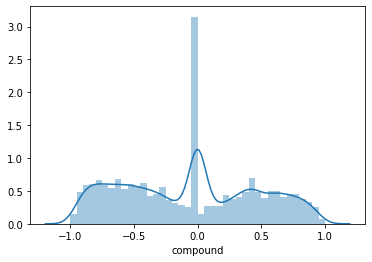

In [47]:
sns.distplot(df_1['compound']);

In [48]:
# sitive sentiment: compound score >= 0.05
# neutral sentiment: (compound score > -0.05) and (compound score < 0.05)
# negative sentiment: compound score <= -0.05

In [49]:
df_neu=df_1[(df_1['compound']< 0.05) & (df_1['compound']> -0.05)]
# df_neu

In [50]:
df_pos=df_1[(df_1['compound']>= 0.05)]
# df_pos

In [51]:
df_neg=df_1[(df_1['compound']< -0.05)]
# df_neg

In [52]:
# w2v_model.wv.most_similar(positive=['reopen'])

In [53]:
# sentences = [row.split() for row in df_neu['text_lemmatize_clean']]
# word_freq = defaultdict(int)
# for sent in sentences:
#     for i in sent:
#         word_freq[i] += 1
        
# sorted(word_freq, key=word_freq.get, reverse=True)[:10]

In [54]:
# sentences = [row.split() for row in df_pos['text_lemmatize_clean']]
# word_freq = defaultdict(int)
# for sent in sentences:
#     for i in sent:
#         word_freq[i] += 1
        
# sorted(word_freq, key=word_freq.get, reverse=True)[:10]

In [55]:
# sentences = [row.split() for row in df_neg['text_lemmatize_clean']]
# word_freq = defaultdict(int)
# for sent in sentences:
#     for i in sent:
#         word_freq[i] += 1
        
# sorted(word_freq, key=word_freq.get, reverse=True)[:10]

In [56]:
model_wv_df = pd.DataFrame(w2v_model[w2v_model.wv.vocab], list(w2v_model.wv.vocab))
model_wv_df

C:\Users\Che10\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
trump,-0.072630,0.020089,0.041711,-0.053502,0.131435,0.022920,-0.035175,-0.021357,0.059712,-0.114424,...,-0.062102,0.018539,0.236043,-0.086840,-0.060060,0.023252,0.006143,-0.174280,-0.125685,-0.043948
say,-0.031924,0.074135,0.049790,0.094048,-0.102999,0.013399,0.139173,0.070151,-0.008545,-0.204477,...,-0.055701,0.032462,0.020149,0.111769,-0.119679,0.008284,0.151092,0.019185,-0.109095,-0.101825
think,0.058112,-0.013448,-0.059359,0.064321,-0.076779,0.147193,0.131414,0.189543,0.017657,-0.101504,...,-0.064303,0.041823,-0.139153,0.100446,-0.035003,-0.035815,0.120186,-0.060992,-0.019734,-0.044476
michigan,-0.018340,0.166804,0.115390,0.146366,-0.032137,0.073736,-0.119248,-0.109502,0.020392,0.111073,...,0.044430,0.150626,0.015981,0.024373,0.040448,-0.087519,0.200402,0.040086,0.084560,-0.094959
dem,-0.150999,-0.078979,0.061768,0.087098,0.160323,0.098388,-0.138493,0.047524,-0.043758,0.099883,...,-0.167980,0.048923,0.127764,-0.042862,0.023713,-0.110669,-0.018302,0.011105,0.015873,-0.174436
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
morgans,0.067227,0.164766,-0.053856,-0.003420,-0.100548,-0.051664,-0.083482,-0.065454,0.034281,-0.028771,...,-0.022019,-0.033781,0.064630,0.000211,0.022011,0.030890,0.076459,-0.133911,-0.024808,-0.095879
arouse,-0.019641,0.146193,-0.195993,-0.131253,-0.075941,-0.012712,0.034892,0.044655,-0.048872,0.001179,...,0.126811,0.005560,-0.058385,0.040659,-0.043071,0.002167,0.067729,-0.111262,-0.010574,-0.024314
trumpcoronavirustestfailure,0.060133,0.116273,0.034121,-0.022367,-0.056255,-0.075620,-0.125592,-0.029261,0.090447,-0.172340,...,0.047955,-0.023649,0.068621,0.063199,-0.042915,0.002035,0.160860,-0.036144,-0.040860,-0.028976
audits,0.008937,0.197165,0.079348,-0.044771,-0.009554,0.001097,-0.200207,-0.056291,0.132288,-0.087439,...,0.134713,-0.038983,0.060202,-0.028749,0.002498,0.025332,0.099844,0.050054,0.101289,-0.036406


In [57]:
# for economy
keywords = ["economy", "not", "people", "open",\
            "coronavirus", "work", "back", "reopen",\
            "like", "need", "state", 'plan', 'money', 'new', 'die', 'want','trump','go','get']
words = [word for word in keywords if word in list(w2v_model.wv.vocab)]

In [58]:
# # for china
# keywords = ['china', 'coronavirus', 'virus','people', 'trump', 'not', 'chinese','ccp','like','people','communist','chinese','china','ban','blame','travel','market','lie','racist','wuhan']
# words = [word for word in keywords if word in list(w2v_model.wv.vocab)]

In [59]:
# # for virus
# keywords = ["trump", "realdonaldtrump", "coronavirus", "die",\
#             "coronavirus", "death", "come", "china",\
#             "get", "corona", "spread", 'people', 'via', 'go', 'die', 'good','not','go','test','kill','pandemic','chinese']
# words = [word for word in keywords if word in list(w2v_model.wv.vocab)]

In [60]:
# # for trump leader
# keywords = ['china','death', 'coronavirus', 'virus','hate','die','people', 'trump', 'blame','trade', 'chinese','ccp','halt','fund','funding' ,'people','communist','chinese','china','realdonaldtrump','ban','trade','travel','pandemic','lie','biden','racist','company','wuhan']
# words = [word for word in keywords if word in list(w2v_model.wv.vocab)]

In [61]:
# # for boris leader
# keywords = ['china','death', 'coronavirus', 'virus','wrong','man','time','hate','tory', 'boris','time','petition','ban', 'chinese','ban','crisis','wrong','government','borisjohnson','bail','sign','brexit','nhs','childcare','richard','lockdown','chinese','china','pandemic','petition','piersmorgan']
# words = [word for word in keywords if word in list(w2v_model.wv.vocab)]

In [62]:
# # for modi leader
# keywords = ['china','death','ji','worker' ,'coronavirus', 'corona','hate','extend','die','narendramodi','muslim', 'modi', 'tough','decision','social','distancing','lockdown','gandhi','blame','china','fake','migrant','anti','news','ban','spread','travel','lie','company']
# words = [word for word in keywords if word in list(w2v_model.wv.vocab)]

In [63]:
from sklearn.decomposition import PCA
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.express as px


X = model_wv_df.T[words].T
pca = PCA(n_components=2)
result = pca.fit_transform(X)
df = pd.DataFrame(result, columns
                  =["Component 1", "Component 2"])
df["Word"] = keywords
df["Distance"] = np.sqrt(df["Component 1"]**2 + df["Component 2"]**2)
fig = px.scatter(df, x="Component 1", y="Component 2", text="Word", color="Distance", color_continuous_scale="agsunset",size="Distance")
fig.update_traces(textposition='top center')
fig.layout.xaxis.autorange = True
fig.data[0].marker.line.width = 1
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.update_layout(height=800, title_text="Word groupings for === ", template="plotly_white", paper_bgcolor="#f0f0f0")
fig.show()

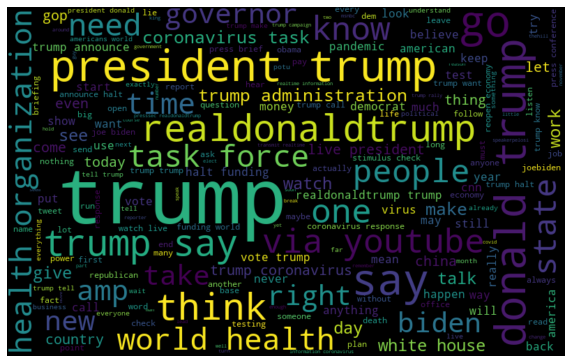

In [64]:
all_words = ' '.join([text for text in df_neu['text_lemmatize_clean']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

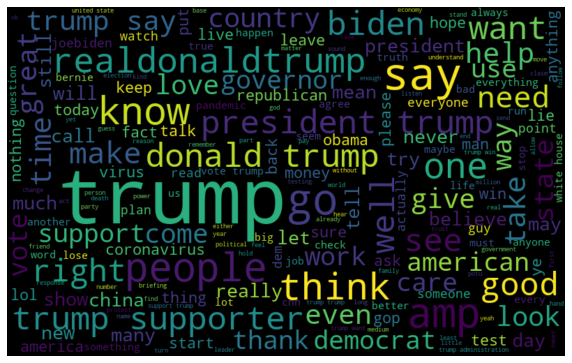

In [65]:
all_words = ' '.join([text for text in df_pos['text_lemmatize_clean']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

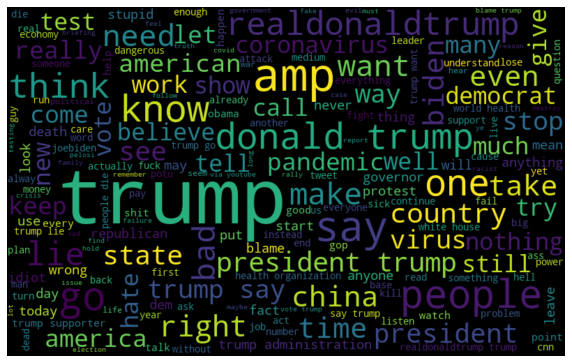

In [66]:
all_words = ' '.join([text for text in df_neg['text_lemmatize_clean']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [67]:
def select_sentiment(value):
    
    if value>= 0.05:
        return 1
    elif value > -0.05 :
        return 0
    else:
        return -1

In [68]:
# sitive sentiment: compound score >= 0.05
# neutral sentiment: (compound score > -0.05) and (compound score < 0.05)
# negative sentiment: compound score <= -0.05

In [69]:
df_1['sentiment'] = np.array([select_sentiment(p) for p in df_1['compound']])

In [70]:
df_1

,date,tweet,created,fav,number of retweets,location,follower,verified,language,hashtags,length,tidy_tweet,text_lemmatize,text_lemmatize_clean,negative,neutral,positive,compound,sentiment
0,14,Trump says think Michigan Dem vote 'Sleepy Joe...,8,0,0,USA,3353,False,en,[],120,trump says think michigan dem vote sleepy joe ...,trump say think michigan dem vote sleepy joe s...,trump say think michigan dem vote sleepy joe s...,0.000,0.872,0.128,0.2960,1
1,14,@WhiteHouse Lie. Deflect. Attack. Standard tru...,6,0,0,USA,40,False,en,[],69,whitehouse lie deflect attack standard trump o...,whitehouse lie deflect attack standard trump o...,whitehouse lie deflect attack standard trump o...,0.307,0.693,0.000,-0.4767,-1
2,14,"Here go again, Trumps blame game. Now W.H.O., ...",18,0,0,USA,35,False,en,[],246,go trumps blame game sided much china unlike r...,go trumps blame game side much china unlike re...,go trumps blame game side much china unlike re...,0.062,0.828,0.110,0.4278,1
3,14,@MysterySolvent Casting blame. Trump loves ide...,12,0,0,USA,1984,False,en,[],95,mysterysolvent casting blame trump loves idea ...,mysterysolvent casting blame trump love idea a...,mysterysolvent casting blame trump love idea a...,0.126,0.421,0.453,0.7351,1
4,14,@DeanObeidallah Most Republicans lost minds. I...,6,0,0,USA,40,False,en,[],82,deanobeidallah republicans lost minds happens ...,deanobeidallah republicans lose mind happen tr...,deanobeidallah republicans lose mind happen tr...,0.190,0.810,0.000,-0.3774,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48990,20,@DonaldJTrumpJr Trump kids committing crimes a...,17,0,0,USA,274,False,en,[],108,donaldjtrumpjr trump kids committing crimes ab...,donaldjtrumpjr trump kid commit crime abuse ex...,donaldjtrumpjr trump kid commit crime abuse ex...,0.114,0.837,0.049,-0.4019,-1
48991,20,People retweeting Biden / Trump polling number...,30,2,0,USA,465,False,en,[],90,people retweeting biden trump polling numbers ...,people retweete biden trump polling number lik...,people retweete biden trump polling number lik...,0.000,0.699,0.301,0.5755,1
48992,20,@wickedwitchkck @jennyrachelpal @Canupstra @re...,8,0,0,USA,136,False,en,[],180,wickedwitchkck jennyrachelpal canupstra realdo...,wickedwitchkck jennyrachelpal canupstra realdo...,wickedwitchkck jennyrachelpal canupstra realdo...,0.100,0.679,0.221,0.5267,1
48993,20,"@scaryfoxx He made decision me, blocked coming...",30,6,1,USA,15570,False,en,[],115,scaryfoxx made decision blocked coming facts b...,scaryfoxx make decision block coming fact bide...,scaryfoxx make decision block coming fact bide...,0.178,0.578,0.244,0.3612,1


In [72]:
# plt.figure(figsize=(6,4))
# plt.title('Tweet length based on sentiment')
# sns.barplot(x='sentiment',y='length',data=df_1)

In [73]:
# plt.figure(figsize=(10,7))
# plt.title('Distribution of tweet length based on sentiment')
# sns.boxplot(x="sentiment", y="length", data=df_1)

In [74]:
pos_tweets= [ tweet for index, tweet in enumerate(df_1['sentiment']) if df_1['sentiment'][index] == 1]
nue_tweets= [ tweet for index, tweet in enumerate(df_1['sentiment']) if df_1['sentiment'][index] == 0]
neg_tweets= [ tweet for index, tweet in enumerate(df_1['sentiment']) if df_1['sentiment'][index] == -1]
pos_percentage = len(pos_tweets)*100/len(df_1)
nue_percentage = len(nue_tweets)*100/len(df_1)
neg_percentage = len(neg_tweets)*100/len(df_1)

<Figure size 432x288 with 0 Axes>

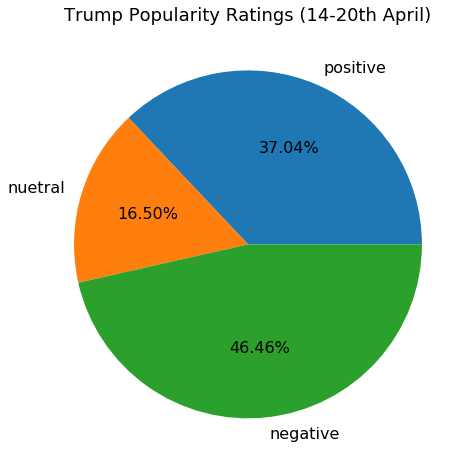

<Figure size 432x288 with 0 Axes>

In [75]:
fig = plt.figure()
percentage = pd.Series([pos_percentage,nue_percentage,neg_percentage], 
                      index=['positive','nuetral','negative'],name='')
percentage.plot.pie(fontsize=16, autopct='%.2f%%', figsize=(8,8));
# plt.title('Trump Popularity Ratings (14-20th April)',fontsize=18)
# plt.savefig('modi_final_rating.pdf')
plt.figure()

In [76]:
df_pos=df_1[df_1['sentiment']==1]
# df_pos

In [77]:
df_neg=df_1[df_1['sentiment']==-1]
# df_neg

In [78]:
df_neu=df_1[df_1['sentiment']==0]
# df_neu

In [79]:
def get_top_n_bigram_pos(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_bigram_pos(df_pos['text_lemmatize_clean'], 60)
for word, freq in common_words:
    print(word, freq)
df2 = pd.DataFrame(common_words, columns = ['word' , 'count'])

trump supporter 878
president trump 864
donald trump 825
trump say 638
like trump 403
vote trump 290
trump win 238
trump administration 238
white house 236
united states 216
support trump 214
trump want 209
look like 205
realdonaldtrump trump 194
say trump 192
trump make 163
think trump 157
trump think 149
trump like 144
trump amp 127
know trump 127
trump good 127
joe biden 126
stimulus check 123
sound like 122
trump know 120
presssec realdonaldtrump 120
trump campaign 119
world health 117
president donald 116
social distancing 116
love trump 115
trump president 111
american people 108
make sure 108
press conference 107
vote biden 106
stay home 106
trump rally 106
trump tell 105
health organization 105
task force 105
biden trump 100
trump love 97
trump try 97
thing trump 95
great job 94
small business 94
trump biden 93
god bless 93
year trump 92
good job 92
thank god 90
act like 90
trump support 90
watch trump 88
trump trump 87
pre trump 87
trump care 86
people like 86


In [80]:
def get_top_n_bigram_neg(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_bigram_pos(df_neg['text_lemmatize_clean'], 80)
for word, freq in common_words:
    print(word, freq)
df2 = pd.DataFrame(common_words, columns = ['word' , 'count'])

donald trump 1103
president trump 713
trump say 688
trump administration 473
trump supporter 399
realdonaldtrump trump 354
say trump 299
health organization 284
world health 284
trump lie 284
people die 268
trump want 265
white house 259
blame trump 236
vote trump 227
like trump 215
trump blame 208
trump know 206
hate trump 196
trump make 191
think trump 188
trump try 181
fake news 176
trump amp 175
presssec realdonaldtrump 174
trump threaten 173
stay home 168
joe biden 161
american people 156
know trump 154
stimulus check 153
trump tell 148
fox news 140
new york 139
travel ban 139
press conference 137
trump kill 134
die trump 126
trump bad 126
public health 126
nancy pelosi 124
americans die 123
support trump 122
trump fail 121
bad trump 118
trump rally 118
halt funding 116
trump lose 116
whitehouse realdonaldtrump 115
washington post 115
trump use 114
watch trump 111
trump admin 110
trump tweet 107
trump think 106
year trump 106
reopen economy 105
trump coronavirus 102
lie trump 102


In [81]:
def get_top_n_bigram_neu(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_bigram_pos(df_neu['text_lemmatize_clean'], 90)
for word, freq in common_words:
    print(word, freq)
df2 = pd.DataFrame(common_words, columns = ['word' , 'count'])

president trump 504
donald trump 460
trump say 358
task force 246
world health 236
health organization 232
trump administration 198
coronavirus task 196
white house 178
trump coronavirus 169
live president 157
realdonaldtrump trump 134
halt funding 130
trump announce 117
vote trump 108
coronavirus response 100
reopen economy 96
trump want 96
press conference 94
press brief 86
trump halt 84
watch live 79
funding world 73
coronavirus trump 72
joe biden 72
trump know 70
stimulus check 67
say trump 65
announce halt 64
trump tell 64
president donald 62
trump make 62
tell trump 62
americans world 62
trump rally 59
presssec realdonaldtrump 58
realtime information 57
transmit realtime 56
trump campaign 54
think trump 54
information coronavirus 54
halt fund 52
plan reopen 51
press briefing 50
trump amp 50
force hold 50
organization transmit 50
pende review 49
trump right 48
pre trump 48
trump president 47
coronavirus pandemic 46
fund world 45
watch trump 45
news conference 44
new york 44
trump 